In [103]:
mkdir /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/

mkdir: cannot create directory `/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/': File exists


In [104]:
import modish
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from modish.visualize import MODALITY_TO_COLOR, MODALITY_ORDER, MODALITY_PALETTE
modality_order = MODALITY_ORDER

sns.set(style='ticks', context='talk', rc={'font.sans-serif':'Arial', 'pdf.fonttype': 42})

%matplotlib inline

%load_ext autoreload
%autoreload 2

folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages'

import flotilla
study = flotilla.embark('singlecell_pnm_figure2_modalities')
# study = flotilla.embark('singlecell_pnm_figure1_supplementary_post_splicing_filtering')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
2015-09-25 11:35:01	Reading datapackage from /home/obotvinnik/flotilla_projects/singlecell_pnm_figure2_modalities/datapackage.json
2015-09-25 11:35:01	Parsing datapackage to create a Study object
2015-09-25 11:35:54	Initializing Study
2015-09-25 11:35:54	Initializing Predictor configuration manager for Study
2015-09-25 11:35:54	Predictor ExtraTreesClassifier is of type <class 'sklearn.ensemble.forest.ExtraTreesClassifier'>
2015-09-25 11:35:54	Added ExtraTreesClassifier to default predictors
2015-09-25 11:35:54	Predictor ExtraTreesRegressor is of type <class 'sklearn.ensemble.forest.ExtraTreesRegressor'>
2015-09-25 11:35:54	Added ExtraTreesRegressor to default predictors
2015-09-25 11:35:54	Predictor GradientBoostingClassifier is of type <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>
2015-09-25 11:35:54	Added GradientBoostingClassifier to default predictors
2015-09-25 11:35:5

In [105]:
study.supplemental.modalities_tidy.modality.unique()

array(['~1', 'bimodal', '~0', 'multimodal'], dtype=object)

In [106]:
study.supplemental.modalities_tidy.loc[:, 'modality'] = \
    study.supplemental.modalities_tidy.modality.replace('ambiguous', 'multimodal')

## Get events with a predicted modality in all celltypes

In [107]:
modalities_all_celltypes = study.supplemental.modalities_tidy.groupby('event_name').filter(
    lambda x: len(x.phenotype.unique()) == len(study.phenotype_order))

## Calculate *voyage* space via `bon voyage`

In [108]:
%time nmf_space_postions = study.nmf_space_positions()

CPU times: user 1min 36s, sys: 191 ms, total: 1min 36s
Wall time: 1min 36s


In [109]:
nmf_positions_tidy = nmf_space_postions.reset_index()
nmf_positions_tidy = nmf_positions_tidy.rename(columns={'level_0': 'event_name'})
nmf_positions_tidy.head()

,event_name,phenotype,pc_1,pc_2
0,exon:chr10:100190328-100190427:-@exon:chr10:10...,iPSC,0.019785,0.086156
1,exon:chr10:100190328-100190427:-@exon:chr10:10...,iPSC,0.019785,0.086156
2,exon:chr10:100190328-100190427:-@exon:chr10:10...,iPSC,0.019785,0.086156
3,exon:chr10:100193697-100193848:-@exon:chr10:10...,iPSC,0.067315,0.011513
4,exon:chr10:101165513-101165617:-@exon:chr10:10...,MN,0.079180,0.000000


#### Create specific phenotype transitions

In [110]:
phenotype_transitions = study.phenotype_transitions + [('iPSC', 'MN')]
phenotype_transitions

[(u'iPSC', u'NPC'), (u'NPC', u'MN'), ('iPSC', 'MN')]

In [111]:
%time nmf_space_distances = study.nmf_space_transitions(phenotype_transitions=phenotype_transitions)

CPU times: user 1min 55s, sys: 278 ms, total: 1min 55s
Wall time: 1min 56s


In [112]:
nmf_distances_tidy = nmf_space_distances.unstack().reset_index()
nmf_distances_tidy = nmf_distances_tidy.rename(columns={'level_0': 'transition', 'level_1': 'event_name', 0:'distance'})
nmf_distances_tidy.head()

,transition,event_name,distance
0,"(iPSC, NPC)",exon:chr10:101165513-101165617:-@exon:chr10:10...,0.002635
1,"(iPSC, NPC)",exon:chr10:101480744-101480825:-@exon:chr10:10...,0.016448
2,"(iPSC, NPC)",exon:chr10:102114184-102114389:+@exon:chr10:10...,0.002994
3,"(iPSC, NPC)",exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000
4,"(iPSC, NPC)",exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000


In [113]:
nmf_distances_tidy['transition'] = nmf_distances_tidy.transition.map(lambda x: '-'.join(x))
nmf_distances_tidy.head()

,transition,event_name,distance
0,iPSC-NPC,exon:chr10:101165513-101165617:-@exon:chr10:10...,0.002635
1,iPSC-NPC,exon:chr10:101480744-101480825:-@exon:chr10:10...,0.016448
2,iPSC-NPC,exon:chr10:102114184-102114389:+@exon:chr10:10...,0.002994
3,iPSC-NPC,exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000
4,iPSC-NPC,exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000


In [114]:
# modalities_tidy = pd.read_csv('/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure2_modalities/modalities_tidy.csv')
# modalities_tidy.head()

In [115]:
cols = ['event_name', 'phenotype']
nmf_positions_modalities = nmf_positions_tidy.merge(study.supplemental.modalities_tidy, left_on=cols, right_on=cols)
nmf_positions_modalities.head()

,event_name,phenotype,pc_1,pc_2,modality,n_cells
0,exon:chr10:101165513-101165617:-@exon:chr10:10...,NPC,0.079180,0.000000,~1,22
1,exon:chr10:101165513-101165617:-@exon:chr10:10...,iPSC,0.076545,0.000035,~1,30
2,exon:chr10:101480744-101480825:-@exon:chr10:10...,NPC,0.067866,0.016395,bimodal,20
3,exon:chr10:101480744-101480825:-@exon:chr10:10...,iPSC,0.069894,0.000073,~1,34
4,exon:chr10:101507014-101507147:+@exon:chr10:10...,iPSC,0.047605,0.011661,bimodal,40


### Set x- and y-label of axes

In [116]:
voyage_space_xlabel = '~0'
voyage_space_ylabel = '~1'

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_MN.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_NPC.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_iPSC.pdf


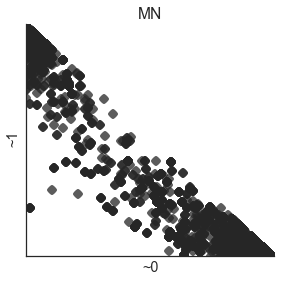

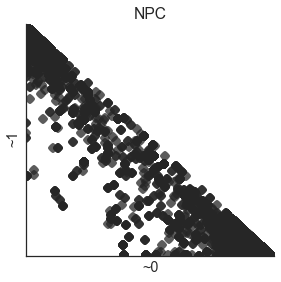

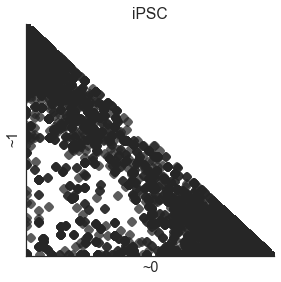

In [117]:
from modish.visualize import MODALITY_ORDER
import matplotlib as mpl

order = MODALITY_ORDER[:-1]


# folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf'

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, ax = plt.subplots(figsize=(4, 4))
    
    xmax = 0
    ymax = 0
    
#     for modality, modality_df in phenotype_df.groupby('modality'):
    x = phenotype_df.pc_1
    y = phenotype_df.pc_2
    xmax = max(x.max(), xmax)
    ymax = max(y.max(), ymax)
    ax.plot(x, y, 'o', color='#262626', alpha=0.75)
    pdf = '{}/nmf_positions_{}.pdf'.format(folder, phenotype)
    print pdf
    ax.legend(ncol=2, columnspacing=.5)
    sns.despine()
    ax.set(xlabel=voyage_space_xlabel, ylabel=voyage_space_ylabel, 
           xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax), title=phenotype)
    fig.tight_layout()
    fig.savefig(pdf)

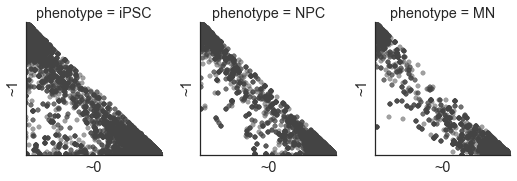

In [118]:
g = sns.FacetGrid(nmf_positions_modalities, col='phenotype', col_order=study.phenotype_order,
                  margin_titles=True, palette=MODALITY_PALETTE, aspect=0.9)
g.map(plt.scatter, 'pc_1', 'pc_2', color='#444444', alpha=0.5)
g.fig.tight_layout()

xmax = nmf_positions_modalities.pc_1.max()
ymax = nmf_positions_modalities.pc_2.max()

for ax in g.axes.flat:
    if ax.is_first_col():
        g.set(ylabel=voyage_space_ylabel, yticks=[])
    if ax.is_last_row():
        g.set(xlabel=voyage_space_xlabel, xticks=[])
g.set(xlim=(0, xmax), ylim=(0, ymax))
g.savefig('{}/voyage_space_positions_hexbin.pdf'.format(folder))

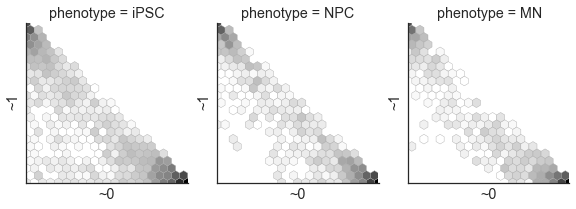

In [119]:
g = sns.FacetGrid(nmf_positions_modalities, col='phenotype', col_order=study.phenotype_order,
                  margin_titles=True, palette=MODALITY_PALETTE, aspect=0.9)
g.map(plt.hexbin, 'pc_1', 'pc_2', gridsize=20, mincnt=1, bins='log', edgecolor='darkgrey',)

for ax in g.axes.flat:
    if ax.is_first_col():
        g.set(ylabel=voyage_space_ylabel, yticks=[])
    if ax.is_last_row():
        g.set(xlabel=voyage_space_xlabel, xticks=[])
g.fig.tight_layout()
g.savefig('{}/voyage_space_positions_hexbin.pdf'.format(folder))

### Plot *voyage space* positions with modality colors

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_MN.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_NPC.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_iPSC.pdf


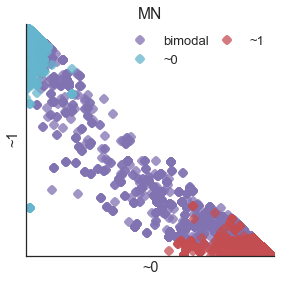

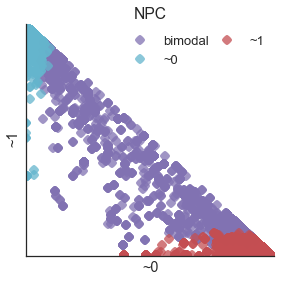

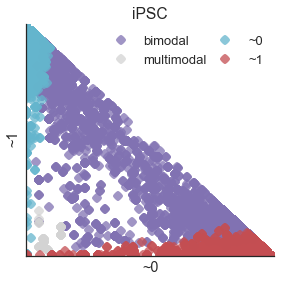

In [120]:
from modish.visualize import MODALITY_ORDER, MODALITY_TO_COLOR
import matplotlib as mpl


# folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf'

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, ax = plt.subplots(figsize=(4, 4))
    
    xmax = 0
    ymax = 0
    
    for modality, modality_df in phenotype_df.groupby('modality'):
        x = modality_df.pc_1
        y = modality_df.pc_2
        xmax = max(x.max(), xmax)
        ymax = max(y.max(), ymax)
        ax.plot(x, y, 'o', color=MODALITY_TO_COLOR[modality], alpha=0.75, label=modality)
    pdf = '{}/nmf_positions_modalities_{}.pdf'.format(folder, phenotype)
    print pdf
    ax.legend(ncol=2, columnspacing=.5)
    sns.despine()
    ax.set(xlabel=voyage_space_xlabel, ylabel=voyage_space_ylabel, 
           xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax), title=phenotype)
    fig.tight_layout()
    fig.savefig(pdf)

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_MN_kde.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_NPC_kde.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_iPSC_kde.pdf


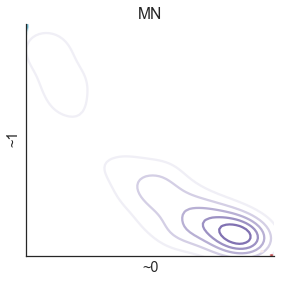

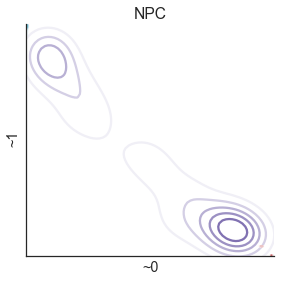

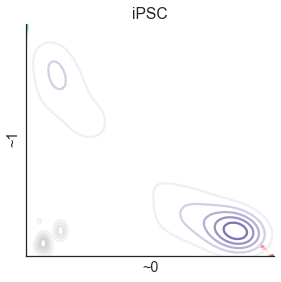

In [121]:
from modish.visualize import MODALITY_ORDER, MODALITY_PALETTE, MODALITY_TO_COLOR
import matplotlib as mpl

palette = MODALITY_PALETTE


# folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf'

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, ax = plt.subplots(figsize=(4, 4))
    
    xmax = 0
    ymax = 0
    
    for modality, modality_df in phenotype_df.groupby('modality'):
        x = modality_df.pc_1
        y = modality_df.pc_2
        xmax = max(x.max(), xmax)
        ymax = max(y.max(), ymax)
        
        cmap = sns.light_palette(MODALITY_TO_COLOR[modality], as_cmap=True)
        sns.kdeplot(x, y, cmap=cmap, shade_lowest=False, n_levels=5)
    pdf = '{}/nmf_positions_modalities_{}_kde.pdf'.format(folder, phenotype)
    print pdf
    ax.legend(ncol=2, columnspacing=.5)
    sns.despine()
    ax.set(xlabel=voyage_space_xlabel, ylabel=voyage_space_ylabel, 
           xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax), title=phenotype)
    fig.tight_layout()
    fig.savefig(pdf)

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_MN_hexbin.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_NPC_hexbin.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_iPSC_hexbin.pdf


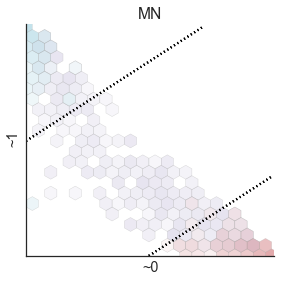

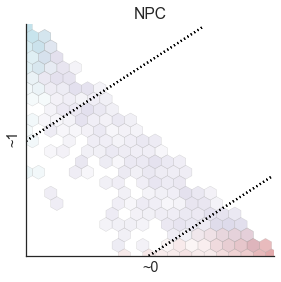

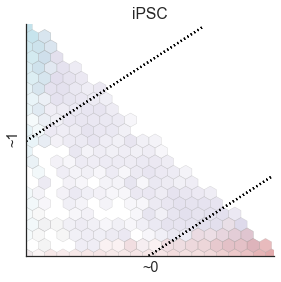

In [122]:
from modish.visualize import MODALITY_ORDER, MODALITY_PALETTE
import matplotlib as mpl

palette = MODALITY_PALETTE


# folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf'

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, ax = plt.subplots(figsize=(4, 4))
    
    xmax = 0
    ymax = 0
    xmax = phenotype_df.pc_1.max()
    ymax = phenotype_df.pc_2.max()

    xhalf = xmax/2.
    yhalf = ymax/2.
    vmax = np.log10(phenotype_df.groupby('modality').size().max()+1)
    
#     X, Y = np.meshgrid(np.arange(0, xmax, 0.001), np.arange(0, ymax, 0.001))
    
    for modality, modality_df in phenotype_df.groupby('modality'):
        x = modality_df.pc_1
        y = modality_df.pc_2
        
        cmap = sns.light_palette(MODALITY_TO_COLOR[modality], as_cmap=True)
        ax.hexbin(x, y, cmap=cmap, gridsize=20, mincnt=1, bins='log', 
                  edgecolor='darkgrey', vmax=vmax,
#                   marginals=True,
                  alpha=0.5, extent=(0, xmax, 0, ymax))
        ax.plot([xhalf, xmax], [0, xhalf], color='k', linestyle='dotted')
        ax.plot([0, yhalf], [yhalf, ymax], color='k', linestyle='dotted')
        
    pdf = '{}/nmf_positions_modalities_{}_hexbin.pdf'.format(folder, phenotype)
    print pdf
    ax.legend(ncol=2, columnspacing=.5)
    sns.despine()
    ax.set(xlabel=voyage_space_xlabel, ylabel=voyage_space_ylabel, 
           xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax), title=phenotype)
    fig.tight_layout()
    fig.savefig(pdf)

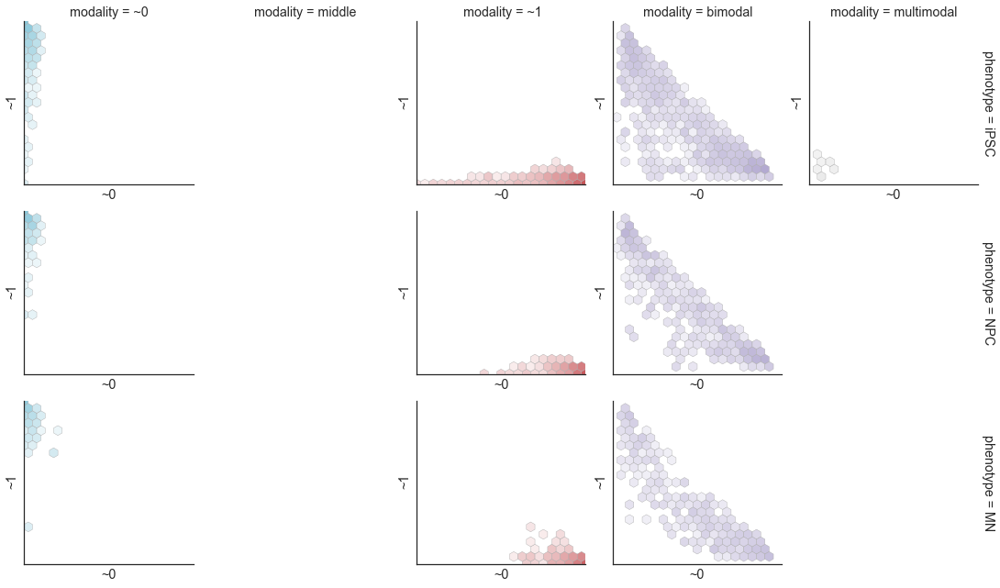

In [123]:
def hexbin(x, y, *args, **kwargs):
    """Wrapper around hexbin to create a colormap from provided color in keyword arguments"""
#     print args, kwargs
    color = kwargs.pop('color', 'k')
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(x, y, cmap=cmap, **kwargs)

xmax = nmf_positions_modalities.pc_1.max()
ymax = nmf_positions_modalities.pc_2.max()



modality = 'modality'
phenotype = 'phenotype'
vmax = np.log10(nmf_positions_modalities.groupby([phenotype, modality]).size().max()+1)
hue_order=['bimodal', 'multimodal', 'middle', '~0', '~1']
palette = [MODALITY_TO_COLOR[m] for m in hue_order]

g = sns.FacetGrid(nmf_positions_modalities, col=modality, row=phenotype, 
                  row_order=study.phenotype_order,
                  margin_titles=True, col_order=MODALITY_ORDER, hue=modality, 
                  palette=MODALITY_PALETTE, hue_order=MODALITY_ORDER)
g.map(hexbin, 'pc_1', 'pc_2', gridsize=20, mincnt=1,
      bins='log', edgecolor='darkgrey', extent=(0, xmax, 0, ymax), vmax=vmax)

for ax in g.axes.flat:
    if len(ax.collections) == 0:
        ax.axis('off')
    if ax.is_first_col():
        g.set(ylabel=voyage_space_ylabel, yticks=[])
    if ax.is_last_row():
        g.set(xlabel=voyage_space_xlabel, xticks=[])

g.fig.tight_layout()
g.savefig('{}/voyage_space_positions_modalities_hexbin.pdf'.format(folder))

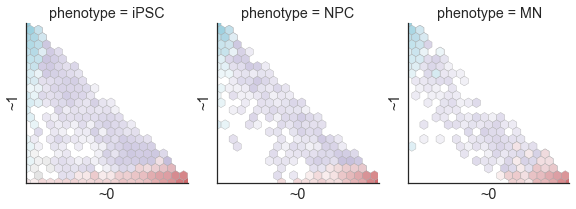

In [124]:
xmax = nmf_positions_modalities.pc_1.max()
ymax = nmf_positions_modalities.pc_2.max()

modality_to_color = MODALITY_TO_COLOR.copy()
modality_to_color['multimodal'] = 'darkgrey'

modality = 'modality'
phenotype = 'phenotype'
vmax = np.log10(nmf_positions_modalities.groupby([phenotype, modality]).size().max()+1)
hue_order=['bimodal', 'multimodal', 'middle', '~0', '~1']
palette = [modality_to_color[m] for m in hue_order]

g = sns.FacetGrid(nmf_positions_modalities, #col=modality, 
                  col=phenotype,aspect=0.9,
                  margin_titles=True, col_order=study.phenotype_order, hue=modality, 
                  palette=palette, hue_order=hue_order)
g.map(hexbin, 'pc_1', 'pc_2', gridsize=20, mincnt=1,
      bins='log', edgecolor='darkgrey',
      extent=(0, xmax, 0, ymax), vmax=vmax, alpha=0.9)

for ax in g.axes.flat:
    if len(ax.collections) == 0:
        ax.axis('off')
    if ax.is_first_col():
        g.set(ylabel=voyage_space_ylabel, yticks=[])
    if ax.is_last_row():
        g.set(xlabel=voyage_space_xlabel, xticks=[])
g.fig.tight_layout()
g.savefig('{}/voyage_space_positions_modalities_hexbin_stacked.pdf'.format(folder))



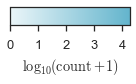

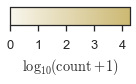

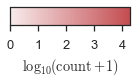

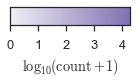

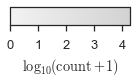

In [125]:
for modality in MODALITY_ORDER:
    fig, ax = plt.subplots(figsize=(2, 1.25))
    # Set the colormap and norm to correspond to the data for which
    # the colorbar will be used.
    cmap = sns.light_palette(MODALITY_TO_COLOR[modality], as_cmap=True)
    norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

    # ColorbarBase derives from ScalarMappable and puts a colorbar
    # in a specified axes, so it has everything needed for a
    # standalone colorbar.  There are many more kwargs, but the
    # following gives a basic continuous colorbar with ticks
    # and labels.
    cb = mpl.colorbar.ColorbarBase(ax, cmap=cmap, ticks=np.arange(5),
                                       norm=norm,
                                       orientation='horizontal')
    cb.set_label('$\log_{10}(\mathrm{count}+1)$')
    fig.tight_layout()
    fig.savefig('{}/voyage_space_positions_modalities_hexbin_colorbar_{}.pdf'.format(folder, modality))

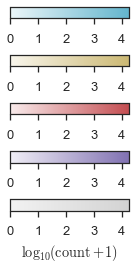

In [126]:
width = 2
height = .75
nrows = len(MODALITY_ORDER)

fig, axes = plt.subplots(figsize=(width, height*nrows), nrows=nrows)

for modality, ax in zip(MODALITY_ORDER, axes):
    
    # Set the colormap and norm to correspond to the data for which
    # the colorbar will be used.
    cmap = sns.light_palette(MODALITY_TO_COLOR[modality], as_cmap=True)
    norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

    # ColorbarBase derives from ScalarMappable and puts a colorbar
    # in a specified axes, so it has everything needed for a
    # standalone colorbar.  There are many more kwargs, but the
    # following gives a basic continuous colorbar with ticks
    # and labels.
    cb = mpl.colorbar.ColorbarBase(ax, cmap=cmap, ticks=np.arange(5),
                                       norm=norm,
                                       orientation='horizontal')
    if ax.is_last_row():
        cb.set_label('$\log_{10}(\mathrm{count}+1)$')
    fig.tight_layout()
    fig.savefig('{}/voyage_space_positions_modalities_hexbin_colorbar_{}.pdf'.format(folder, modality))

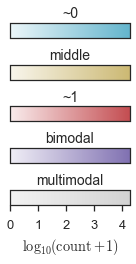

In [127]:
width = 2
height = .75
nrows = len(MODALITY_ORDER)

fig, axes = plt.subplots(figsize=(width, height*nrows), nrows=nrows)

for modality, ax in zip(MODALITY_ORDER, axes):
    
    # Set the colormap and norm to correspond to the data for which
    # the colorbar will be used.
    cmap = sns.light_palette(MODALITY_TO_COLOR[modality], as_cmap=True)
    norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

    # ColorbarBase derives from ScalarMappable and puts a colorbar
    # in a specified axes, so it has everything needed for a
    # standalone colorbar.  There are many more kwargs, but the
    # following gives a basic continuous colorbar with ticks
    # and labels.
    ticks = np.arange(5) if ax.is_last_row() else []
    cb = mpl.colorbar.ColorbarBase(ax, cmap=cmap, ticks=ticks,
                                       norm=norm,
                                       orientation='horizontal')
    ax.set_title(modality, fontsize=14)
    if ax.is_last_row():
        cb.set_label('$\log_{10}(\mathrm{count}+1)$')
fig.tight_layout()
fig.savefig('{}/voyage_space_positions_modalities_hexbin_colorbar_all.pdf'.format(folder, modality))

### Plot events with $\mathrm{mean}\left| \Psi_{\text{pooled}} - \Psi_{\text{singles}}\right| > \epsilon$

These are events which are inconsistent with the pooled samples, meaning the pooled samples alone would be insufficient to identify the change in distribution.

In [128]:
singles_grouped = study.splicing.singles.groupby(study.sample_id_to_phenotype)
pooled_grouped = study.splicing.pooled.groupby(study.sample_id_to_phenotype)

min_difference = 0.2

mean_diff_dfs = []

for phenotype, singles in singles_grouped:
    singles = singles.dropna(how='all',axis=1)
    pooled = pooled_grouped.get_group(phenotype).dropna(how='all', axis=1)
    
    singles, pooled = singles.align(pooled, axis=1, join='inner')
    mean_difference = pooled.apply(lambda x: singles.subtract(x, axis=1).abs().mean(axis=0), axis=1)
    
    mean_diff_df = mean_difference.unstack().reset_index()
    mean_diff_df['phenotype'] = phenotype
    mean_diff_dfs.append(mean_diff_df)
        
mean_diff_df = pd.concat(mean_diff_dfs)
mean_diff_df = mean_diff_df.rename(columns={0: 'mean diff', 'level_0': 'event_name', 
                                            'level_1':'pooled_id'})
mean_diff_df.head()

,event_name,pooled_id,mean diff,phenotype
0,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2_05,0.127263,MN
1,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2nd_13,0.002367,MN
2,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2nd_21,0.002367,MN
3,exon:chr10:101480744-101480825:-@exon:chr10:10...,M2_05,0.050000,MN
4,exon:chr10:101480744-101480825:-@exon:chr10:10...,M2nd_13,0.050000,MN


In [129]:
mean_diff_df['inconsistent_pooled'] = mean_diff_df['mean diff'] >= min_difference

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_MN_pooled_inconsistent.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_NPC_pooled_inconsistent.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_iPSC_pooled_inconsistent.pdf


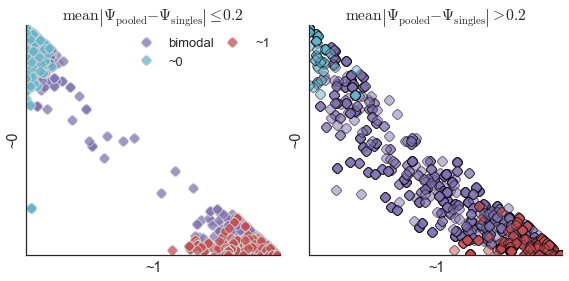

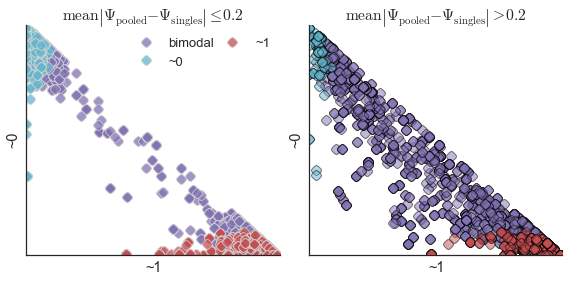

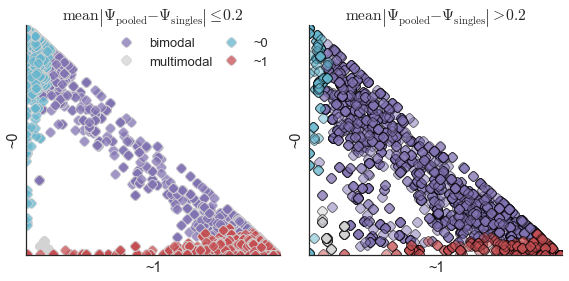

In [130]:



mean_diff_grouped = mean_diff_df.groupby('phenotype')

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, axes = plt.subplots(ncols=2, figsize=(8, 4))
    ax_consistent = axes[0]
    ax_inconsistent = axes[1]
    mean_diff = mean_diff_grouped.get_group(phenotype)
    
    xmax = 0
    ymax = 0
    
    for modality, modality_df in phenotype_df.groupby('modality'):
        modality_df = modality_df.set_index('event_name')
        x = modality_df.pc_1
        y = modality_df.pc_2
        xmax = max(x.max(), xmax)
        ymax = max(y.max(), ymax)
        color = MODALITY_TO_COLOR[modality]
        for inconsistent_pooled, df in mean_diff.groupby('inconsistent_pooled'):
            events = df.event_name.unique()
            x_subset = x[events]
            y_subset = y[events]
            if inconsistent_pooled:
                markeredgecolor = 'k'
                label = None
                ax_inconsistent.plot(x_subset, y_subset, 'o', color=color, alpha=0.5, label=label, 
                                     markeredgecolor=markeredgecolor, markeredgewidth=1, rasterized=True)
#                 ax.plot(x_subset, y_subset, 'o', color='#262626', alpha=0.5, label=None)
            else:
                markeredgecolor = 'lightgrey'
                label = modality
                ax_consistent.plot(x_subset, y_subset, 'o', color=color, alpha=0.75, label=label,
                                  markeredgecolor=markeredgecolor, markeredgewidth=1, rasterized=True)
            
#             print x_subset
            
    ax_consistent.set(title=r'$\mathrm{mean}\left| \Psi_{\mathrm{pooled}} - \Psi_{\mathrm{singles}}\right| \leq ' +
                      '{:.1f}$'.format(min_difference))
    ax_inconsistent.set(title=r'$\mathrm{mean}\left| \Psi_{\mathrm{pooled}} - \Psi_{\mathrm{singles}}\right| > ' +
                      '{:.1f}$'.format(min_difference))  
    for ax in axes:
        ax.legend(ncol=2, columnspacing=.5)
        sns.despine()
        ax.set(xlabel='~1', ylabel='~0', xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax))
    fig.tight_layout()

    pdf = '{}/nmf_positions_modalities_{}_pooled_inconsistent.pdf'.format(folder, phenotype)
    print pdf
    fig.savefig(pdf)

In [131]:
mean_diff_df.head()

,event_name,pooled_id,mean diff,phenotype,inconsistent_pooled
0,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2_05,0.127263,MN,False
1,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2nd_13,0.002367,MN,False
2,exon:chr10:101165513-101165617:-@exon:chr10:10...,M2nd_21,0.002367,MN,False
3,exon:chr10:101480744-101480825:-@exon:chr10:10...,M2_05,0.050000,MN,False
4,exon:chr10:101480744-101480825:-@exon:chr10:10...,M2nd_13,0.050000,MN,False


In [132]:
event_phenotype_inconsistent = mean_diff_df.groupby(['event_name', 'phenotype'])['inconsistent_pooled'].any()

In [133]:
nmf_positions_modalities_pooled_inconsistent = nmf_positions_modalities.set_index(['event_name', 'phenotype'])
nmf_positions_modalities_pooled_inconsistent['inconsistent_pooled'] = event_phenotype_inconsistent
nmf_positions_modalities_pooled_inconsistent.head()

pc_1  \
event_name                                         phenotype             
exon:chr10:101165513-101165617:-@exon:chr10:101... NPC        0.079180   
                                                   iPSC       0.076545   
exon:chr10:101480744-101480825:-@exon:chr10:101... NPC        0.067866   
                                                   iPSC       0.069894   
exon:chr10:101507014-101507147:+@exon:chr10:101... iPSC       0.047605   

                                                                  pc_2  \
event_name                                         phenotype             
exon:chr10:101165513-101165617:-@exon:chr10:101... NPC        0.000000   
                                                   iPSC       0.000035   
exon:chr10:101480744-101480825:-@exon:chr10:101... NPC        0.016395   
                                                   iPSC       0.000073   
exon:chr10:101507014-101507147:+@exon:chr10:101... iPSC       0.011661   

                                                             modality  \
event_name                                         phenotype            
exon:chr10:101165513-101165617:-@exon:chr10:101... NPC             ~1   
                                                   iPSC            ~1   
exon:chr10:101480744-101480825:-@exon:chr10:101... NPC        bimodal   
                                                   iPSC            ~1   
exon:chr10:101507014-101507147:+@exon:chr10:101... iPSC       bimodal   

                                                              n_cells  \
event_name                                         phenotype            
exon:chr10:101165513-101165617:-@exon:chr10:101... NPC             22   
                                                   iPSC            30   
exon:chr10:101480744-101480825:-@exon:chr10:101... NPC             20   
                                                   iPSC            34   
exon:chr10:101507014-101507147:+@exon:chr10:101... iPSC            40   

                                                             inconsistent_pooled  
event_name                                         phenotype                      
exon:chr10:101165513-101165617:-@exon:chr10:101... NPC                     False  
                                                   iPSC                    False  
exon:chr10:101480744-101480825:-@exon:chr10:101... NPC                     False  
                                                   iPSC                     True  
exon:chr10:101507014-101507147:+@exon:chr10:101... iPSC                     True

In [134]:
nmf_positions_modalities_pooled_inconsistent = nmf_positions_modalities_pooled_inconsistent.reset_index()
nmf_positions_modalities_pooled_inconsistent.head()

,event_name,phenotype,pc_1,pc_2,modality,n_cells,inconsistent_pooled
0,exon:chr10:101165513-101165617:-@exon:chr10:10...,NPC,0.079180,0.000000,~1,22,False
1,exon:chr10:101165513-101165617:-@exon:chr10:10...,iPSC,0.076545,0.000035,~1,30,False
2,exon:chr10:101480744-101480825:-@exon:chr10:10...,NPC,0.067866,0.016395,bimodal,20,False
3,exon:chr10:101480744-101480825:-@exon:chr10:10...,iPSC,0.069894,0.000073,~1,34,True
4,exon:chr10:101507014-101507147:+@exon:chr10:10...,iPSC,0.047605,0.011661,bimodal,40,True


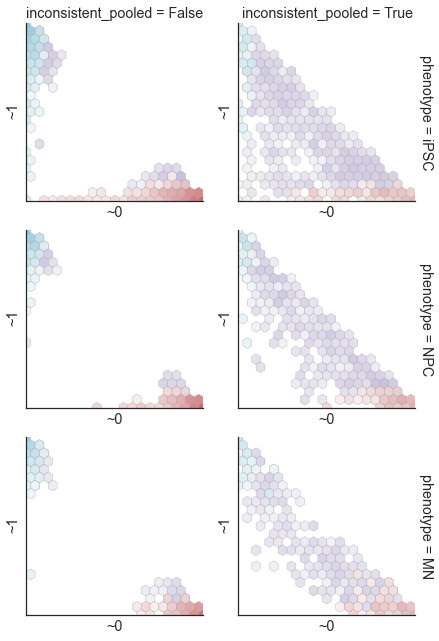

In [135]:
xmax = nmf_positions_modalities.pc_1.max()
ymax = nmf_positions_modalities.pc_2.max()

modality_to_color = MODALITY_TO_COLOR.copy()
modality_to_color['multimodal'] = 'darkgrey'

modality = 'modality'
phenotype = 'phenotype'
vmax = np.log10(nmf_positions_modalities_pooled_inconsistent.groupby([phenotype, modality]).size().max()+1)
hue_order=['bimodal', 'multimodal', 'middle', '~0', '~1']
palette = [modality_to_color[m] for m in hue_order]

g = sns.FacetGrid(nmf_positions_modalities_pooled_inconsistent, 
                  row=phenotype, aspect=1, col='inconsistent_pooled',
                  margin_titles=True, row_order=study.phenotype_order, hue=modality, 
                  palette=palette, hue_order=hue_order)
g.map(hexbin, 'pc_1', 'pc_2', gridsize=20, mincnt=1,
      bins='log', edgecolor='darkgrey',
      extent=(0, xmax, 0, ymax), vmax=vmax, alpha=0.9)

for ax in g.axes.flat:
    if len(ax.collections) == 0:
        ax.axis('off')
    if ax.is_first_col():
        g.set(ylabel=voyage_space_ylabel, yticks=[])
    if ax.is_last_row():
        g.set(xlabel=voyage_space_xlabel, xticks=[])
g.fig.tight_layout()
g.savefig('{}/voyage_space_positions_modalities_hexbin_stacked_inconsistent_pooled.pdf'.format(folder))

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_MN_pooled_inconsistent.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_NPC_pooled_inconsistent.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_positions_modalities_iPSC_pooled_inconsistent.pdf


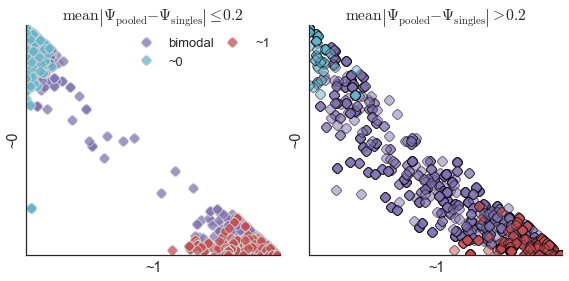

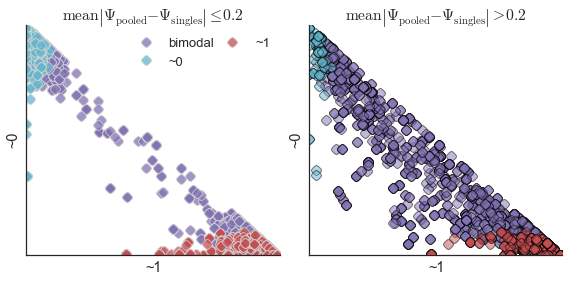

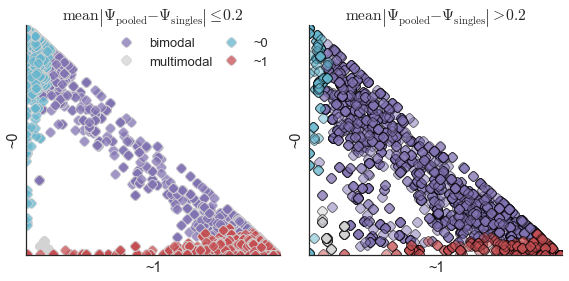

In [136]:



mean_diff_grouped = mean_diff_df.groupby('phenotype')

for phenotype, phenotype_df in nmf_positions_modalities.groupby('phenotype'):
    fig, axes = plt.subplots(ncols=2, figsize=(8, 4))
    ax_consistent = axes[0]
    ax_inconsistent = axes[1]
    mean_diff = mean_diff_grouped.get_group(phenotype)
    
    xmax = 0
    ymax = 0
    

    
    for modality, modality_df in phenotype_df.groupby('modality'):
        modality_df = modality_df.set_index('event_name')
        x = modality_df.pc_1
        y = modality_df.pc_2
        xmax = max(x.max(), xmax)
        ymax = max(y.max(), ymax)
        color = MODALITY_TO_COLOR[modality]
        for inconsistent_pooled, df in mean_diff.groupby('inconsistent_pooled'):
            events = df.event_name.unique()
            x_subset = x[events]
            y_subset = y[events]
            if inconsistent_pooled:
                markeredgecolor = 'k'
                label = None
                ax_inconsistent.plot(x_subset, y_subset, 'o', color=color, alpha=0.5, label=label, 
                                     markeredgecolor=markeredgecolor, markeredgewidth=1, rasterized=True)
#                 ax.plot(x_subset, y_subset, 'o', color='#262626', alpha=0.5, label=None)
            else:
                markeredgecolor = 'lightgrey'
                label = modality
                ax_consistent.plot(x_subset, y_subset, 'o', color=color, alpha=0.75, label=label,
                                  markeredgecolor=markeredgecolor, markeredgewidth=1, rasterized=True)
            
#             print x_subset
            
    ax_consistent.set(title=r'$\mathrm{mean}\left| \Psi_{\mathrm{pooled}} - \Psi_{\mathrm{singles}}\right| \leq ' +
                      '{:.1f}$'.format(min_difference))
    ax_inconsistent.set(title=r'$\mathrm{mean}\left| \Psi_{\mathrm{pooled}} - \Psi_{\mathrm{singles}}\right| > ' +
                      '{:.1f}$'.format(min_difference))  
    for ax in axes:
        ax.legend(ncol=2, columnspacing=.5)
        sns.despine()
        ax.set(xlabel='~1', ylabel='~0', xticks=[], yticks=[], ylim=(0, 1.01*ymax), xlim=(0, 1.01*xmax))
    fig.tight_layout()

    pdf = '{}/nmf_positions_modalities_{}_pooled_inconsistent.pdf'.format(folder, phenotype)
    print pdf
    fig.savefig(pdf)

## Compare Voyage space to JSD

In [137]:
from flotilla.compute.infotheory import binify, jsd

In [138]:
not_outliers = study.splicing.singles.index.difference(study.splicing.outliers.index)
psi = study.splicing.singles.ix[not_outliers]
grouped = psi.groupby(study.sample_id_to_phenotype)
psi_filtered = grouped.apply(lambda x: x.dropna(axis=1, thresh=20)).dropna(how='all', axis=1)

In [139]:
bins = (0, 0.3, 0.7, 1)


binned_psi = psi_filtered.groupby(study.sample_id_to_phenotype).apply(binify, bins=bins)
binned_psi

exon:chr10:101165513-101165617:-@exon:chr10:101163481-101163631:-@exon:chr10:101163226-101163391:-  \
phenotype                                                                                                               
MN        0-0.3                                                  NaN                                                    
          0.3-0.7                                                NaN                                                    
          0.7-1                                                  NaN                                                    
NPC       0-0.3                                             0.000000                                                    
          0.3-0.7                                           0.000000                                                    
          0.7-1                                             1.000000                                                    
iPSC      0-0.3                                             0.033333                                                    
          0.3-0.7                                           0.000000                                                    
          0.7-1                                             0.966667                                                    

                   exon:chr10:101480744-101480825:-@exon:chr10:101478103-101478257:-@exon:chr10:101476105-101476218:-  \
phenotype                                                                                                               
MN        0-0.3                                                  NaN                                                    
          0.3-0.7                                                NaN                                                    
          0.7-1                                                  NaN                                                    
NPC       0-0.3                                             0.150000                                                    
          0.3-0.7                                           0.000000                                                    
          0.7-1                                             0.850000                                                    
iPSC      0-0.3                                             0.000000                                                    
          0.3-0.7                                           0.117647                                                    
          0.7-1                                             0.882353                                                    

                   exon:chr10:101507014-101507147:+@exon:chr10:101510126-101510153:+@exon:chr10:101514286-101514307:+  \
phenotype                                                                                                               
MN        0-0.3                                                  NaN                                                    
          0.3-0.7                                                NaN                                                    
          0.7-1                                                  NaN                                                    
NPC       0-0.3                                                  NaN                                                    
          0.3-0.7                                                NaN                                                    
          0.7-1                                                  NaN                                                    
iPSC      0-0.3                                                0.150                                                    
          0.3-0.7                                              0.075                                                    
          0.7-1                                                0.775                                                    

                   exon

In [140]:
sample_ids = not_outliers + study.pooled
sample_ids

Index([u'CVN_01', u'CVN_02', u'CVN_03', u'CVN_04', u'CVN_05', u'CVN_06',
       u'CVN_07', u'CVN_08', u'CVN_09', u'CVN_11', 
       ...
       u'P8_01', u'P8_02', u'P8_05', u'P8_06', u'P8_10', u'P8_11', u'P9_01',
       u'P9_02', u'P9_03', u'P9_04'],
      dtype='object', length=189)

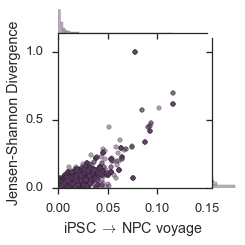

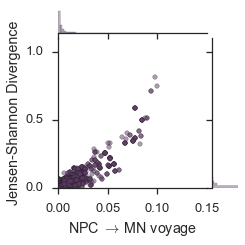

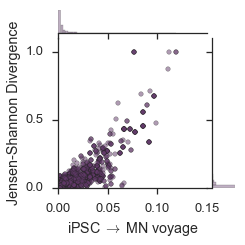

In [141]:
color = sns.cubehelix_palette()[-2]

for phenotype1, phenotype2 in phenotype_transitions:
    df1 = binned_psi.ix[phenotype1].dropna(axis=1)
    df2 = binned_psi.ix[phenotype2].dropna(axis=1)
    
#     print df1.shape, df2.shape
    df1, df2 = df1.align(df2, axis=1, join='inner')
#     print df1.shape, df2.shape
    
    divergence = jsd(df1, df2)
    divergence.name = 'Jensen-Shannon Divergence'
#     print divergence.head()
    
    voyages = nmf_space_distances[(phenotype1, phenotype2)]
    voyages.name = '{} $\\rightarrow$ {} voyage'.format(phenotype1, phenotype2)
    
    g = sns.jointplot(voyages, divergence, color=color, size=3.5, stat_func=None, kind='scatter', 
                      joint_kws=dict(alpha=0.5, linewidth=0.5, edgecolor='#262626'))
    g.ax_joint.set(xlim=(0, 0.15), ylim=(0, 1.1))
    g.ax_joint.locator_params(nbins=4)
    g.savefig('{}/nmf_vs_jsd_{}_{}.pdf'.format(folder, phenotype1, phenotype2))
    
    voyages, divergence = voyages.align(divergence, join='inner')
    voyages_not_detected_by_jsd = voyages[(divergence < 0.5) & (voyages > 0.05)]
#     for event in voyages_not_detected_by_jsd.index:
#         gene_name = study.splicing.feature_data.gene_name[event]
#         print gene_name, event

#         fig, axes = plt.subplots(figsize=(8, 4), ncols=2)    
#         study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
#                                    sample_ids=sample_ids,
#                                   phenotype_order=study.phenotype_order, ax=axes[0], color=study.phenotype_color_ordered,
#                                   bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
#         flotilla.visualize.splicing.nmf_space_transitions(nmf_space_postions, event, study.phenotype_to_color,
#                                                          study.phenotype_to_marker, study.phenotype_order, ax=axes[1],
#                                                          xlabel='~1', ylabel='~0')
#         axes[1].set(title='JSD: {:.2f}\nVoyage: {:.2f}'.format(divergence[event], voyages[event]))
#         sns.despine()
#         fig.tight_layout()
#         fig.savefig('{}/voyages_not_detected_by_jsd_{}_{}.pdf'.format(folder, gene_name, event))


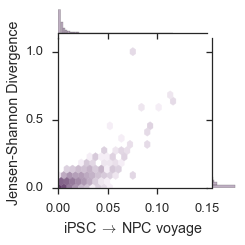

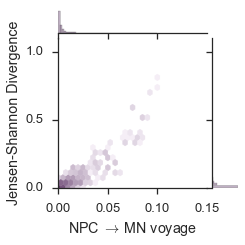

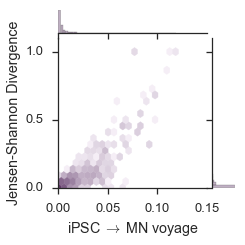

In [142]:
color = sns.cubehelix_palette()[-2]

joint_kws = dict(gridsize=20, mincnt=1, bins='log', cmap=sns.light_palette(color, as_cmap=True))

for phenotype1, phenotype2 in phenotype_transitions:
    df1 = binned_psi.ix[phenotype1].dropna(axis=1)
    df2 = binned_psi.ix[phenotype2].dropna(axis=1)
    
#     print df1.shape, df2.shape
    df1, df2 = df1.align(df2, axis=1, join='inner')
#     print df1.shape, df2.shape
    
    divergence = jsd(df1, df2)
    divergence.name = 'Jensen-Shannon Divergence'
#     print divergence.head()
    
    voyages = nmf_space_distances[(phenotype1, phenotype2)]
    voyages.name = '{} $\\rightarrow$ {} voyage'.format(phenotype1, phenotype2)
    
    g = sns.jointplot(voyages, divergence, size=3.5, color=color, 
                      stat_func=None, kind='hexbin', joint_kws=joint_kws)
    g.ax_joint.set(xlim=(0, 0.15), ylim=(0, 1.1))
    g.ax_joint.locator_params(nbins=4)
    g.savefig('{}/nmf_vs_jsd_{}_{}_hexbin.pdf'.format(folder, phenotype1, phenotype2))
    
    voyages, divergence = voyages.align(divergence, join='inner')
    voyages_not_detected_by_jsd = voyages[(divergence < 0.5) & (voyages > 0.05)]



## Show voyage space distances and annotate PKM

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_space_transitions_pkm_annotated_NPC-MN.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_space_transitions_pkm_annotated_iPSC-MN.pdf
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_space_transitions_pkm_annotated_iPSC-NPC.pdf


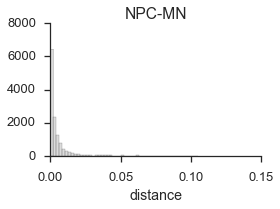

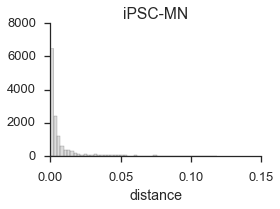

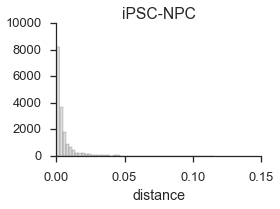

In [143]:
sns.set(style='ticks', context='talk', rc={'font.sans-serif':'Arial', 'pdf.fonttype': 42})

folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages'

for transition, df in nmf_distances_tidy.groupby('transition'):
#     transition = map(lambda x: x.strip("'u "), transition.strip(')(').split(','))
    df = df.dropna()
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.distplot(df.distance, ax=ax, kde=False, color='darkgrey', bins=50)
    
#     x = df.distance[df.event_name == pkm_event]
#     ymin, ymax = ax.get_ylim()
#     yrange = ymax - ymin
#     ax.annotate('PKM MXE event', xy=(x, ymin+yrange*.01), xytext=(x, ymin+yrange*.5), xycoords='data', 
#                 textcoords='data', arrowprops=dict(arrowstyle='->', connectionstyle='arc3', linewidth=2),
#                ha='center', fontsize=12)
    ax.locator_params('y', nbins=5)
    ax.locator_params('x', nbins=4)
    ax.set(title=transition)
    sns.despine()
    pdf = '{}/nmf_space_transitions_pkm_annotated_{}.pdf'.format(folder, transition)
    print pdf
    fig.tight_layout()
    fig.savefig(pdf)

### total distance

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages/nmf_space_transitions_pkm_annotated_summed.pdf


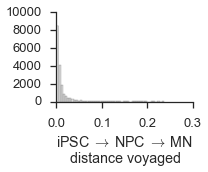

In [144]:
nmf_space_summed_distances = nmf_space_distances.sum(axis=1)

fig, ax = plt.subplots(figsize=(3, 2.5))
sns.distplot(nmf_space_summed_distances, ax=ax, kde=False, color='darkgrey')

# x = nmf_space_summed_distances[pkm_event]
# ymin, ymax = ax.get_ylim()
# yrange = ymax - ymin
# ax.annotate('PKM MXE event', xy=(x, ymin+yrange*.01), xytext=(x, ymin+yrange*.75), xycoords='data', 
#             textcoords='data', arrowprops=dict(arrowstyle='->', connectionstyle='arc3', linewidth=2),
#            ha='center', fontsize=12)
ax.locator_params('y', nbins=5)
ax.locator_params('x', nbins=4)
ax.set(xlabel=r'iPSC $\rightarrow$ NPC $\rightarrow$ MN' + '\ndistance voyaged')
sns.despine()
pdf = '{}/nmf_space_transitions_pkm_annotated_summed.pdf'.format(folder)
print pdf
fig.tight_layout()
fig.savefig(pdf)

### Plot histogram of distances with cutoff

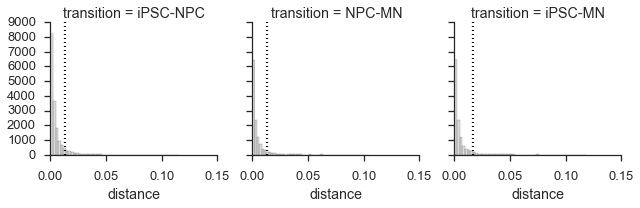

In [145]:
def mean_std_cutoff(x, **kwargs):
    ax = plt.gca()
    cutoff_func = kwargs.pop('cutoff_func')
    cutoff = cutoff_func(x)
    ymin, ymax = ax.get_ylim()
    ax.vlines(cutoff, ymin, ymax, linestyle='dotted')
    
def annotate_event(*args, **kwargs):
    event_description = kwargs.pop('event_description')
    event_name = kwargs.pop('event_name')
    data = kwargs.pop('data')
    event_position = data.distance[data.event_name == event_name]
    ax = plt.gca()
    ymin, ymax = ax.get_ylim()
    yrange = ymax - ymin
    ax.annotate(event_description, xy=(event_position, ymin+yrange*.01), 
                xytext=(event_position, ymin+yrange*.5), xycoords='data', 
                textcoords='data', arrowprops=dict(arrowstyle='->', connectionstyle='arc3', linewidth=2),
               ha='center', fontsize=12)
    
def cutoff_function(x):
    return x.mean() + x.std()

g = sns.FacetGrid(nmf_distances_tidy, col='transition')
g.map(sns.distplot, 'distance', kde=False, color='darkgrey')
g.map(mean_std_cutoff, 'distance', cutoff_func=cutoff_function)
# g.map_dataframe(annotate_event, event_description='PKM MXE\nevent', event_name=pkm_event)
for ax in g.axes.flat:
    ax.locator_params('x', nbins=4)
g.savefig('{}/voyage_distances_hist_cutoff.pdf'.format(folder))

### Get direction of change

In [146]:
phenotype_transitions

[(u'iPSC', u'NPC'), (u'NPC', u'MN'), ('iPSC', 'MN')]

In [147]:
def voyage_direction(row, transition):
    row.index = row.index.droplevel(1)
    phenotype1, phenotype2 = transition
    try:
        x1, y1 = row.loc[phenotype1].values
        x2, y2 = row.loc[phenotype2].values
        dx = x2 - x1
        dy = y2 - y1
        if dx > 0 and dy > 0:
            # bimodal
            return r'$\nearrow$'
        elif dx > 0 and dy <= 0:
            # towards ~0
            return r'$\searrow$'
        elif dx <= 0 and dy > 0:
            # towards ~1
            return r'$\nwarrow$'
        elif dx < 0 and dy < 0:
            # Towards middle
            return r'$\swarrow$'
        else:
            return np.nan
    except KeyError:
        return np.nan    

dfs = []

nmf_positions_tidy_index = nmf_positions_tidy.set_index(['phenotype', 'event_name'])
for transition in phenotype_transitions:
    df = nmf_positions_tidy_index.groupby(level=1, axis=0).apply(voyage_direction, transition=transition).reset_index()
    df = df.rename(columns={0: 'direction', 'index': 'event_name'})
    df['transition'] = '-'.join(transition)
    dfs.append(df)
voyage_directions = pd.concat(dfs)
voyage_directions.head()

,event_name,direction,transition
0,exon:chr10:100190328-100190427:-@exon:chr10:10...,NaN,iPSC-NPC
1,exon:chr10:100190328-100190427:-@exon:chr10:10...,NaN,iPSC-NPC
2,exon:chr10:100190328-100190427:-@exon:chr10:10...,NaN,iPSC-NPC
3,exon:chr10:100193697-100193848:-@exon:chr10:10...,NaN,iPSC-NPC
4,exon:chr10:101165513-101165617:-@exon:chr10:10...,$\searrow$,iPSC-NPC


In [148]:
voyage_data = nmf_distances_tidy.merge(voyage_directions, left_on=['event_name', 'transition'],
                              right_on=['event_name', 'transition'])
voyage_data.head()

,transition,event_name,distance,direction
0,iPSC-NPC,exon:chr10:101165513-101165617:-@exon:chr10:10...,0.002635,$\searrow$
1,iPSC-NPC,exon:chr10:101480744-101480825:-@exon:chr10:10...,0.016448,$\nwarrow$
2,iPSC-NPC,exon:chr10:102114184-102114389:+@exon:chr10:10...,0.002994,$\nwarrow$
3,iPSC-NPC,exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000,NaN
4,iPSC-NPC,exon:chr10:102286732-102286831:-@exon:chr10:10...,0.000000,NaN


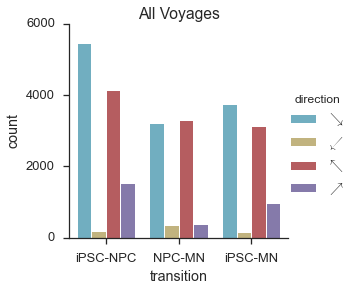

In [149]:
from modish.visualize import MODALITY_PALETTE, MODALITY_ORDER, MODALITY_TO_COLOR
modality_order = MODALITY_ORDER

modality_to_arrows = {voyage_space_ylabel: r'$\nwarrow$', voyage_space_xlabel: r'$\searrow$', 
                      'middle': r'$\swarrow$', 'bimodal': r'$\nearrow$',
                     'multimodal': '.'}
arrow_order = [modality_to_arrows[x] for x in modality_order]
arrow_colors = dict(zip(arrow_order, MODALITY_PALETTE))

g = sns.factorplot(x='transition', hue='direction', data=voyage_data, kind='count', hue_order=arrow_order[:-1],
              palette=arrow_colors, linewidth=1, edgecolor='white')
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
    ax.set_title('All Voyages')
g.savefig('{}/voyage_directions_count_barplot.pdf'.format(folder))

In [150]:
def plot_nmf_positions(*args, **kwargs):
    data = kwargs.pop('data')
    ax = plt.gca()
    phenotype1, phenotype2 = data.transition.values[0].split('-')

    # PLot a phantom line for the legend to work
    ax.plot(0, 0, **kwargs)
    for event in data.event_name:
        df = nmf_space_postions.ix[event].ix[[phenotype1, phenotype2]].dropna()
        if df.shape[0] != 2:
            continue
        x1, x2 = df.pc_1.values
        y1, y2 = df.pc_2.values
        dx = x2 - x1
        dy = y2 - y1
        ax.arrow(x1, y1, dx, dy, head_width=0.005, head_length=0.005, #fc='k', ec='k', 
                 alpha=0.25, **kwargs)

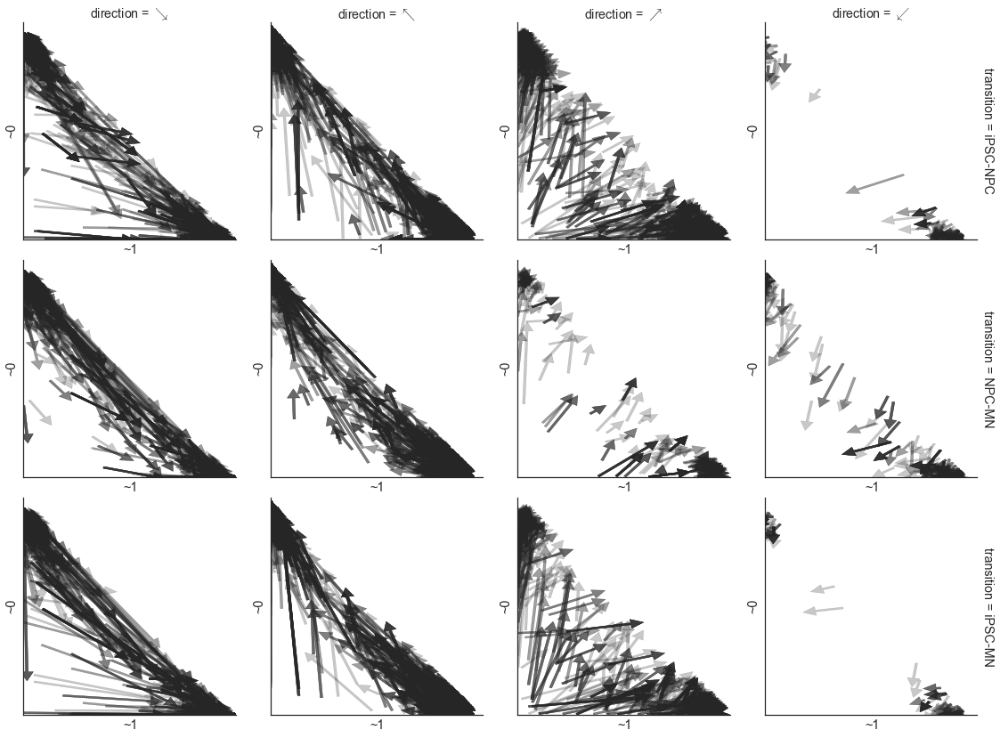

In [151]:
g = sns.FacetGrid(voyage_data, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='#262626')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_all.png'.format(folder))

### Big Voyages

In [152]:
range(3)

[0, 1, 2]

In [153]:
big_voyages = voyage_data.groupby('transition', as_index=False, group_keys=False).apply(
    lambda x: x.ix[x.distance > (x.distance.mean() + x.distance.std())])
big_voyages.head()

,transition,event_name,distance,direction
18236,NPC-MN,exon:chr10:103360960-103361093:+@exon:chr10:10...,0.014335,$\nwarrow$
18292,NPC-MN,exon:chr10:105156166-105156198:-@exon:chr10:10...,0.017525,$\searrow$
18297,NPC-MN,exon:chr10:1094804-1094875:-@exon:chr10:108993...,0.021465,$\nwarrow$
18340,NPC-MN,exon:chr10:120101782-120101827:-@exon:chr10:12...,0.014010,$\nwarrow$
18341,NPC-MN,exon:chr10:120101782-120101827:-@exon:chr10:12...,0.014010,$\nwarrow$


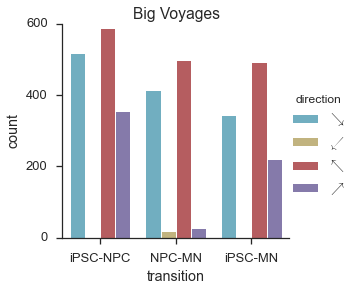

In [154]:
g = sns.factorplot(x='transition', hue='direction', data=big_voyages, kind='count', hue_order=arrow_order[:-1],
              palette=arrow_colors, linewidth=1, edgecolor='white', x_order=['iPSC-NPC', 'NPC-MN', 'iPSC-MN'])
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
    ax.set(title="Big Voyages")
g.savefig('{}/voyage_directions_count_barplot_big.pdf'.format(folder))

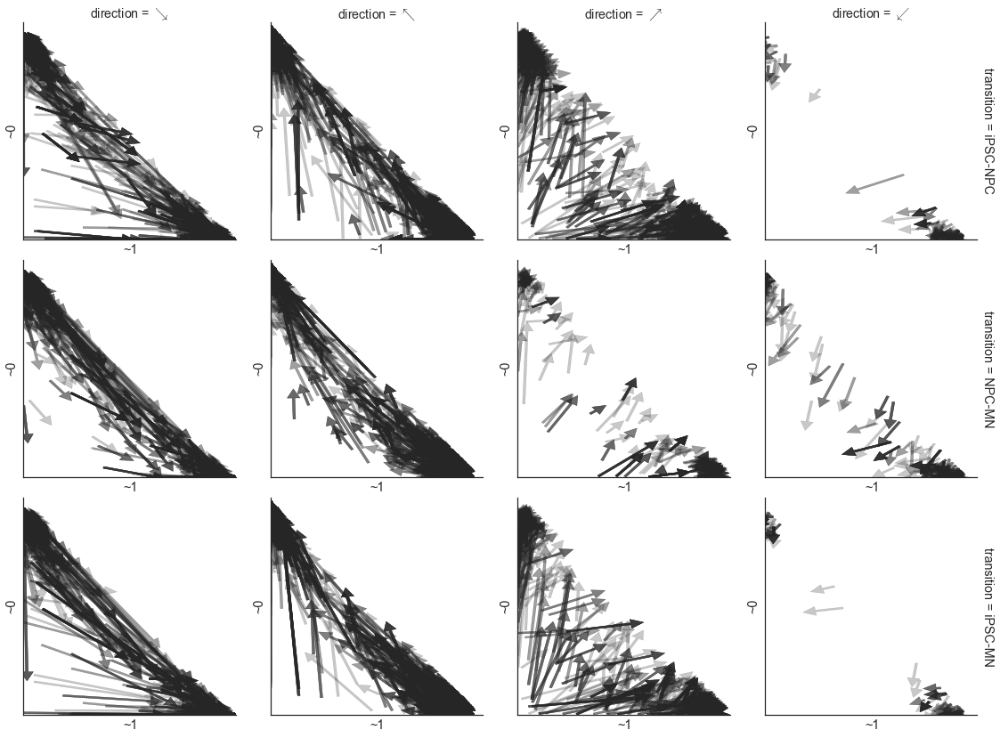

In [155]:
g = sns.FacetGrid(voyage_data, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='#262626')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_big.pdf'.format(folder))

In [156]:
big_voyages.transition.unique()

array([u'NPC-MN', 'iPSC-MN', u'iPSC-NPC'], dtype=object)

## Changing events by PCA, Voyages, and modalities

In [157]:
modalities_all_celltypes = study.supplemental.modalities_tidy.groupby('event_name').filter(
    lambda x: len(x.phenotype.unique()) == len(study.phenotype_order))
delta_modality = modalities_all_celltypes.groupby('event_name').filter(lambda x: x.modality.unique().shape[0] > 1)
delta_modality.head()

,event_name,phenotype,modality,n_cells
50,exon:chr10:103360960-103361093:+@exon:chr10:10...,MN,~0,20
51,exon:chr10:103360960-103361093:+@exon:chr10:10...,NPC,bimodal,38
52,exon:chr10:103360960-103361093:+@exon:chr10:10...,iPSC,~0,38
129,exon:chr10:103912172-103912287:+@exon:chr10:10...,MN,bimodal,26
130,exon:chr10:103912172-103912287:+@exon:chr10:10...,NPC,~1,37


In [158]:
modalities_all_celltypes.shape

(27336, 4)

In [159]:
delta_modality.shape

(2559, 4)

### PCA of constitutively expressed genes

In [160]:
from flotilla.compute.expression import differential_expression
singles_no_outliers = study.expression.singles.ix[study.splicing.singles.index.difference(study.splicing.outliers.index)]
print singles_no_outliers.shape
de_results = differential_expression(singles_no_outliers, study.sample_id_to_phenotype)

(181, 16028)


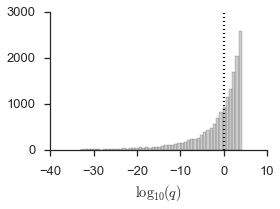

In [161]:
p_cutoff = 1e-5

fig, ax = plt.subplots(figsize=(4,3))
sns.distplot(np.log10(de_results.bonferonni_p_value), ax=ax, kde=False, color='grey')
ax.set(xlabel='$\log_{10}(q)$')
ymin, ymax = ax.get_ylim()
ax.vlines(p_cutoff, ymin, ymax, linestyle='dotted')

ax.locator_params(nbins=5)
sns.despine()
fig.tight_layout()
fig.savefig('{}/differential_expression_bonferonni_p_value.pdf'.format(folder))

In [162]:
pkm_ensembl_id = study.expression.maybe_renamed_to_feature_id('PKM')[0]
de_results.loc[de_results.gene_id == pkm_ensembl_id]

,gene_id,U_statistic,p_value,bonferonni_p_value
4790,ENSG00000067225,27.26557,0.000001,0.019241


In [163]:
non_de_genes = de_results.gene_id[de_results.bonferonni_p_value >= p_cutoff]
de_genes = de_results.gene_id[de_results.bonferonni_p_value < p_cutoff]
print len(non_de_genes)
print len(de_genes)

13252
2776


In [164]:
range(3)

[0, 1, 2]

In [165]:
study.metadata._phenotype_to_color = {u'MN': u'#228a44',
                                     u'NPC': u'#73c476',
                                     u'iPSC': u'#c7e9c0'}

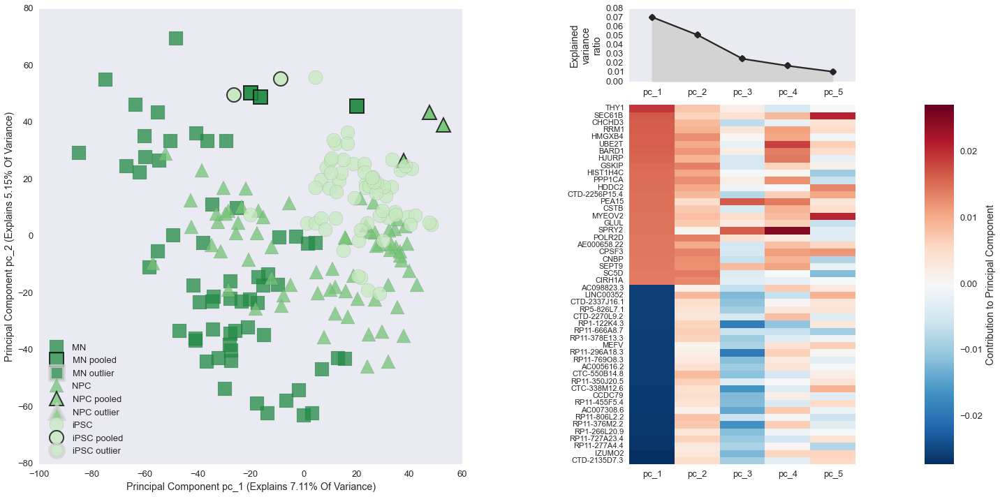

In [166]:
with sns.axes_style('dark'):
    v = study.plot_pca(feature_subset=non_de_genes,
                       sample_subset='~outlier', scale_by_variance=False, show_vectors=False, markersize=20)
    v.fig_reduced.savefig('{}/non_de_genes_expression_pca.pdf'.format(folder))

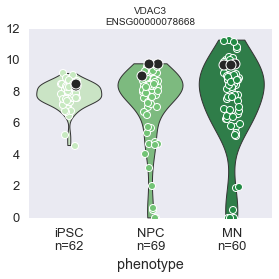

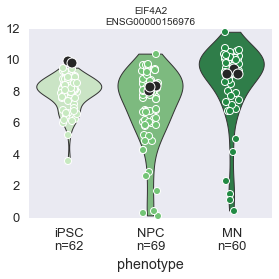

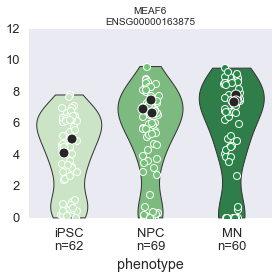

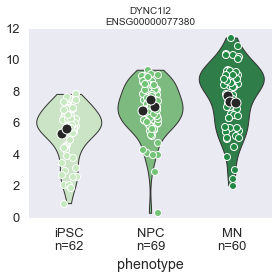

In [167]:
gene_names = ['VDAC3', 'EIF4A2', 'MEAF6', 'DYNC1I2']

for gene_name in gene_names:
    with sns.axes_style('dark'):
        study.plot_gene(gene_name, sample_subset='~outlier')
        fig = plt.gcf()
        for ax in fig.axes:
            ax.set(ylim=(0, 12))
        fig.savefig('{}/non_de_genes_{}.pdf'.format(folder, gene_name))

In [172]:
event_ind = study.splicing.feature_data.ensembl_id.map(
    lambda x: non_de_genes.isin(x.split(',')).any() if isinstance(x, str) else False)

non_de_event_names = study.splicing.feature_data.index[event_ind]
print len(non_de_event_names)

44499


In [175]:
modalities_non_de = study.supplemental.modalities_tidy.loc[study.supplemental.modalities_tidy.event_name.isin(non_de_event_names)]

In [177]:
modalities_de = study.supplemental.modalities_tidy.loc[~study.supplemental.modalities_tidy.event_name.isin(non_de_event_names)]

In [178]:
from modish.visualize import MODALITY_TO_COLOR, MODALITY_ORDER, MODALITY_PALETTE

import locale


locale.setlocale(locale.LC_ALL, 'en_US')


def annotate_bars(x, y, **kwargs):
    data = kwargs.pop('data')
    ax = plt.gca()
    width = 0.8/5.
    x_base = -.49 - width/2.5
    for phenotype, phenotype_df in data.groupby('phenotype'):
        i = 0
        for modality, modality_df in phenotype_df.groupby('modality'):
            i += 1
            x_position = x_base + width*i + width/2
            y_position = modality_df["Percentage of events"]
            try:
                value = modality_df.n_events.values[0]
                formatted = locale.format('%d', value, grouping=True)
                ax.annotate(formatted, (x_position, y_position),
                            textcoords='offset points', xytext=(0, 2),
                            ha='center', va='bottom', fontsize=12)
            except IndexError:
                continue
        x_base += 1

modality_factorplot_kws = dict(hue_order=MODALITY_ORDER, palette=MODALITY_PALETTE)

def modalities_barplot(modalities_tidy, modality_order, phenotype_order, factorplot_kws=None):
    factorplot_kws = {} if factorplot_kws == None else factorplot_kws

    modality_counts = modalities_tidy.groupby(['phenotype', 'modality']).size().reset_index()
    modality_counts = modality_counts.rename(columns={0:'n_events'})
    modality_counts['Percentage of events'] = modality_counts.groupby('phenotype').n_events.apply(
        lambda x: 100*x/x.astype(float).sum())

    modality_counts.modality = pd.Categorical(modality_counts.modality, categories=modality_order, ordered=True)
    modality_counts.phenotype = pd.Categorical(modality_counts.phenotype, categories=phenotype_order, ordered=True)
    g = sns.factorplot(y='Percentage of events', x='phenotype', hue='modality', kind='bar', data=modality_counts,
                       aspect=3, 
                       legend=False, linewidth=1, size=3, **factorplot_kws)
    g.map_dataframe(annotate_bars, 'phenotype', 'Percentage of events')
    g.add_legend(label_order=modality_order, title='Modalities')
    for ax in g.axes.flat:
    #     ax.set_ylim(0, 50)
        ax.locator_params('y', nbins=5)
    return g

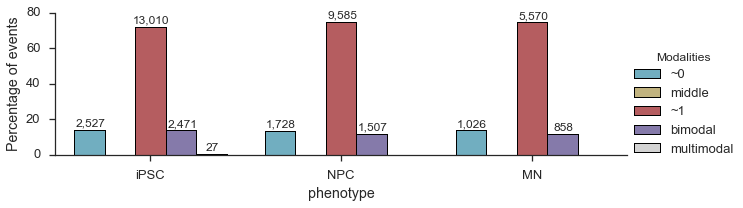

In [180]:
g = modalities_barplot(modalities_non_de, MODALITY_ORDER, study.phenotype_order, modality_factorplot_kws)
g.savefig('{}/non_de_genes_modalities.pdf'.format(folder))

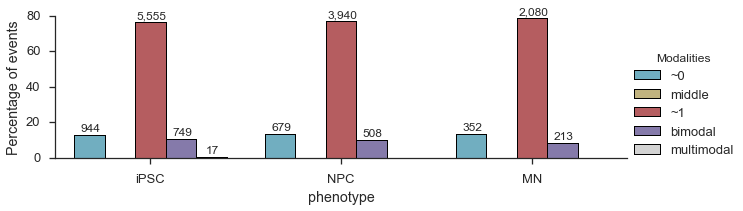

In [181]:
g = modalities_barplot(modalities_de, MODALITY_ORDER, study.phenotype_order, modality_factorplot_kws)
g.savefig('{}/de_genes_modalities.pdf'.format(folder))

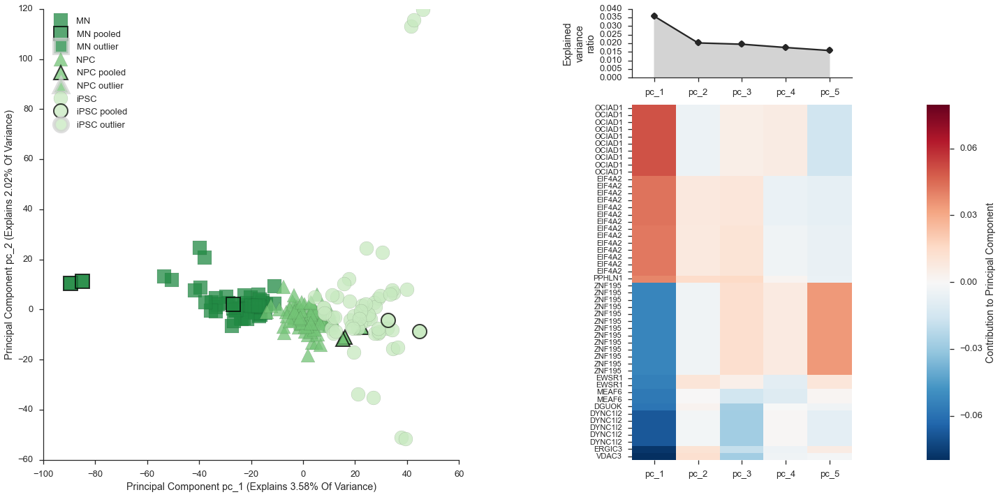

In [182]:
with sns.axes_style('ticks'):
    v = study.plot_pca(feature_subset=non_de_event_names, data_type='splicing',
                   sample_subset='~outlier', scale_by_variance=False, show_vectors=False, markersize=20)
    v.fig_reduced.savefig('{}/non_de_genes_splicing_pca.pdf'.format(folder))

In [183]:
# from sklearn.decomposition import PCA

# data = psi_filtered.loc[:, non_de_event_names].dropna(how='all', axis=1)

# psi_transformed = -2 * np.arccos(data.fillna(data.mean()) * 2 - 1)  + np.pi
# psi_transformed.head()
# reducer = PCA(n_components=2)
# reduced = reducer.fit_transform(psi_transformed)
# reduced = pd.DataFrame(reduced, index=psi_transformed.index)

# fig, ax = plt.subplots(figsize=(6, 4))
# for phenotype, df in reduced.groupby(study.sample_id_to_phenotype):
#     color = study.phenotype_to_color[phenotype]
#     marker = study.phenotype_to_marker[phenotype]
#     for pooled, df2 in df.groupby(study.metadata.data.pooled):
#         if pooled:
#             continue
#         markeredgecolor = 'k' if pooled else None
#         markeredgewidth = 2 if pooled else 0
#         for outlier, df3 in df2.groupby(study.metadata.data.outlier):
#             markeredgecolor = 'lightgrey' if outlier else '#262626'
#             markeredgewidth = 3 if outlier else 0.1
#             if outlier:
#                 continue
#             ax.plot(df3[0], df3[1], 'o', color=color, markeredgecolor=markeredgecolor, 
#                     markeredgewidth=markeredgewidth, alpha=0.5, marker=marker)
# sns.despine()
# xmin, xmax, ymin, ymax = ax.axis()
# vmin = min(xmin, ymin)
# vmax = max(xmax, ymax)
# explained_variance_percentage = reducer.explained_variance_ratio_ * 100
# ax.set(xlabel='PC 1 ({:.1f}%)'.format(explained_variance_percentage[0]),
#        ylabel='PC 2 ({:.1f}%)'.format(explained_variance_percentage[1]),
#        xticks=[], yticks=[], xlim=(vmin, vmax), ylim=(vmin, vmax))
# fig.savefig('{}/non_de_genes_splicing_pca_by_hand.pdf'.format(folder))

In [184]:
components = pd.DataFrame(reducer.components_, columns=psi_transformed.columns, index=['PC 1', 'PC 2']).T
print components.shape
components.head()

NameError: name 'reducer' is not defined

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3))
colors = sns.color_palette('deep')

for color, (pc, column) in zip(colors, components.iteritems()):
    sns.distplot(column, label=pc, hist=False, kde_kws=dict(shade=True), color=color)
    ymin, ymax = ax.get_ylim()
    x = column.abs().mean() + 2*column.abs().std()
    ax.vlines(x, 0, ymax, alpha=0.75, linestyle='dotted', color=color)
    ax.vlines(-x, 0, ymax, alpha=0.75, linestyle='dotted', color=color)
ax.set(xlabel='Contribution to principal component')
ax.legend()
sns.despine()
fig.savefig('{}/non_de_genes_splicing_components.pdf'.format(folder))

In [ ]:
big_components = components[components > components.abs().mean() + 2*components.abs().std()].dropna(how='all')
big_components.head()

### Venn Diagram of three methods: PCA, $\Delta$ Modality, Voyages

In [ ]:
import matplotlib_venn

voyage_events = set(big_voyages.event_name)
delta_modality_events = set(delta_modality.event_name)
pca_events = set(big_components.index)

fig, ax = plt.subplots(figsize=(2.5, 2.5))

matplotlib_venn.venn3((pca_events, delta_modality_events, voyage_events), 
                      set_labels=('PCA', '$\Delta$ Modality', 'Voyages'),
                      set_colors=sns.color_palette('Dark2', n_colors=3))
fig.tight_layout()
fig.savefig('{}/changing_events_voyage_modality_pca_venn.pdf'.format(folder))

### PCA of subsets of the venn diagram

#### Tier 1: Changing in at least two methods

In [ ]:
from collections import Counter

n_methods_changing = Counter(voyage_events)
n_methods_changing.update(delta_modality_events)
n_methods_changing.update(pca_events)
n_methods_changing = pd.Series(n_methods_changing)
n_methods_changing.head()

In [ ]:
singles_not_outliers = study.sample_subset_to_sample_ids('~pooled') & study.sample_subset_to_sample_ids('~outlier')
singles_not_outliers[:5]

In [ ]:
events_changing_in_2_methods = n_methods_changing[n_methods_changing >= 2].index
viz = study.plot_pca(feature_subset=events_changing_in_2_methods, data_type='splicing',
                     sample_subset=singles_not_outliers, show_vectors=False, scale_by_variance=True)
xmin, xmax, ymin, ymax = viz.ax_components.axis()
vmin = min(xmin, ymin)
vmax = max(xmax, ymax)
viz.ax_components.set(xlim=(vmin, vmax), ylim=(vmin, vmax))
viz.fig_reduced.savefig('{}/changing_events_voyage_modality_pca_tier1_pca.pdf'.format(folder))


In [ ]:
study.splicing.feature_expression_id_col = 'ensembl_id'

In [ ]:
from flotilla.visualize.gene_ontology import plot_go_enrichment

background = study.splicing.splicing_to_expression_id(voyage_data.event_name.unique())

go_dfs = []
tier1_genes = study.splicing.splicing_to_expression_id(events_changing_in_2_methods)
tier1_genes = pd.Series(tier1_genes)
tier1_genes.to_csv('{}/changing_events_tier1_genes.csv'.format(folder), index=False)


go = study.go_enrichment(tier1_genes, background, p_value_cutoff=1, min_feature_size=15, min_background_size=15)
if not go is None and not go.empty:
    fig, ax = plt.subplots(figsize=(6, 6))
#     go = go.loc[go.n_background_in_go_term != go.n_features_of_interest_in_go_term]
    plot_go_enrichment(data=go, max_categories=20, color='lightgrey')
    prefix = '{}/changing_events_go_enrichment_tier1.pdf'.format(folder)

    print go.head()
    ax.set_title('{}, n={}'.format('Changing events, Tier 1', len(tier1_genes)))
    fig = plt.gcf()
    fig.tight_layout()
    fig.savefig('{}.pdf'.format(prefix))
else:
    print '\t... empty GO enrichment!'


#### Plot Voyage space positions

In [78]:
def plot_nmf_positions(*args, **kwargs):
    data = kwargs.pop('data')
    ax = plt.gca()
    phenotype1, phenotype2 = data.transition.values[0].split('-')

    # PLot a phantom line for the legend to work
    ax.plot(0, 0, **kwargs)
    for event in data.event_name:
        df = nmf_space_postions.ix[event].ix[[phenotype1, phenotype2]].dropna()
        if df.shape[0] != 2:
            continue
        x1, x2 = df.pc_1.values
        y1, y2 = df.pc_2.values
        dx = x2 - x1
        dy = y2 - y1
        ax.arrow(x1, y1, dx, dy, head_width=0.005, head_length=0.005, #fc='k', ec='k', 
                 alpha=0.25, **kwargs)

In [79]:
voyages_tier1 = voyage_data.loc[voyage_data.event_name.isin(events_changing_in_2_methods)]
print voyages_tier1.shape
voyages_tier1.head()

(7236, 4)


,transition,event_name,distance,direction
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$
45,iPSC-NPC,chr10:102289264-102289614:-|3p,0.031934,$\searrow$
51,iPSC-NPC,chr10:103361094-103364896:+|3p,0.010328,$\nwarrow$
76,iPSC-NPC,chr10:103565901-103567486:-|3p,0.014387,$\nwarrow$
77,iPSC-NPC,chr10:103565901-103567486:-|5p,0.020474,$\nwarrow$


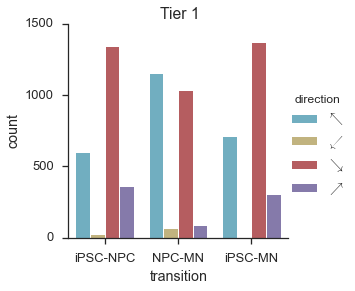

In [80]:
g = sns.factorplot(x='transition', hue='direction', data=voyages_tier1, kind='count', hue_order=arrow_order[:-1],
              palette=arrow_colors, linewidth=1, edgecolor='white')
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
    ax.set(title='Tier 1')
g.savefig('{}/voyage_directions_count_barplot_tier1.pdf'.format(folder))

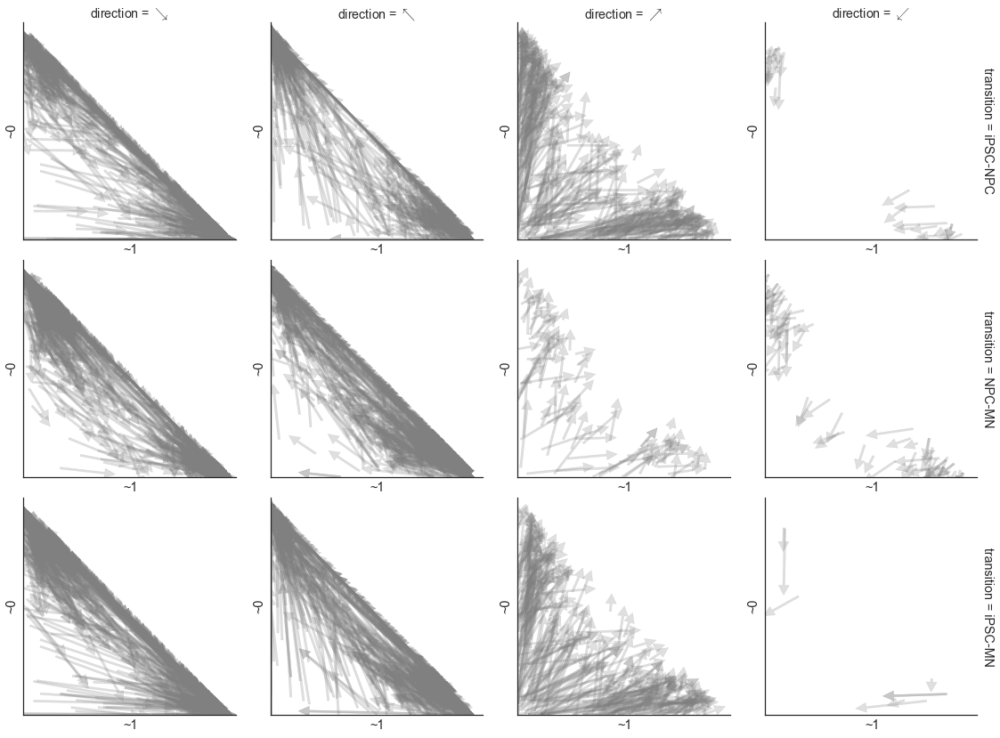

In [294]:
g = sns.FacetGrid(voyages_tier1, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='grey')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_tier1.png'.format(folder))

#### Tier 2: Changing in only one method

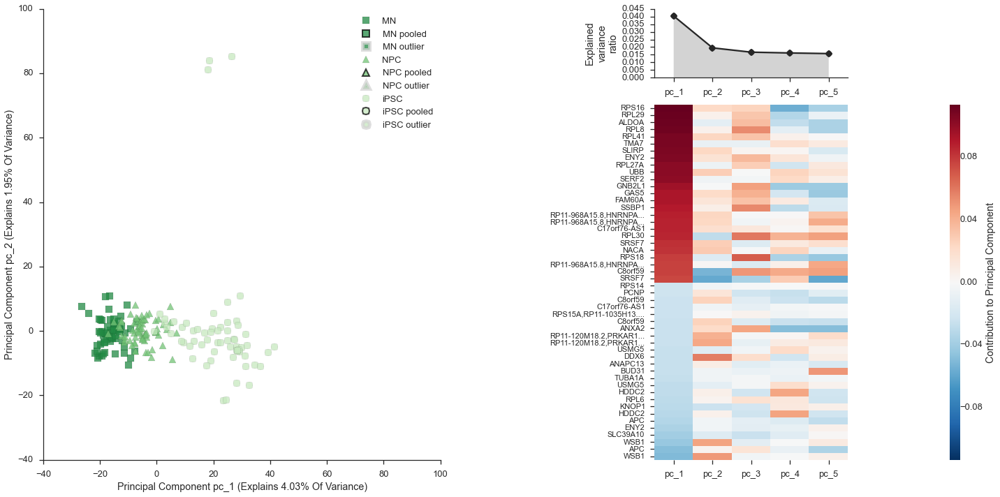

In [124]:
events_changing_in_1_method = n_methods_changing[n_methods_changing == 1].index
viz = study.plot_pca(feature_subset=events_changing_in_1_method, data_type='splicing', 
                     sample_subset=singles_not_outliers, show_vectors=False, scale_by_variance=True)
xmin, xmax, ymin, ymax = viz.ax_components.axis()
vmin = min(xmin, ymin)
vmax = max(xmax, ymax)
viz.ax_components.set(xlim=(vmin, vmax), ylim=(vmin, vmax))
viz.fig_reduced.savefig('{}/changing_events_voyage_modality_pca_tier2_pca.pdf'.format(folder))

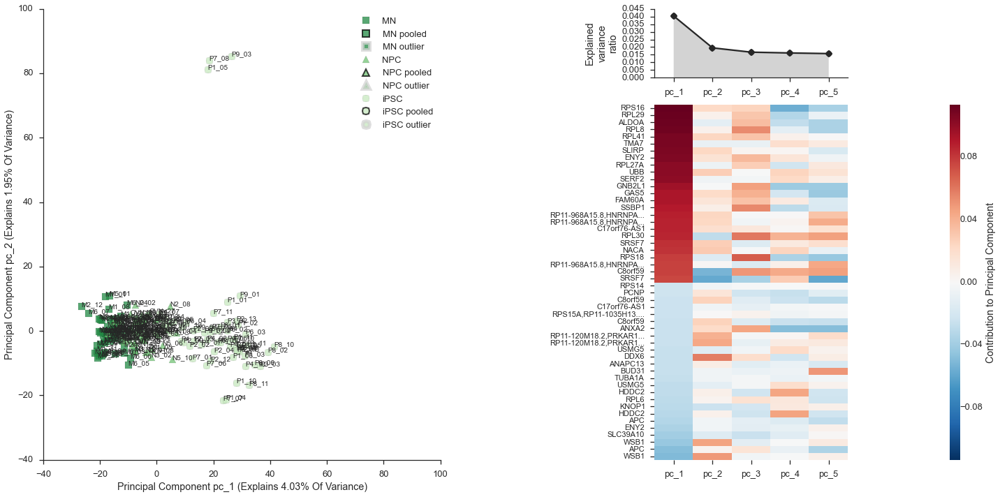

In [125]:
events_changing_in_1_method = n_methods_changing[n_methods_changing == 1].index
viz = study.plot_pca(feature_subset=events_changing_in_1_method, data_type='splicing', show_point_labels=True,
                     sample_subset=singles_not_outliers, show_vectors=False, scale_by_variance=True)
xmin, xmax, ymin, ymax = viz.ax_components.axis()
vmin = min(xmin, ymin)
vmax = max(xmax, ymax)
viz.ax_components.set(xlim=(vmin, vmax), ylim=(vmin, vmax))
viz.fig_reduced.savefig('{}/changing_events_voyage_modality_pca_tier2_pca_points_labeled.pdf'.format(folder))

                              features_of_interest_in_go_term  \
GO:0005515  ENSG00000123545,ENSG00000164548,ENSG0000011658...   
GO:0005634  ENSG00000096746,ENSG00000164548,ENSG0000017393...   
GO:0005737  ENSG00000125868,ENSG00000173933,ENSG0000012248...   
GO:0005829  ENSG00000113712,ENSG00000166986,ENSG0000007754...   
GO:0005739  ENSG00000152234,ENSG00000123545,ENSG0000016698...   

                 features_of_interest_in_go_term_gene_symbols  \
GO:0005515  NDUFAF4,TRA2A,LAMTOR2,RBM4,NME1-NME2,CSE1L,UBE...   
GO:0005634  HNRNPH3,TRA2A,RBM4,RPAP2,NME1-NME2,CSE1L,ZNF64...   
GO:0005737  DSTN,RBM4,RPAP2,CPOX,CSE1L,POLR2H,UBE2L3,CSDE1...   
GO:0005829  CSNK1A1,MARS,CAPZB,NME1-NME2,CHMP2A,DGUOK,GART...   
GO:0005739  ATP5A1,NDUFAF4,MARS,DGUOK,IDH1,ACADM,MRPS10,MD...   

                     go_domain          go_name  n_background_in_go_term  \
GO:0005515  molecular_function  protein binding                      837   
GO:0005634  cellular_component          nucleus                   

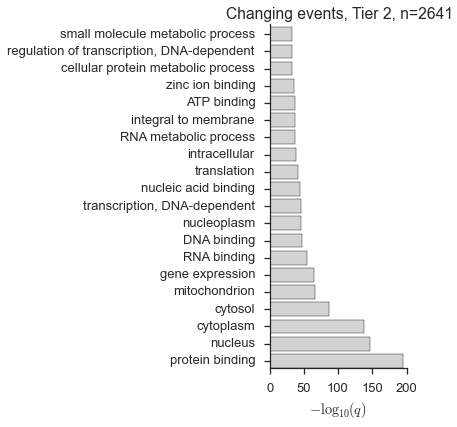

In [145]:
from flotilla.visualize.gene_ontology import plot_go_enrichment

background = study.splicing.splicing_to_expression_id(voyage_data.event_name.unique())

tier2_genes = study.splicing.splicing_to_expression_id(events_changing_in_1_method)
tier2_genes = pd.Series(tier2_genes)
tier2_genes.to_csv('{}/changing_events_tier2_genes.csv'.format(folder), index=False)

go = study.go_enrichment(tier2_genes, background, p_value_cutoff=1, min_feature_size=15, min_background_size=15)
if not go is None and not go.empty:
    fig, ax = plt.subplots(figsize=(6, 6))
#     go = go.loc[go.n_background_in_go_term != go.n_features_of_interest_in_go_term]
    plot_go_enrichment(data=go, max_categories=20, color='lightgrey')
    prefix = '{}/changing_events_go_enrichment_tier2.pdf'.format(folder)

    print go.head()
    ax.set_title('{}, n={}'.format('Changing events, Tier 2', len(tier1_genes)))
    fig = plt.gcf()
    fig.tight_layout()
    fig.savefig('{}.pdf'.format(prefix))
else:
    print '\t... empty GO enrichment!'


In [127]:
voyages_tier2 = voyage_data.loc[voyage_data.event_name.isin(events_changing_in_1_method)]
print voyages_tier2.shape
voyages_tier2.head()

(10305, 4)


,transition,event_name,distance,direction
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$
5,iPSC-NPC,chr10:101486829-101487197:-|5p,0.002352,$\nwarrow$
9,iPSC-NPC,chr10:102035248-102039880:-|5p,0.008876,$\searrow$


In [135]:
voyages_xlabel = study.splicing._nmf_space_xlabel(study.sample_id_to_phenotype)
voyages_xlabel

'$\\Psi~0$ >>'

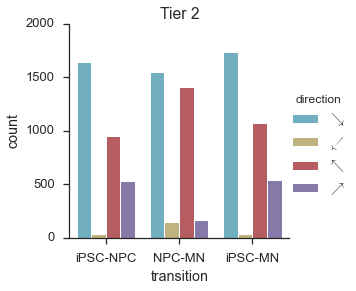

In [134]:

modality_to_arrows = {'~1': r'$\nwarrow$', '~0': r'$\searrow$', 'middle': r'$\swarrow$', 'bimodal': r'$\nearrow$',
                     'multimodal': '.'}
arrow_order = [modality_to_arrows[x] for x in MODALITY_ORDER]
arrow_colors = dict(zip(arrow_order, MODALITY_PALETTE))

g = sns.factorplot(x='transition', hue='direction', data=voyages_tier2, kind='count', hue_order=arrow_order[:-1],
              palette=arrow_colors, linewidth=1, edgecolor='white')
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
    ax.set(title='Tier 2')
g.savefig('{}/voyage_directions_count_barplot_tier2.pdf'.format(folder))

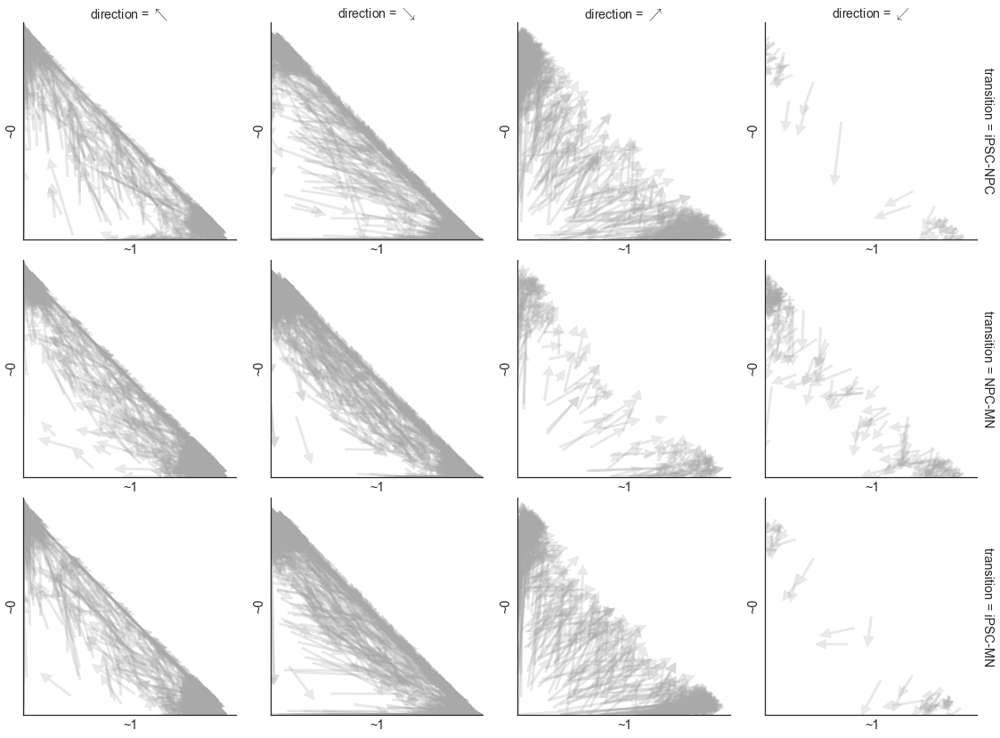

In [235]:
g = sns.FacetGrid(voyages_tier2, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='darkgrey')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_tier2.png'.format(folder))

### Plot direction of change

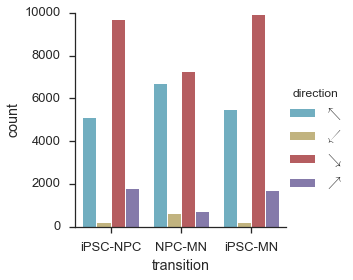

In [131]:
from modish.visualize import MODALITY_ORDER, MODALITY_PALETTE

modality_to_arrows = {'~1': r'$\nwarrow$', '~0': r'$\searrow$', 'middle': r'$\swarrow$', 'bimodal': r'$\nearrow$',
                     'multimodal': '.'}
arrow_order = [modality_to_arrows[x] for x in MODALITY_ORDER]
arrow_colors = dict(zip(arrow_order, MODALITY_PALETTE))

g = sns.factorplot(x='transition', hue='direction', data=voyage_data, kind='count', hue_order=arrow_order[:-1],
              palette=arrow_colors, linewidth=1, edgecolor='white')
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
g.savefig('{}/voyage_directions_count_barplot.pdf'.format(folder))

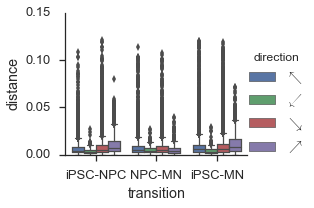

In [89]:
g = sns.factorplot(y='distance', x='transition', hue='direction', data=voyage_data, kind='box',
              hue_order=arrow_order[:-1], palette=arrow_colors, size=3, aspect=1.25, linewidth=1.25)
g.set(ylim=(0, 0.15))
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
g.savefig('{}/voyage_directions_distance_barplot.pdf'.format(folder))

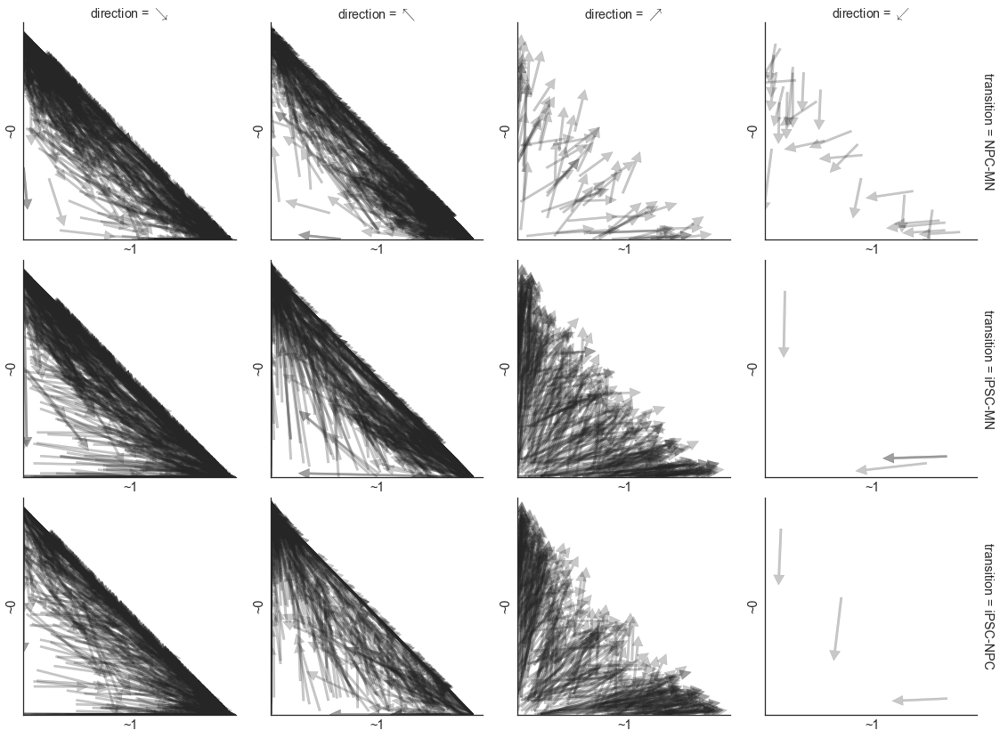

In [279]:
g = sns.FacetGrid(big_voyages, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='#262626')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_big_voyages.png'.format(folder), dpi=150)

In [91]:
study.supplemental.voyages = voyage_data

In [102]:
study.save('singlecell_pnm_figure4_voyages')

Wrote datapackage to /home/obotvinnik/flotilla_projects/singlecell_pnm_figure4_voyages/datapackage.json


## Get events traveling in similar directions

First need to get events that we see have a direction of change in all celltypes

In [93]:
all_transitions = study.supplemental.voyages.transition.unique()
print study.supplemental.voyages.shape
voyages_with_direction = study.supplemental.voyages.dropna(subset=['direction'], axis=0)

print voyages_with_direction.shape

voyages_all_transitions = voyages_with_direction.groupby('event_name').filter(
    lambda x: len(x.transition) == len(all_transitions))
voyages_all_transitions.head()

(70155, 4)
(49522, 4)


,transition,event_name,distance,direction
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$
4,iPSC-NPC,chr10:101486829-101487197:-|3p,0.004765,$\nwarrow$


### Write Tier1 events as bed files for motif finding

In [94]:
voyages_with_direction_tier1 = voyages_with_direction.loc[voyages_with_direction.event_name.isin(events_changing_in_2_methods)]
voyages_with_direction_tier1.head()

,transition,event_name,distance,direction
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$
45,iPSC-NPC,chr10:102289264-102289614:-|3p,0.031934,$\searrow$
51,iPSC-NPC,chr10:103361094-103364896:+|3p,0.010328,$\nwarrow$
76,iPSC-NPC,chr10:103565901-103567486:-|3p,0.014387,$\nwarrow$
77,iPSC-NPC,chr10:103565901-103567486:-|5p,0.020474,$\nwarrow$


### Write Tier 1 bed files

In [95]:
# %%time 
import pybedtools
import os

DIR = '/projects/ps-yeolab/obotvinnik/singlecell_pnms'
bed_folder = '{}/figure4_voyages'.format(DIR)
!mkdir $bed_folder

exon_5p = pybedtools.BedTool('{}/exon_5p.bed'.format(DIR))
exon_3p = pybedtools.BedTool('{}/exon_3p.bed'.format(DIR))

exons = {'exon_5p': exon_5p, 'exon_3p': exon_3p}

for (transition), transition_df in voyages_with_direction_tier1.groupby(['transition']):
    transition_events = set(transition_df.event_name.values)
    for direction, direction_df in transition_df.groupby('direction'):
        event_names = set(direction_df.event_name.values)
        background_events = transition_events - event_names
        directions_filename = direction.replace('\\', '').replace('$', '').replace(',', '_')
        for name, bed in exons.items():
            filename = '{}/{}_exonbody_tier1_{}_{}.bed'.format(bed_folder, name, transition, directions_filename)
            if not os.path.exists(filename):
                filtered_bed = bed.filter(lambda x: x.name in event_names)
                filtered_bed.saveas(filename)
                ! wc -l $filename

            filename = '{}/{}_exonbody_tier1_{}_{}_background.bed'.format(bed_folder, name, transition, directions_filename)
            if not os.path.exists(filename):
                filtered_bed = bed.filter(lambda x: x.name in background_events)
                filtered_bed.saveas(filename)
                ! wc -l $filename


mkdir: cannot create directory `/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages': File exists
814 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nearrow.bed
6514 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nearrow_background.bed
2568 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nearrow.bed
12394 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nearrow_background.bed
2204 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nwarrow.bed
5124 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nwarrow_background.bed
5385 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow.bed
9577 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonb

In [97]:
import os
import glob
import pybedtools

nt = 400

for bedfile in glob.iglob('{}/exon*p_exonbody_tier*.bed'.format(bed_folder)):
    if 'stream' in bedfile:
        continue
    basename = os.path.basename(bedfile)
    print basename
    prefix = basename.split('.bed')[0]
    name = 'downstream' if basename.startswith('exon_5p') else 'upstream'
    saveas = '{}/{}_{}{}.bed'.format(bed_folder, prefix, name, nt)
    print '\t', saveas
    if os.path.exists(saveas):
        continue
        
    bed = pybedtools.BedTool(bedfile)    
    if basename.startswith('exon_5p'):
        # Get downstream intron
        intron = bed.flank(l=0, r=nt, s=True, g=pybedtools.chromsizes('hg19'))
    else:
        intron = bed.flank(l=nt, r=0, s=True, g=pybedtools.chromsizes('hg19'))
    
    # Saved every exon that was exactly upstream or downstream of a junction,
    # So when taking the flanking sequence, there's a lot of repetition
    unique = pybedtools.BedTool(list(set(x for x in intron)))
    
    
    print '\t', len(intron), len(unique)
    unique.saveas(saveas)

exon_5p_exonbody_tier1_iPSC-MN_nwarrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow_downstream400.bed
	5385 342
exon_5p_exonbody_tier1_iPSC-MN_searrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_searrow_downstream400.bed
exon_5p_exonbody_tier1_NPC-MN_nwarrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_NPC-MN_nwarrow_downstream400.bed
exon_3p_exonbody_tier1_iPSC-MN_nearrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nearrow_upstream400.bed
	814 144
exon_3p_exonbody_tier2_NPC-MN_nwarrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nwarrow_upstream400.bed
exon_3p_exonbody_tier2_NPC-MN_searrow.bed
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_searrow_upstream400.bed
exon_3p_e

In [98]:
import os
from glob import iglob

clades = ('Placental', 'Primates')
conserved_template = r'/projects/ps-yeolab/genomes/hg19/database/phastConsElements46way{}.bed'

commands = []

for bedfile in iglob('{}/exon_*p_exonbody_tier*.bed'.format(bed_folder)):
    if 'placental' in bedfile or 'primates' in bedfile:
        continue
    for clade in clades:
        conserved_bed = conserved_template.format(clade)
        outbed = bedfile.replace('.bed', '_{}.bed'.format(clade.lower()))
        print outbed
        if not os.path.exists(outbed):
            ! bedtools intersect -a $bedfile -b $conserved_bed > $outbed

/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow_placental.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow_primates.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nearrow_downstream400_placental.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-MN_nearrow_downstream400_primates.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-NPC_nwarrow_upstream400_upstream400_placental.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_iPSC-NPC_nwarrow_upstream400_upstream400_primates.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_NPC-MN_nearrow_downstream400_placental.bed
/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier1_NPC-MN_nearrow

### Enrichment of tier1 events over non-changing events

In [99]:
import os
from gscripts.qtools import Submitter
import glob


findMotifsGenome = '/home/yeo-lab/software/homer/bin/findMotifsGenome.pl'
n_processors = 4
homer_flags = '-rna -len 4,5,6,7 -mset vertebrates -mis 1 -p {}'.format(n_processors)

commands = []


for bedfile in glob.iglob('{}/exon_*p_exonbody_tier*.bed'.format(bed_folder)):
    if 'background' in bedfile:
        continue
    
    basename = os.path.basename(bedfile)
    prefix = basename.split('.')[0]
#     modality = prefix.split('_')[4]
#     if modality.startswith('constitutively'):
#         continue
    
    background = bedfile.replace('arrow', 'arrow_background')
    out_dir = bedfile.replace('.bed', '_vs_other_tier1')
    command = '{} {} hg19 {} -bg {} {}'.format(
        findMotifsGenome, bedfile, out_dir, background, homer_flags)
    print '\n', command
    commands.append(command)
#     ! $command
jobname = 'homer_tier1_vs_other_tier1'
sub = Submitter(commands, jobname, walltime='4:00:00', queue='home-scrm',
                ppn=n_processors, write_and_submit=True, array=True,
                out_filename='{}/{}.out'.format(bed_folder, jobname),
                err_filename='{}/{}.err'.format(bed_folder, jobname),)

running 354 tasks as an array-job.
job ID: 3244107



/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow_vs_other_tier1 -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier1_iPSC-MN_nwarrow_background.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nwarrow_upstream400_primates.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nwarrow_upstream400_primates_vs_other_tier1 -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nwarrow_background_upstream400_primates.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bi

### Enrichment of Tier 2 events and directions

In [92]:
voyages_with_direction_tier2 = voyages_with_direction.loc[voyages_with_direction.event_name.isin(events_changing_in_1_method)]
voyages_with_direction_tier2.head()

,transition,event_name,distance,direction
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$
5,iPSC-NPC,chr10:101486829-101487197:-|5p,0.002352,$\nwarrow$
9,iPSC-NPC,chr10:102035248-102039880:-|5p,0.008876,$\searrow$


### Write exon bed files

In [94]:
# %%time 
import pybedtools

DIR = '/projects/ps-yeolab/obotvinnik/singlecell_pnms'
bed_folder = '{}/figure4_voyages'.format(DIR)
!mkdir $bed_folder
a
exon_5p = pybedtools.BedTool('{}/exon_5p.bed'.format(DIR))
exon_3p = pybedtools.BedTool('{}/exon_3p.bed'.format(DIR))

exons = {'exon_5p': exon_5p, 'exon_3p': exon_3p}

for (transition), transition_df in voyages_with_direction_tier2.groupby(['transition']):
    transition_events = set(transition_df.event_name.values)
    for direction, direction_df in transition_df.groupby('direction'):
        event_names = set(direction_df.event_name.values)
        background_events = transition_events - event_names
        directions_filename = direction.replace('\\', '').replace('$', '').replace(',', '_')
        for name, bed in exons.items():
            filtered_bed = bed.filter(lambda x: x.name in event_names)
            filename = '{}/{}_exonbody_tier2_{}_{}.bed'.format(bed_folder, name, transition, directions_filename)
            filtered_bed.saveas(filename)
            ! wc -l $filename

            filtered_bed = bed.filter(lambda x: x.name in background_events)
            filename = '{}/{}_exonbody_tier2_{}_{}_background.bed'.format(bed_folder, name, transition, directions_filename)
            filtered_bed.saveas(filename)
            ! wc -l $filename


mkdir: cannot create directory `/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages': File exists
857 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nearrow.bed
10544 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nearrow_background.bed
1417 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_NPC-MN_nearrow.bed
17953 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_NPC-MN_nearrow_background.bed
4841 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nwarrow.bed
6560 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nwarrow_background.bed
7441 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_NPC-MN_nwarrow.bed
11929 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_t

### Get upstream/downstream

In [95]:
import os
import glob
import pybedtools

nt = 400

for bedfile in glob.iglob('{}/exon*p_exonbody_tier2*.bed'.format(bed_folder)):
    if 'stream' in bedfile:
        continue
    basename = os.path.basename(bedfile)
    print basename
    prefix = basename.split('.bed')[0]
    bed = pybedtools.BedTool(bedfile)
    
    if basename.startswith('exon_5p'):
        # Get downstream intron
        intron = bed.flank(l=0, r=nt, s=True, g=pybedtools.chromsizes('hg19'))
        name = 'downstream'
    else:
        intron = bed.flank(l=nt, r=0, s=True, g=pybedtools.chromsizes('hg19'))
        name = 'upstream'
    
    # Saved every exon that was exactly upstream or downstream of a junction,
    # So when taking the flanking sequence, there's a lot of repetition
    unique = pybedtools.BedTool(list(set(x for x in intron)))
    
    
    print '\t', len(intron), len(unique)
    saveas = '{}/{}_{}{}.bed'.format(bed_folder, prefix, name, nt)
    print '\t', saveas
    unique.saveas(saveas)

exon_3p_exonbody_tier2_NPC-MN_nwarrow.bed
	4841 644
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_nwarrow_upstream400.bed
exon_3p_exonbody_tier2_NPC-MN_searrow.bed
	5266 735
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_NPC-MN_searrow_upstream400.bed
exon_3p_exonbody_tier2_iPSC-NPC_swarrow.bed
	61 13
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_iPSC-NPC_swarrow_upstream400.bed
exon_5p_exonbody_tier2_NPC-MN_searrow_background.bed
	9811 791
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_NPC-MN_searrow_background_downstream400.bed
exon_3p_exonbody_tier2_iPSC-NPC_nearrow.bed
	2060 264
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_tier2_iPSC-NPC_nearrow_upstream400.bed
exon_3p_exonbody_tier2_NPC-MN_searrow_background.bed
	6135 799
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_vo

### Get conserved regions and pretend they're "peaks"

In [ ]:
import os
from glob import iglob

clades = ('Placental', 'Primates')
conserved_template = r'/projects/ps-yeolab/genomes/hg19/database/phastConsElements46way{}.bed'

commands = []

for bedfile in iglob('{}/exon_*p_exonbody_tier*.bed'.format(bed_folder)):
    if 'placental' in bedfile or 'primates' in bedfile:
        continue
    for clade in clades:
        conserved_bed = conserved_template.format(clade)
        outbed = bedfile.replace('.bed', '_{}.bed'.format(clade.lower()))
        print outbed
        if not os.path.exists(outbed):
            ! bedtools intersect -a $bedfile -b $conserved_bed > $outbed

#### Do HOMER enrichment of motifs

In [22]:
import os

In [ ]:
import os.path.exists

In [96]:
import os
from gscripts.qtools import Submitter
import glob


findMotifsGenome = '/home/yeo-lab/software/homer/bin/findMotifsGenome.pl'
n_processors = 4
homer_flags = '-rna -len 4,5,6,7 -mset vertebrates -mis 1 -p {}'.format(n_processors)

commands = []


for bedfile in glob.iglob('{}/exon_*p_exonbody_tier2*.bed'.format(bed_folder)):
    if 'background' in bedfile:
        continue
    
    basename = os.path.basename(bedfile)
    prefix = basename.split('.')[0]
#     modality = prefix.split('_')[4]
#     if modality.startswith('constitutively'):
#         continue
    
    background = bedfile.replace('arrow', 'arrow_background')
    out_dir = bedfile.replace('.bed', '_vs_other_tier2')
    command = '{} {} hg19 {} -bg {} {}'.format(
        findMotifsGenome, bedfile, out_dir, background, homer_flags)
    if not os.path.exists(out_dir):
        print '\n', command
        commands.append(command)
#     ! $command
jobname = 'homer_tier2_vs_other_tier2'
sub = Submitter(commands, jobname, walltime='4:00:00', queue='home-scrm',
                ppn=n_processors, write_and_submit=True, array=True,
                out_filename='{}/{}.out'.format(bed_folder, jobname),
                err_filename='{}/{}.err'.format(bed_folder, jobname),)

running 32 tasks as an array-job.
job ID: 3238530



/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_swarrow_downstream400.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_swarrow_downstream400_vs_other_tier1 -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_swarrow_background_downstream400.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nearrow_downstream400.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nearrow_downstream400_vs_other_tier1 -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_tier2_iPSC-NPC_nearrow_background_downstream400.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/y

## Get events which change in the same direction between celltypes

In [21]:
transitions = map(lambda x: '-'.join(x), phenotype_transitions)
transitions

[u'iPSC-NPC', u'NPC-MN', 'iPSC-MN']

In [165]:
voyages_transition_index = voyages_all_transitions.set_index('transition')
event_directions = voyages_transition_index.groupby('event_name').apply(
    lambda x: ','.join(x.loc[transitions, 'direction']))
event_directions.name = 'directions'
event_directions.head()

event_name
chr10:101476219-101480743:-|3p    $\nwarrow$,$\searrow$
chr10:101476219-101480743:-|5p    $\nwarrow$,$\searrow$
chr10:101478258-101480743:-|3p    $\searrow$,$\nwarrow$
chr10:101478258-101480743:-|5p    $\searrow$,$\nwarrow$
chr10:101486829-101487197:-|3p    $\nwarrow$,$\searrow$
Name: directions, dtype: object

In [166]:
voyages_all_transitions = voyages_all_transitions.drop('directions', axis=1, errors='ignore')
voyages_all_transitions.head()

,transition,event_name,distance,direction
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$
4,iPSC-NPC,chr10:101486829-101487197:-|3p,0.004765,$\nwarrow$


In [167]:
voyages_all_transitions = voyages_all_transitions.join(event_directions, on='event_name')
voyages_all_transitions.head()

,transition,event_name,distance,direction,directions
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$,"$\nwarrow$,$\searrow$"
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$,"$\nwarrow$,$\searrow$"
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$,"$\searrow$,$\nwarrow$"
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$,"$\searrow$,$\nwarrow$"
4,iPSC-NPC,chr10:101486829-101487197:-|3p,0.004765,$\nwarrow$,"$\nwarrow$,$\searrow$"


,transition,event_name,distance,direction
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.015239,$\nwarrow$
1,iPSC-NPC,chr10:101476219-101480743:-|5p,0.015241,$\nwarrow$
2,iPSC-NPC,chr10:101478258-101480743:-|3p,0.013678,$\searrow$
3,iPSC-NPC,chr10:101478258-101480743:-|5p,0.020160,$\searrow$
4,iPSC-NPC,chr10:101486829-101487197:-|3p,0.004765,$\nwarrow$
5,iPSC-NPC,chr10:101486829-101487197:-|5p,0.002352,$\nwarrow$
6,iPSC-NPC,chr10:101486912-101487197:-|3p,0.005278,$\searrow$
7,iPSC-NPC,chr10:101486912-101487197:-|5p,0.001176,$\searrow$
8,iPSC-NPC,chr10:102035248-102039880:-|3p,0.007989,$\searrow$
9,iPSC-NPC,chr10:102035248-102039880:-|5p,0.008876,$\searrow$


In [50]:
voyages_all_transitions.loc[voyages_all_transitions.event_name == 'chr10:101473237-101476104:-|3p']

,transition,event_name,distance,direction,directions


In [51]:
s = voyages_all_transitions.drop_duplicates('event_name').groupby('directions').size()
s.sort(ascending=False)
s.to_frame()

,0
directions,
"$\nwarrow$,$\searrow$",3155
"$\nwarrow$,$\nwarrow$",2095
"$\searrow$,$\nwarrow$",1816
"$\searrow$,$\searrow$",1157
"$\nearrow$,$\nwarrow$",700
"$\nearrow$,$\searrow$",606
"$\nearrow$,$\swarrow$",255
"$\nwarrow$,$\swarrow$",203
"$\searrow$,$\nearrow$",202


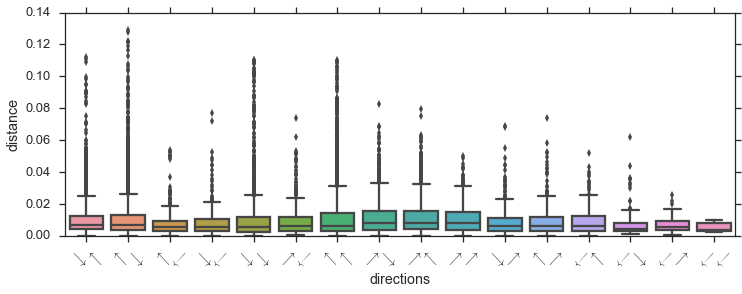

In [63]:
fig, ax = plt.subplots(figsize=(12, 4))
sns.boxplot(data=voyages_all_transitions, x='directions', y='distance')
xticklabels = [x.get_text() for x in ax.get_xticklabels()]
xticklabels = map(lambda x: x.replace(',', ''), xticklabels)
ax.set(xticklabels=xticklabels);

### Get events which have at least one change in modality

In [56]:
voyages_modalities = voyages_all_transitions.merge(study.supplemental.modalities_tidy, 
                                                   left_on='event_name', right_on='event_name')
print voyages_modalities.shape
voyages_modalities.head()

(65076, 7)


,transition,event_name,distance,direction,directions,phenotype,modality
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",MN,~0
1,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",NPC,bimodal
2,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",iPSC,~0
3,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",MN,~0
4,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",NPC,bimodal


In [57]:
voyages_modalities_phenotype = voyages_modalities.set_index('phenotype')
voyages_modalities_phenotype.head()

,transition,event_name,distance,direction,directions,modality
phenotype,,,,,,
MN,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",~0
NPC,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",bimodal
iPSC,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",~0
MN,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",~0
NPC,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",bimodal


In [58]:
voyages_modalities_phenotype = voyages_modalities_phenotype.sort_index()
voyages_modalities_phenotype.head()

,transition,event_name,distance,direction,directions,modality
phenotype,,,,,,
MN,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",~0
MN,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",~0
MN,iPSC-NPC,chr10:101476219-101480743:-|5p,0.014212,$\searrow$,"$\searrow$,$\nwarrow$",~0
MN,NPC-MN,chr10:101476219-101480743:-|5p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",~0
MN,iPSC-NPC,chr10:101478258-101480743:-|3p,0.016615,$\nwarrow$,"$\nwarrow$,$\searrow$",~1


In [64]:
modalities_all_celltypes_index = study.supplemental.modalities_tidy.set_index('phenotype')

modality_across_celltypes = modalities_all_celltypes_index.groupby('event_name', as_index=True, group_keys=False).apply(
    lambda x: ','.join(x.modality[study.phenotype_order]))
modality_across_celltypes.head()

event_name
chr10:101476219-101480743:-|3p    ~0,bimodal,~0
chr10:101476219-101480743:-|5p    ~0,bimodal,~0
chr10:101478258-101480743:-|3p    ~1,bimodal,~1
chr10:101478258-101480743:-|5p    ~1,bimodal,~1
chr10:101486912-101487197:-|3p         ~1,~1,~1
dtype: object

In [65]:
modality_across_celltypes.name = 'modality_across_celltypes'

In [66]:
voyages_modalities_phenotype = voyages_modalities_phenotype.join(modality_across_celltypes, on='event_name')
voyages_modalities_phenotype.head()

,transition,event_name,distance,direction,directions,modality,modality_across_celltypes
phenotype,,,,,,,
MN,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",~0,"~0,bimodal,~0"
MN,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",~0,"~0,bimodal,~0"
MN,iPSC-NPC,chr10:101476219-101480743:-|5p,0.014212,$\searrow$,"$\searrow$,$\nwarrow$",~0,"~0,bimodal,~0"
MN,NPC-MN,chr10:101476219-101480743:-|5p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",~0,"~0,bimodal,~0"
MN,iPSC-NPC,chr10:101478258-101480743:-|3p,0.016615,$\nwarrow$,"$\nwarrow$,$\searrow$",~1,"~1,bimodal,~1"


In [68]:
cols = ['directions', 'modality_across_celltypes']
df = voyages_modalities_phenotype.drop_duplicates(cols+['event_name'])
df.groupby(cols).size()

directions             modality_across_celltypes
$\nearrow$,$\nearrow$  ambiguous,bimodal,bimodal     10
                       bimodal,bimodal,bimodal       28
                       bimodal,bimodal,~0             1
                       bimodal,bimodal,~1             1
                       middle,bimodal,bimodal         1
                       ~0,ambiguous,bimodal           1
                       ~0,bimodal,bimodal             9
                       ~0,bimodal,~0                  1
                       ~0,~0,bimodal                  8
                       ~0,~0,~0                      53
                       ~1,ambiguous,bimodal           1
                       ~1,bimodal,bimodal            11
                       ~1,bimodal,~1                  1
                       ~1,~1,bimodal                 17
                       ~1,~1,~1                      50
$\nearrow$,$\nwarrow$  ambiguous,bimodal,bimodal     13
                       ambiguous,bimodal,~0           2

In [70]:
starting_modalities = study.supplemental.modalities_tidy.loc[
    study.supplemental.modalities_tidy.phenotype == study.phenotype_order[0]]
starting_modalities.head()

,event_name,phenotype,modality
2,chr10:101476219-101480743:-|3p,iPSC,~0
5,chr10:101476219-101480743:-|5p,iPSC,~0
8,chr10:101478258-101480743:-|3p,iPSC,~1
11,chr10:101478258-101480743:-|5p,iPSC,~1
14,chr10:101486912-101487197:-|3p,iPSC,~1


In [71]:
starting_modalities = starting_modalities.set_index('event_name').modality
starting_modalities.name = 'starting_modality'

In [72]:
starting_modalities.head()

event_name
chr10:101476219-101480743:-|3p    ~0
chr10:101476219-101480743:-|5p    ~0
chr10:101478258-101480743:-|3p    ~1
chr10:101478258-101480743:-|5p    ~1
chr10:101486912-101487197:-|3p    ~1
Name: starting_modality, dtype: object

In [73]:
voyages_modalities = voyages_modalities.join(starting_modalities, on='event_name')

In [74]:
voyages_change_modality = voyages_modalities.groupby('event_name').filter(lambda x: len(x.modality.unique()) > 1)
print voyages_change_modality.shape
voyages_change_modality.head()

(22134, 8)


,transition,event_name,distance,direction,directions,phenotype,modality,starting_modality
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",MN,~0,~0
1,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",NPC,bimodal,~0
2,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",iPSC,~0,~0
3,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",MN,~0,~0
4,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",NPC,bimodal,~0


In [75]:
voyages_change_modalities_events_only = voyages_change_modality.drop(['transition', 'direction', 'phenotype', 'modality'], axis=1)
print voyages_change_modalities_events_only.shape
voyages_change_modalities_events_only = voyages_change_modalities_events_only.drop_duplicates()
print voyages_change_modalities_events_only.shape
voyages_change_modalities_events_only.head()

(22134, 4)
(7346, 4)


,event_name,distance,directions,starting_modality
0,chr10:101476219-101480743:-|3p,0.014209,"$\searrow$,$\nwarrow$",~0
3,chr10:101476219-101480743:-|3p,0.014694,"$\searrow$,$\nwarrow$",~0
6,chr10:101476219-101480743:-|5p,0.014212,"$\searrow$,$\nwarrow$",~0
9,chr10:101476219-101480743:-|5p,0.014694,"$\searrow$,$\nwarrow$",~0
12,chr10:101478258-101480743:-|3p,0.016615,"$\nwarrow$,$\searrow$",~1


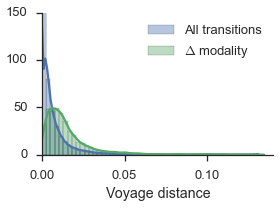

In [76]:
fig, ax = plt.subplots(figsize=(4, 3))
sns.distplot(study.supplemental.voyages.distance, label='All transitions')
sns.distplot(voyages_change_modalities_events_only.distance, label='$\Delta$ modality')
ax.legend()

xmin, xmax = ax.get_xlim()
ax.set(xlim=(0, xmax), xlabel='Voyage distance')
ax.locator_params(nbins=4)
sns.despine()
fig.tight_layout()
fig.savefig('{}/voyages_with_modality_change_distance_histogram.pdf'.format(folder))

In [77]:
s = voyages_change_modalities_events_only.groupby(['starting_modality', 'directions']).size()
s.sort(ascending=False)
s.to_frame()

0
starting_modality directions                 
bimodal           $\nwarrow$,$\searrow$  1057
                  $\nwarrow$,$\nwarrow$  1020
~1                $\nwarrow$,$\nwarrow$   822
~0                $\searrow$,$\searrow$   650
~1                $\nwarrow$,$\searrow$   471
~0                $\searrow$,$\nwarrow$   450
                  $\nwarrow$,$\searrow$   402
bimodal           $\searrow$,$\nwarrow$   346
~1                $\nearrow$,$\nwarrow$   326
                  $\searrow$,$\nwarrow$   306
~0                $\nearrow$,$\searrow$   258
bimodal           $\searrow$,$\searrow$   224
~1                $\nearrow$,$\searrow$   112
~0                $\nearrow$,$\nwarrow$   104
~1                $\nwarrow$,$\swarrow$    60
                  $\nearrow$,$\nearrow$    60
                  $\nearrow$,$\swarrow$    58
                  $\nwarrow$,$\nearrow$    54
bimodal           $\nearrow$,$\nwarrow$    46
                  $\nearrow$,$\searrow$    44
~0                $\nearrow$,$\swarrow$    44
bimodal           $\nwarrow$,$\swarrow$    42
~0                $\nearrow$,$\nearrow$    38
                  $\searrow$,$\swarrow$    34
ambiguous         $\nearrow$,$\nwarrow$    32
~1                $\swarrow$,$\nwarrow$    32
~0                $\searrow$,$\nearrow$    32
                  $\swarrow$,$\searrow$    30
bimodal           $\searrow$,$\swarrow$    24
ambiguous         $\nearrow$,$\searrow$    22
                  $\nearrow$,$\nearrow$    20
bimodal           $\nwarrow$,$\nearrow$    20
                  $\swarrow$,$\nwarrow$    18
~0                $\nwarrow$,$\nearrow$    16
bimodal           $\swarrow$,$\searrow$    12
~1                $\searrow$,$\nearrow$    10
~0                $\swarrow$,$\nearrow$     6
bimodal           $\searrow$,$\nearrow$     6
~1                $\swarrow$,$\nearrow$     6
bimodal           $\nearrow$,$\nearrow$     4
ambiguous         $\searrow$,$\searrow$     4
                  $\nwarrow$,$\nwarrow$     4
bimodal           $\swarrow$,$\nearrow$     4
~1                $\searrow$,$\searrow$     4
middle            $\nearrow$,$\nwarrow$     4
                  $\nearrow$,$\nearrow$     2
~0                $\nwarrow$,$\nwarrow$     2
bimodal           $\nearrow$,$\swarrow$     2
ambiguous         $\nwarrow$,$\nearrow$     2

#### Show trends of violinplots

In [85]:
pkm_events = study.splicing.maybe_renamed_to_feature_id('PKM')

In [87]:
voyages_change_modality.groupby('transition').distance.mean()

transition
NPC-MN      0.014168
iPSC-NPC    0.016895
Name: distance, dtype: float64

In [86]:
voyages_change_modality.loc[voyages_change_modality.event_name.isin(pkm_events)]

,transition,event_name,distance,direction,directions,phenotype,modality,starting_modality
15870,iPSC-NPC,chr15:72492997-72494794:-|3p,0.004432,$\nwarrow$,"$\nwarrow$,$\nwarrow$",MN,bimodal,~1
15871,iPSC-NPC,chr15:72492997-72494794:-|3p,0.004432,$\nwarrow$,"$\nwarrow$,$\nwarrow$",NPC,~1,~1
15872,iPSC-NPC,chr15:72492997-72494794:-|3p,0.004432,$\nwarrow$,"$\nwarrow$,$\nwarrow$",iPSC,~1,~1
15873,NPC-MN,chr15:72492997-72494794:-|3p,0.044691,$\nwarrow$,"$\nwarrow$,$\nwarrow$",MN,bimodal,~1
15874,NPC-MN,chr15:72492997-72494794:-|3p,0.044691,$\nwarrow$,"$\nwarrow$,$\nwarrow$",NPC,~1,~1
15875,NPC-MN,chr15:72492997-72494794:-|3p,0.044691,$\nwarrow$,"$\nwarrow$,$\nwarrow$",iPSC,~1,~1
15876,iPSC-NPC,chr15:72492997-72494794:-|5p,0.027772,$\nwarrow$,"$\nwarrow$,$\nwarrow$",MN,bimodal,~1
15877,iPSC-NPC,chr15:72492997-72494794:-|5p,0.027772,$\nwarrow$,"$\nwarrow$,$\nwarrow$",NPC,~1,~1
15878,iPSC-NPC,chr15:72492997-72494794:-|5p,0.027772,$\nwarrow$,"$\nwarrow$,$\nwarrow$",iPSC,~1,~1
15879,NPC-MN,chr15:72492997-72494794:-|5p,0.040028,$\nwarrow$,"$\nwarrow$,$\nwarrow$",MN,bimodal,~1


### Plot junctions moving in same direction

In [18]:
# import matplotlib as mpl

# singles_no_outliers_ids = study.splicing.singles.index.difference(study.splicing.outliers.index)

# for directions, df in voyages_change_modality.groupby(['directions']):
#     events = df.event_name.unique()
#     print directions, len(events)
#     directions_filename = directions.replace('\\', '').replace('$', '').replace(',', '_')

#     if len(events) < 20:
#         print study.splicing.feature_data.gene_name[events]
#         for event in events:
#             gene_name = study.splicing.feature_data.gene_name[event]
#             study.plot_event(event, sample_subset='~outlier')
#             fig = plt.gcf()
#             fig.savefig('{}/{}_{}_{}.pdf'.format(folder, directions_filename, gene_name, event))
    
#     fig, ax = plt.subplots(figsize=(2.5, 2.5))
    
#     if len(events) > 100:
#         events = np.random.choice(events, size=100, replace=False)
        
# #     modalities_split = modalities.split(',')
# #     color = [modality_colors[x] for x in modalities_split]
    
#     for event in events:
#         try:
#             study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
#                                        sample_ids=singles_no_outliers_ids, stripplot=False, get_pooled=False,
#                                       phenotype_order=study.phenotype_order, ax=ax, color=study.phenotype_color_ordered,
#                                       bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
#         except ValueError:
#             continue
            
#     ax.set(title='{}'.format(directions.replace(',', '')), 
#            xticklabels=study.phenotype_order, xlabel='')
#     sns.despine()
#     alpha = max(1./(len(events)+1.), 0.1)
    
#     # Add transparency
#     polycollections = [x for x in ax.collections if isinstance(x, mpl.collections.PolyCollection)]
#     for polycollection in polycollections:
#         polycollection.set_alpha(alpha)
#     fig.tight_layout()

#     fig.savefig('{}/stacked_violinplots_{}.pdf'.format(folder, directions_filename))

### Plot junctions moving in same direction, starting from same modality

In [19]:
# import matplotlib as mpl

# singles_no_outliers_ids = study.splicing.singles.index.difference(study.splicing.outliers.index)

# for (starting_modality, directions), df in voyages_change_modality.groupby(['starting_modality', 'directions']):
#     events = df.event_name.unique()
#     print starting_modality, directions, len(events)
#     directions_filename = directions.replace('\\', '').replace('$', '').replace(',', '_')

#     if len(events) < 20:
#         print study.splicing.feature_data.gene_name[events]
#         for event in events:
#             gene_name = study.splicing.feature_data.gene_name[event]
#             study.plot_event(event, sample_subset='~outlier')
#             fig = plt.gcf()
#             fig.savefig('{}/{}_{}_{}_{}.pdf'.format(folder, starting_modality, directions_filename, gene_name, event))
    
#     fig, ax = plt.subplots(figsize=(2.5, 2.5))
    
#     if len(events) > 100:
#         events = np.random.choice(events, size=100, replace=False)
        
# #     modalities_split = modalities.split(',')
# #     color = [modality_colors[x] for x in modalities_split]
    
#     for event in events:
#         try:
#             study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
#                                        sample_ids=singles_no_outliers_ids, stripplot=False, get_pooled=False,
#                                       phenotype_order=study.phenotype_order, ax=ax, color=study.phenotype_color_ordered,
#                                       bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
#         except ValueError:
#             continue
            
#     ax.set(title='{}:{}'.format(starting_modality, directions.replace(',', '')), 
#            xticklabels=study.phenotype_order, xlabel='')
#     sns.despine()
#     alpha = max(1./(len(events)+1.), 0.1)
    
#     # Add transparency
#     polycollections = [x for x in ax.collections if isinstance(x, mpl.collections.PolyCollection)]
#     for polycollection in polycollections:
#         polycollection.set_alpha(alpha)
#     fig.tight_layout()

#     fig.savefig('{}/stacked_violinplots_{}_{}.pdf'.format(folder, starting_modality, directions_filename))

### Make BED files of voyage directions

In [20]:
bed_folder = '/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages'

In [12]:
import pybedtools
import os

def format_directions(directions):
    return directions.replace('\\', '').replace('$', '').replace(',', '_')


DIR = '/projects/ps-yeolab/obotvinnik/singlecell_pnms'

# upstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_upstream400.bed'.format(DIR))
# downstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_downstream400.bed'.format(DIR))e
exon_5p = pybedtools.BedTool('{}/exon_5p.bed'.format(DIR))
exon_3p = pybedtools.BedTool('{}/exon_3p.bed'.format(DIR))

background_events = set(voyages_change_modality.event_name.unique())

exons = {'exon_5p': exon_5p, 'exon_3p': exon_3p}

for directions, df in voyages_change_modality.groupby('directions'):
    events = set(df.event_name)
    print directions, len(events)
    directions_filename = format_directions(directions)
    for name, bed in exons.items():

        filtered_filename = '{}/{}_exonbody_{}.bed'.format(folder, name, directions_filename)
        background_filename = '{}/{}_exonbody_{}_background.bed'.format(folder, name, directions_filename)

        if not os.path.exists(filtered_filename):
            filtered_bed = bed.filter(lambda x: x.name in events)
            filtered_bed.saveas(filtered_filename)
            ! wc -l $filtered_filename

            
#         if not os.path.exists(background_filename):
        background_bed = bed.filter(lambda x: x.name not in events and x.name in background_events)
        background_bed.saveas(background_filename)
        ! wc -l $background_filename

NameError: name 'voyages_change_modality' is not defined

In [188]:
import pybedtools

def format_directions(directions):
    return directions.replace('\\', '').replace('$', '').replace(',', '_')

DIR = '/projects/ps-yeolab/obotvinnik/singlecell_pnms'

# upstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_upstream400.bed'.format(DIR))
# downstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_downstream400.bed'.format(DIR))e
exon_5p = pybedtools.BedTool('{}/exon_5p.bed'.format(DIR))
exon_3p = pybedtools.BedTool('{}/exon_3p.bed'.format(DIR))

background_events = set(voyages_change_modality.event_name.unique())

exons = {'exon_5p': exon_5p, 'exon_3p': exon_3p}

for (directions, starting_modality), df in voyages_change_modality.groupby(['directions', 'starting_modality']):
    events = set(df.event_name)
    print directions, len(events)
    directions_filename = format_directions(directions)
    for name, bed in exons.items():
        filtered_filename = '{}/{}_exonbody_{}_{}.bed'.format(folder, name, directions_filename, starting_modality)
        background_filename = '{}/{}_exonbody_{}_{}_background.bed'.format(folder, name, directions_filename, starting_modality)

        if not os.path.exists(filtered_filename):
            filtered_bed = bed.filter(lambda x: x.name in events)
            filtered_bed.saveas(filtered_filename)
            ! wc -l $filtered_filename

            
#         if not os.path.exists(background_filename):
        background_bed = bed.filter(lambda x: x.name in background_events and x.name not in events)
        background_bed.saveas(background_filename)
        ! wc -l $background_filename

$\nearrow$,$\nearrow$ 11
14331 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_ambiguous_background.bed
25404 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_nearrow_ambiguous_background.bed
$\nearrow$,$\nearrow$ 2
14353 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_bimodal_background.bed
25484 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_nearrow_bimodal_background.bed
$\nearrow$,$\nearrow$ 1
14353 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_middle_background.bed
25488 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_nearrow_middle_background.bed
$\nearrow$,$\nearrow$ 21
14256 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_~0_background.bed
25292 /projects/ps-yeolab/obot

## Motif analysis: HOMER

In [189]:
homer_dir = '/home/obotvinnik/projects/singlecell_pnms/analysis/homer/figure4_voyages'

In [190]:
mkdir $homer_dir

mkdir: cannot create directory `/home/obotvinnik/projects/singlecell_pnms/analysis/homer/figure4_voyages': File exists


### Extract upstream/downstream sequences

In [219]:
import os
import glob
import pybedtools

nt = 200
bed_folder = '/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages'

for bedfile in glob.iglob('{}/exon*p_exonbody*.bed'.format(bed_folder)):
    if 'stream' in bedfile:
        continue
        
    basename = os.path.basename(bedfile)
    print basename
    prefix = basename.split('.bed')[0]
    bed = pybedtools.BedTool(bedfile)
    
    if basename.startswith('exon_5p'):
        # Get downstream intron
        intron = bed.flank(l=0, r=nt, s=True, g=pybedtools.chromsizes('hg19'))
        name = 'downstream'
    else:
        intron = bed.flank(l=nt, r=0, s=True, g=pybedtools.chromsizes('hg19'))
        name = 'upstream'
    
    # Saved every exon that was exactly upstream or downstream of a junction,
    # So when taking the flanking sequence, there's a lot of repetition
    unique = pybedtools.BedTool(list(set(x for x in intron)))
    
    
    print '\t', len(intron), len(unique)
    saveas = '{}/{}_{}{}.bed'.format(bed_folder, prefix, name, nt)
    print '\t', saveas
    unique.saveas(saveas)

exon_3p_exonbody_nearrow_nearrow_~1.bed
	61 17
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_~1_upstream200.bed
exon_5p_exonbody_nearrow_nwarrow_ambiguous.bed
	3 3
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_nwarrow_ambiguous_downstream200.bed
exon_5p_exonbody_nearrow_nwarrow_bimodal.bed
	137 11
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_nwarrow_bimodal_downstream200.bed
exon_5p_exonbody_nwarrow_swarrow_bimodal_background.bed
	25166 2166
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nwarrow_swarrow_bimodal_background_downstream200.bed
exon_5p_exonbody_~0.bed
	196 9
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_~0_downstream200.bed
exon_5p_exonbody_searrow_nwarrow_~1.bed
	1912 176
	/projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_searrow_nwarrow_~1

### Run `findMotifsGenome.pl`

In [221]:
import os
from gscripts.qtools import Submitter
import glob


findMotifsGenome = '/home/yeo-lab/software/homer/bin/findMotifsGenome.pl'
n_processors = 4
homer_flags = '-rna -len 4,5,6,7 -mset vertebrates -mis 1 -p {}'.format(n_processors)

commands = []


for bedfile in glob.iglob('{}/exon_*p_exonbody*arrow*.bed'.format(bed_folder)):
    if 'background' in bedfile:
        continue
    
    
    basename = os.path.basename(bedfile)
    print '\n', basename
    prefix = basename.split('.')[0]
    arrows = '_'.join(prefix.split('_')[3:5])
    try:
        modality = prefix.split('_')[5]
    except IndexError:
        modality = ''
    if modality.startswith('constitutively'):
        continue
    
    if modality:
        background = bedfile.replace(modality, modality+ '_background')
    else:
        background = bedfile.replace(arrows, arrows+'_background')
    out_dir = bedfile.replace('.bed', '_vs_other_modality_trios')
    command = '{} {} hg19 {} -bg {} {}'.format(
        findMotifsGenome, bedfile, out_dir, background, homer_flags)
    print '\t', command
    commands.append(command)
#     ! $command
jobname = 'homer_voyaging_modalities'
sub = Submitter(commands, jobname, walltime='2:00:00', queue='home-scrm',
               ppn=n_processors, write_and_submit=True, array=True,
               out_filename='{}/{}.out'.format(homer_dir, jobname),
               err_filename='{}/{}.err'.format(homer_dir, jobname),
               )


exon_3p_exonbody_nearrow_nearrow_~1.bed
	/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_~1.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_~1_vs_other_modality_trios -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_nearrow_~1_background.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

exon_3p_exonbody_nwarrow_nearrow_~0_upstream200.bed
	/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nwarrow_nearrow_~0_upstream200.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nwarrow_nearrow_~0_upstream200_vs_other_modality_trios -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nwarrow_nearrow_~0_background_upstream200.bed -rna -len 4,5,6,

running 396 tasks as an array-job.
job ID: 3149952


	/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_searrow_~0.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_searrow_~0_vs_other_modality_trios -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_3p_exonbody_nearrow_searrow_~0_background.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

exon_5p_exonbody_nearrow_swarrow_~1_downstream200.bed
	/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_swarrow_~1_downstream200.bed hg19 /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_swarrow_~1_downstream200_vs_other_modality_trios -bg /projects/ps-yeolab/obotvinnik/singlecell_pnms/figure4_voyages/exon_5p_exonbody_nearrow_swarrow_~1_background_downstream200.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4



## GO enrichment of transition directions

In [89]:
import itertools


def plot_go_enrichment(x_col='bonferonni_corrected_p_value', data=None, ax=None, max_categories=10,
                       **kwargs):
    data[x_col] = data[x_col].replace(0, np.nan)
    vmin = max(data[x_col].dropna().min(), 1e-25)
    if np.isnan(vmin):
        vmin = 1e-25
    data.loc[:, x_col] = data[x_col].fillna(vmin*.9)
    if data.shape[0] > max_categories:
        data = data.iloc[-max_categories: , :]
    if ax is None:
        ax = plt.gca()

    bottom = np.arange(data.shape[0])
    width = -np.log10(data[x_col])
    ax.barh(bottom, width, **kwargs)
    xticks = list(sorted(list(set(int(x) for x in ax.get_xticks()))))
    ax.set(yticks=bottom+0.4, yticklabels=data.go_name, xlabel='$-\log_{10}(q)$',
           ylim=(0, bottom.max()+1))
    sns.despine()
#     fig.tight_layout()
    return ax

def event_name_to_ensembl_ids(event_names):
    return list(itertools.chain(*study.splicing.feature_data.ensembl_id[np.unique(event_names)].dropna().str.split(',').values))

### GO enrichment of directions

In [196]:
folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages'

$\nearrow$,$\nearrow$ (62,)
                              features_of_interest_in_go_term  \
GO:0005654  ENSG00000143106,ENSG00000170144,ENSG0000011587...   
GO:0008137    ENSG00000160194,ENSG00000136521,ENSG00000168653   
GO:0006120    ENSG00000160194,ENSG00000136521,ENSG00000168653   
GO:0000398  ENSG00000170144,ENSG00000115875,ENSG0000019711...   
GO:0005747    ENSG00000160194,ENSG00000136521,ENSG00000168653   

                 features_of_interest_in_go_term_gene_symbols  \
GO:0005654  PSMA5,HNRNPA3,SRSF7,PCBP2,UBA52,HNRNPR,RBMX,PR...   
GO:0008137                               NDUFV3,NDUFB5,NDUFS5   
GO:0006120                               NDUFV3,NDUFB5,NDUFS5   
GO:0000398             HNRNPA3,SRSF7,PCBP2,HNRNPR,RBMX,HNRNPC   
GO:0005747                               NDUFV3,NDUFB5,NDUFS5   

                     go_domain  \
GO:0005654  cellular_component   
GO:0008137  molecular_function   
GO:0006120  biological_process   
GO:0000398  biological_process   
GO:0005747  cellular

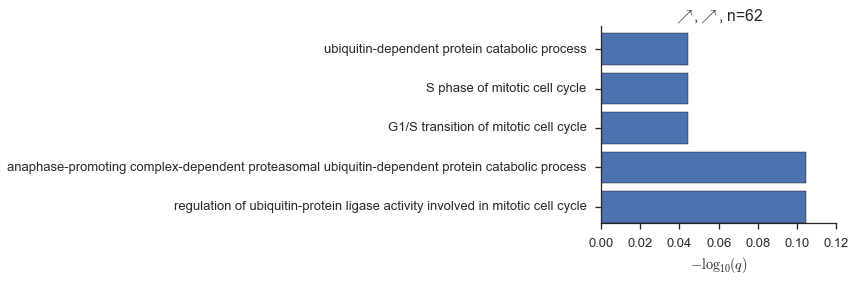

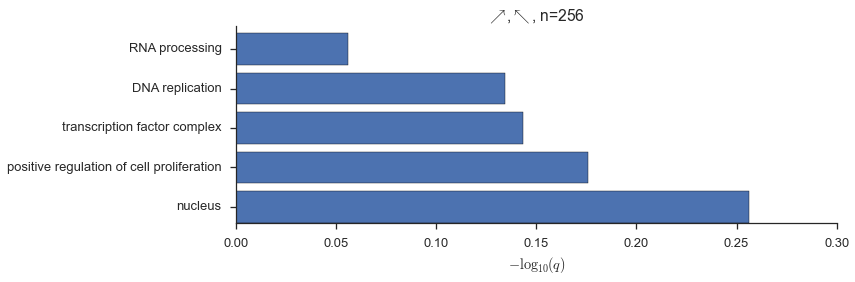

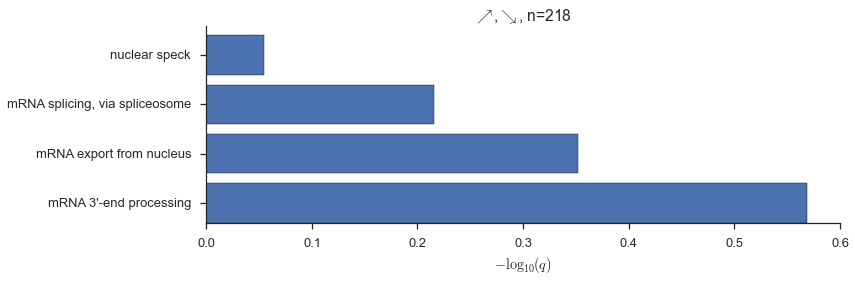

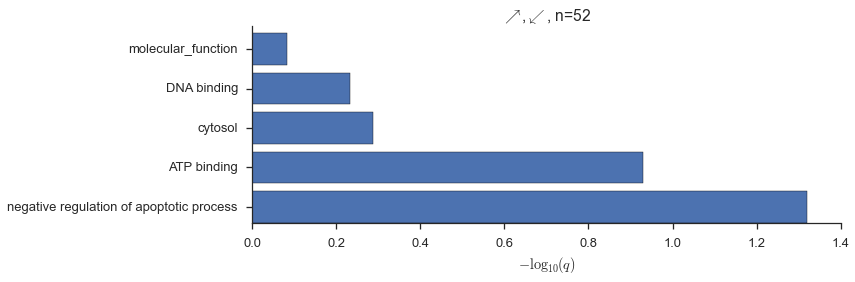

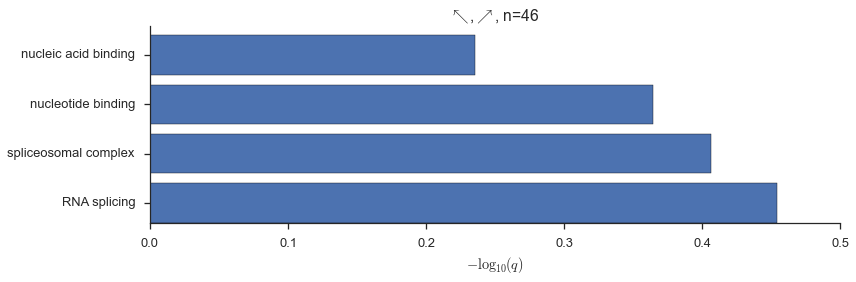

...

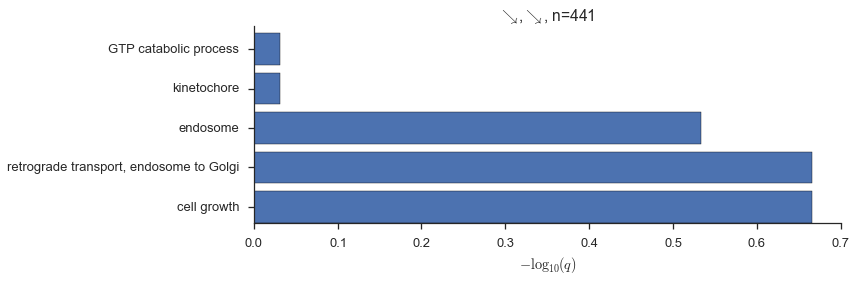

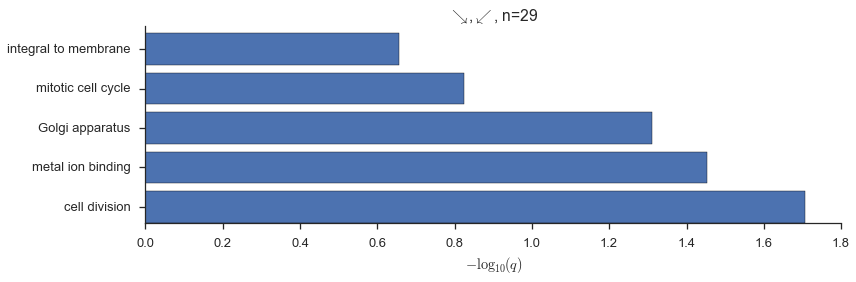

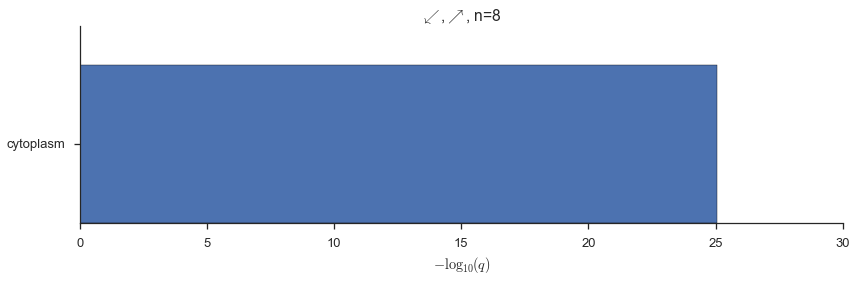

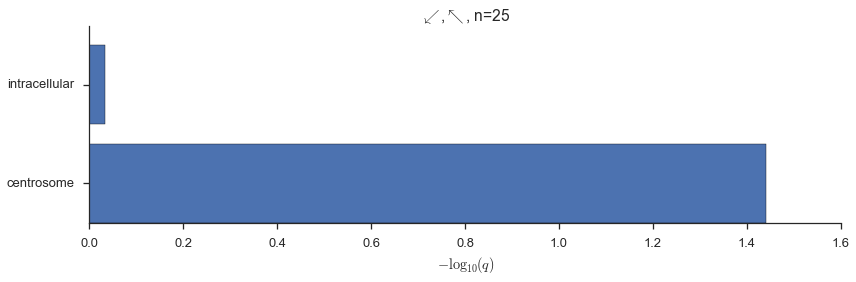

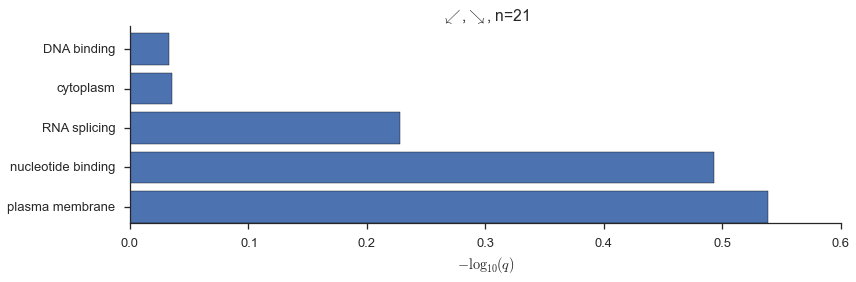

In [90]:
background = pd.Series(np.unique(event_name_to_ensembl_ids(voyages_change_modalities_events_only.event_name)))
background.to_csv('{}/voyages_change_modalities_background.txt'.format(folder), index=False, header=False)

directions_go_dfs = []

for directions, df in voyages_change_modality.groupby('directions'):
    events = df.event_name.unique()
    print directions, events.shape
    
    direction_genes = pd.Series(np.unique(event_name_to_ensembl_ids(events)))
    try:
        go = study.go_enrichment(direction_genes.values, background.values, p_value_cutoff=1)
    except ValueError:
        continue
    if go is None or go.empty:
        print '\t... empty GO enrichment!'
        continue
    fig, ax = plt.subplots(figsize=(12, 4))
    plot_go_enrichment(data=go, max_categories=5, ax=ax)

    
    go['directions'] = directions
    directions_go_dfs.append(go)
    
    print go.head()
    ax.set_title('{}, n={}'.format(directions, events.shape[0]))
    fig = plt.gcf()
    fig.tight_layout()

    directions_filename = directions.replace('\\', '').replace('$', '').replace(',', '_')
    prefix = '{}/direction_go_enrichment_across_celltypes_{}'.format(folder, directions_filename)
    direction_genes.to_csv('{}_ensembl_genes.txt'.format(prefix), index=False, header=False)
    go.to_csv('{}.csv'.format(prefix))

    fig.savefig('{}.pdf'.format(prefix))
directions_go = pd.concat(directions_go_dfs)

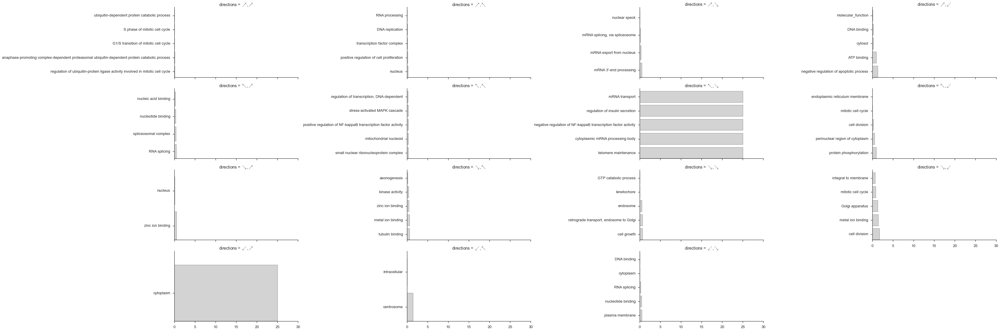

In [94]:
g = sns.FacetGrid(directions_go, col='directions', size=4, aspect=3, sharey=False, col_wrap=4)
g.map_dataframe(plot_go_enrichment, x_col=u'bonferonni_corrected_p_value', max_categories=5, color='lightgrey')
# g.set(title='')
g.fig.savefig('{}/directions_go_enrichment.pdf'.format(folder))

### GO enrichment of directions and starting modalities

ambiguous $\nearrow$,$\nearrow$ 10
                            features_of_interest_in_go_term  \
GO:0003676  ENSG00000169714,ENSG00000125944,ENSG00000170144   
GO:0005654  ENSG00000125944,ENSG00000154582,ENSG00000170144   
GO:0010467  ENSG00000125944,ENSG00000154582,ENSG00000170144   
GO:0005634  ENSG00000169714,ENSG00000125944,ENSG00000170144   

           features_of_interest_in_go_term_gene_symbols           go_domain  \
GO:0003676                          CNBP,HNRNPR,HNRNPA3  molecular_function   
GO:0005654                         HNRNPR,TCEB1,HNRNPA3  cellular_component   
GO:0010467                         HNRNPR,TCEB1,HNRNPA3  biological_process   
GO:0005634                          CNBP,HNRNPR,HNRNPA3  cellular_component   

                         go_name  n_background_in_go_term  \
GO:0003676  nucleic acid binding                      102   
GO:0005654           nucleoplasm                      120   
GO:0010467       gene expression                      176   
GO:000563

/home/obotvinnik/workspace-git/flotilla/flotilla/data_model/gene_ontology.py:160: UserWarning: No GO categories enriched in provided features
  warnings.warn('No GO categories enriched in provided features')


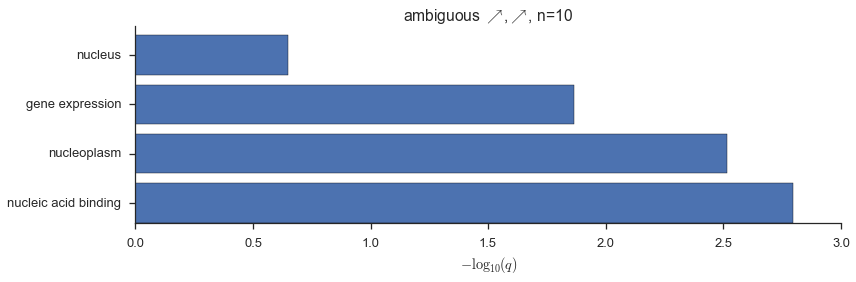

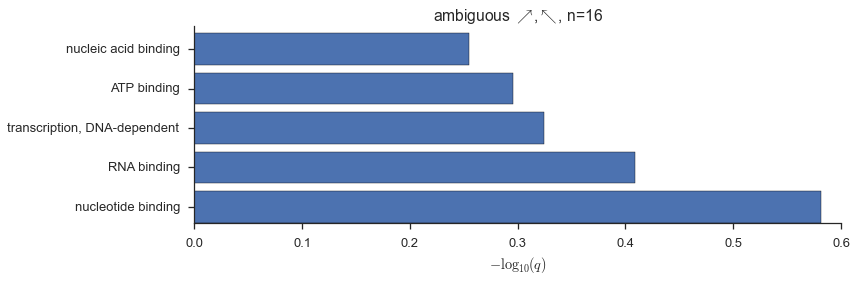

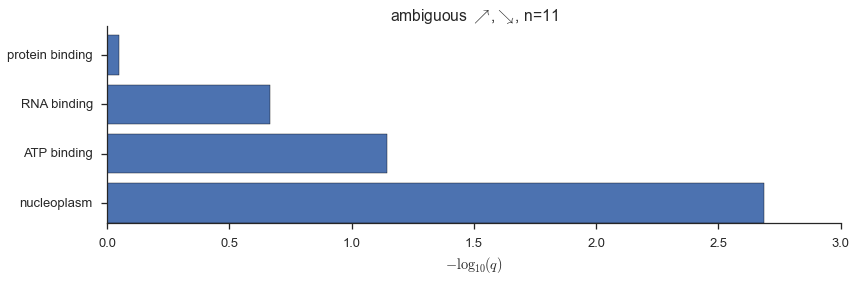

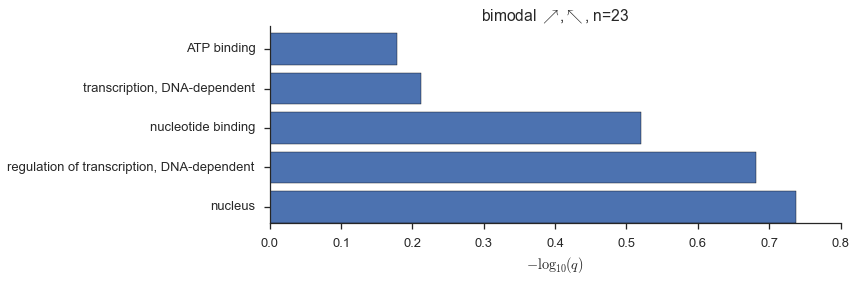

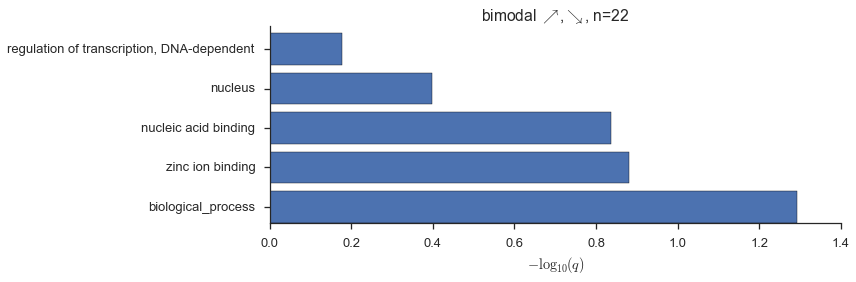

...

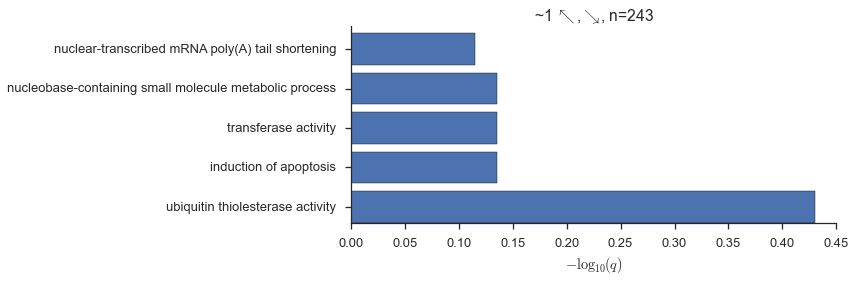

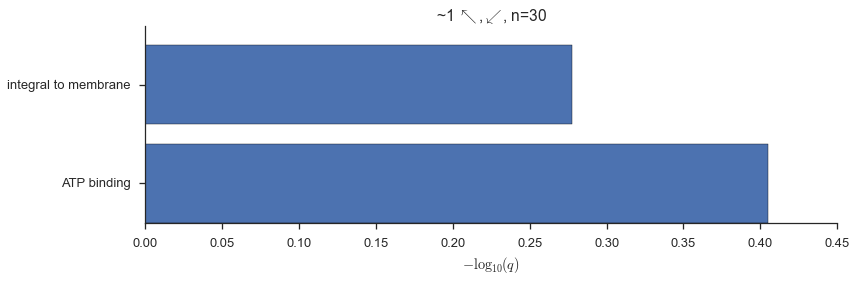

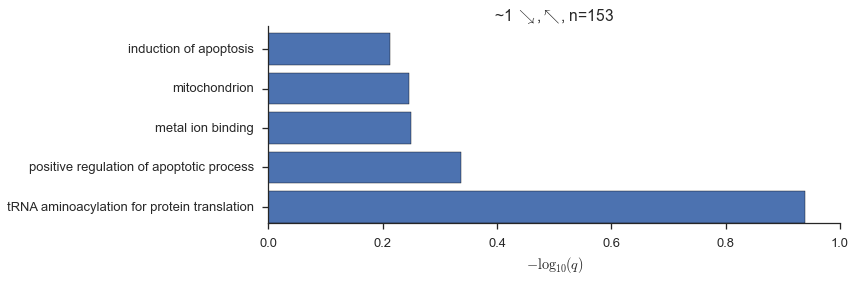

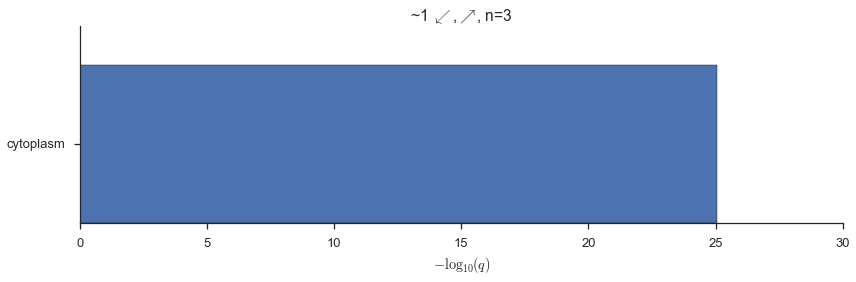

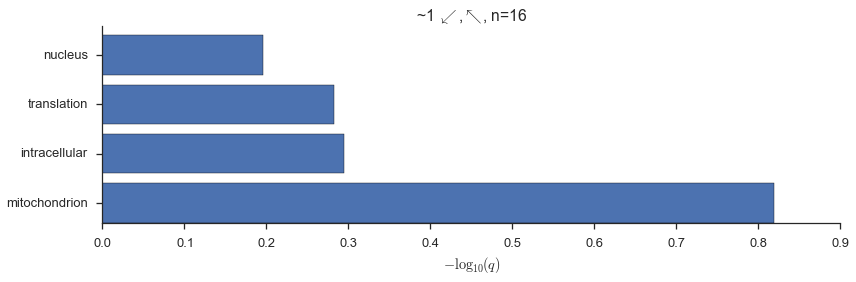

In [95]:
background = pd.Series(np.unique(event_name_to_ensembl_ids(voyages_change_modalities_events_only.event_name)))

directions_starting_modality_go_dfs = []

for (starting_modality, directions), df in voyages_change_modality.groupby(['starting_modality', 'directions']):
    events = df.event_name.unique()
    print starting_modality, directions, len(events)
    
    direction_genes = pd.Series(np.unique(event_name_to_ensembl_ids(events)))
    
    try:
        go = study.go_enrichment(direction_genes.values, background.values, p_value_cutoff=1)
    except ValueError:
        continue
    if go is None or go.empty:
        print '\t... empty GO enrichment!'
        continue
    fig, ax = plt.subplots(figsize=(12, 4))
    plot_go_enrichment(data=go, max_categories=5, ax=ax)


    go['starting_modality'] = starting_modality
    go['directions'] = directions
    directions_starting_modality_go_dfs.append(go)
    
    print go.head()
    ax.set_title('{} {}, n={}'.format(starting_modality, directions, events.shape[0]))
    fig = plt.gcf()
    fig.tight_layout()

    directions_filename = directions.replace('\\', '').replace('$', '').replace(',', '_')
    prefix = '{}/direction_go_enrichment_across_celltypes_{}_{}'.format(folder, starting_modality, directions_filename)
    direction_genes.to_csv('{}_ensembl_genes.txt'.format(prefix), index=False, header=False)

    go.to_csv('{}.csv'.format(prefix))

    fig.savefig('{}.pdf'.format(prefix))
directions_starting_modality_go = pd.concat(directions_starting_modality_go_dfs)

In [ ]:
voyages_change_modality.groupby(['starting_modality', 'directions'])

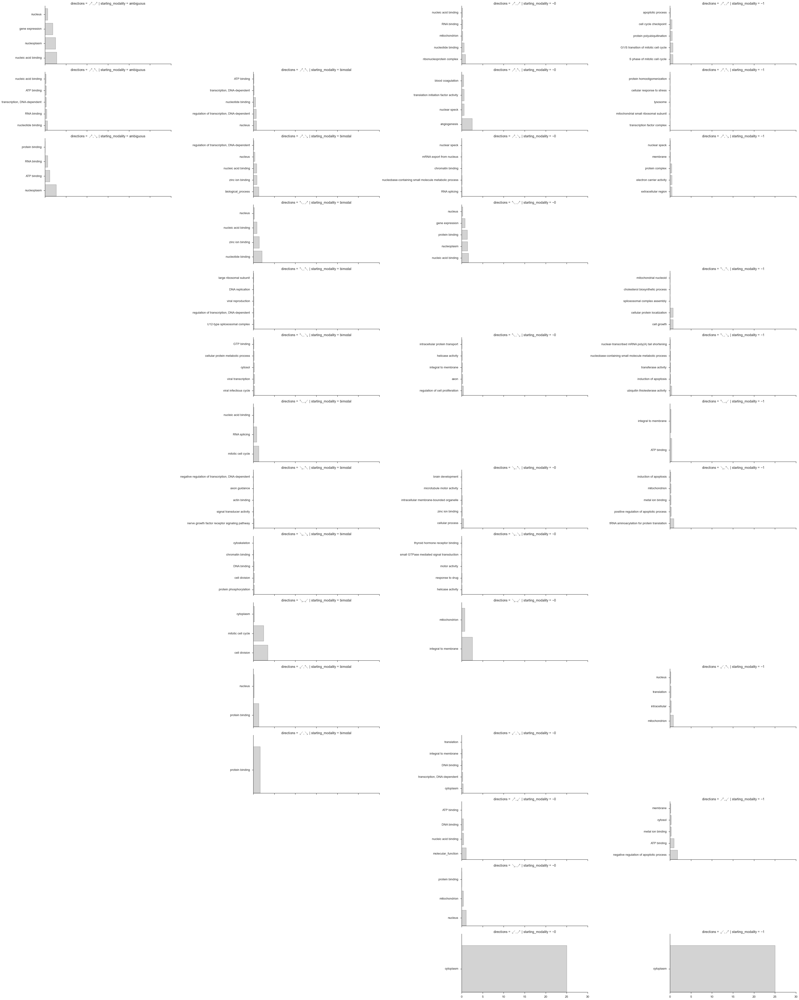

In [98]:
g = sns.FacetGrid(directions_starting_modality_go, row='directions', size=4, aspect=3, sharey=False, col='starting_modality')
g.map_dataframe(plot_go_enrichment, x_col=u'bonferonni_corrected_p_value', max_categories=5, color='lightgrey')
# g.set(title='')
for ax in g.axes.flat:
    if len(ax.patches) == 0:
        ax.axis('off')
        ax.set_title('')
g.fig.savefig('{}/directions_starting_modality_go_enrichment.pdf'.format(folder))

### Plot voyage space of changing events

In [105]:
voyages_change_modality.head()

,transition,event_name,distance,direction,directions,phenotype,modality,starting_modality
0,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",MN,~0,~0
1,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",NPC,bimodal,~0
2,iPSC-NPC,chr10:101476219-101480743:-|3p,0.014209,$\searrow$,"$\searrow$,$\nwarrow$",iPSC,~0,~0
3,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",MN,~0,~0
4,NPC-MN,chr10:101476219-101480743:-|3p,0.014694,$\nwarrow$,"$\searrow$,$\nwarrow$",NPC,bimodal,~0


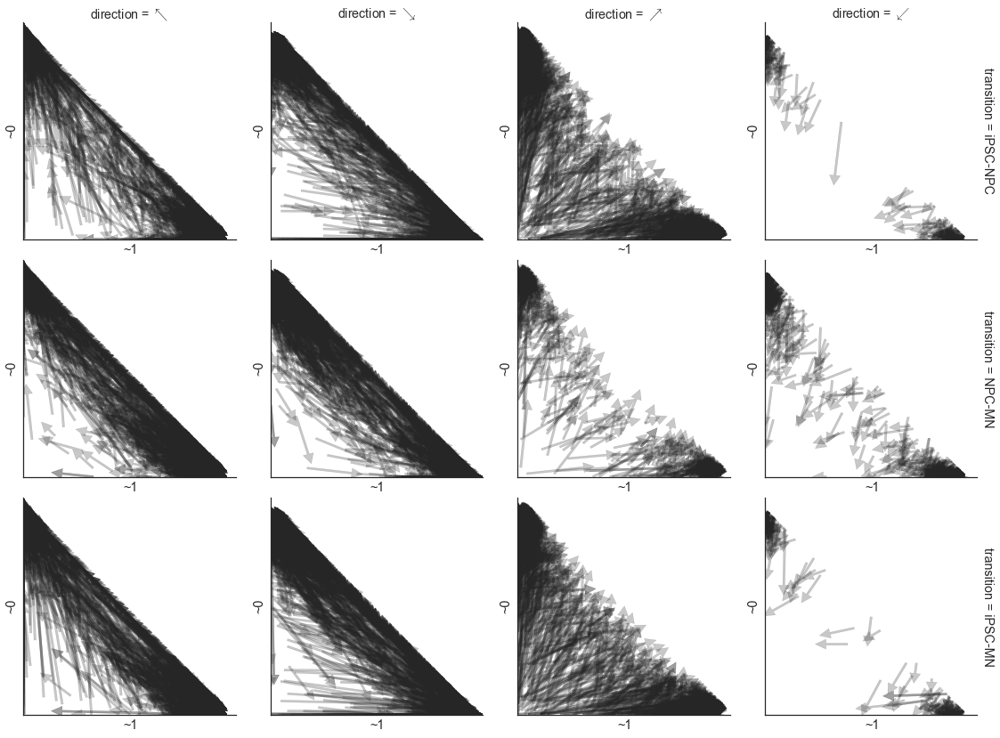

In [280]:
g = sns.FacetGrid(study.supplemental.voyages, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', color='#262626')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_all.png'.format(folder))

In [281]:
g = sns.FacetGrid(voyages_change_modality, col='direction', row='transition', size=4, margin_titles=True)
g.map_dataframe(plot_nmf_positions, 'event_name', '#262626')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_voyages_change_modality.png'.format(folder))

NameError: name 'voyages_change_modality' is not defined

### Where do the ambiguous events go?

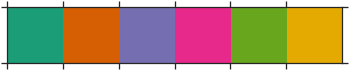

In [112]:
sns.palplot(sns.color_palette('Dark2'))

In [113]:
dark2 = sns.color_palette('Dark2')

In [114]:
palette = [dark2[0], dark2[2]]

In [116]:
range(3)

[0, 1, 2]

In [163]:
bimodal = study.supplemental.modalities_tidy.loc[study.supplemental.modalities_tidy.modality == 'bimodal']
bimodal = bimodal.join(study.splicing.feature_data, on='event_name')
bimodal_tfs = bimodal.loc[bimodal.gerstberger2014_tf]
bimodal_tfs.head()

,event_name,phenotype,modality,chrom,intron_start,intron_stop,strand,intron_motif,annotated,gencode_id,...,gerstberger2014_rbp_target_ncrna,gerstberger2014_rbp_target_ribosome,gerstberger2014_rbp_target_trna,gerstberger2014_tf,rbp,ribosomal,ribosomal_subunit,synapse,transcription_factor,intron_length
1251,chr10:38305944-38306218:+|3p,MN,bimodal,chr10,38305944,38306218,+,GT/AG,True,ENSG00000189180.11,...,False,False,False,True,False,False,False,False,True,274
1252,chr10:38305944-38306218:+|3p,NPC,bimodal,chr10,38305944,38306218,+,GT/AG,True,ENSG00000189180.11,...,False,False,False,True,False,False,False,False,True,274
1253,chr10:38305944-38306218:+|3p,iPSC,bimodal,chr10,38305944,38306218,+,GT/AG,True,ENSG00000189180.11,...,False,False,False,True,False,False,False,False,True,274
1254,chr10:38305944-38306218:+|5p,MN,bimodal,chr10,38305944,38306218,+,GT/AG,True,ENSG00000189180.11,...,False,False,False,True,False,False,False,False,True,274
1255,chr10:38305944-38306218:+|5p,NPC,bimodal,chr10,38305944,38306218,+,GT/AG,True,ENSG00000189180.11,...,False,False,False,True,False,False,False,False,True,274


In [166]:
bimodal_tfs.to_csv('{}/bimodal_tfs_junctions.csv'.format(folder), index=False)

In [170]:
bimodal_tf_events = bimodal_tfs.event_name.unique()
bimodal_tf_events.shape

(284,)

In [126]:
bimodal_tfs = bimodal_tfs[['event_name', 'gene_name']].drop_duplicates().sort('gene_name')
bimodal_tfs

,event_name,gene_name
33325,chr2:175983098-175986171:-|3p,ATF2
33328,chr2:175983098-175986171:-|5p,ATF2
33331,chr2:175983098-175994865:-|3p,ATF2
33334,chr2:175983098-175994865:-|5p,ATF2
33336,chr2:175986269-175994865:-|3p,ATF2
33340,chr2:175986269-175994865:-|5p,ATF2
33344,chr2:175994936-176001139:-|3p,ATF2
33347,chr2:175994936-176001139:-|5p,ATF2
33350,chr2:176001215-176015787:-|3p,ATF2
33353,chr2:176001215-176015787:-|5p,ATF2


In [150]:
gene_name = 'SMARCE1,KRT222'

In [174]:
study.splicing.maybe_renamed_to_feature_id('SNAP25')

ValueError: splicing is not a valid feature identifier for "SNAP25" data (it may not have been measured in this dataset!)

In [151]:
bimodal_tfs.loc[bimodal_tfs.gene_name == gene_name]

,event_name,gene_name
17384,chr17:38785246-38786459:-|3p,"SMARCE1,KRT222"
17399,chr17:38786539-38786965:-|5p,"SMARCE1,KRT222"
17406,chr17:38793825-38798706:-|3p,"SMARCE1,KRT222"
17409,chr17:38793825-38798706:-|5p,"SMARCE1,KRT222"
17412,chr17:38793825-38801827:-|3p,"SMARCE1,KRT222"
17415,chr17:38793825-38801827:-|5p,"SMARCE1,KRT222"
17424,chr17:38798812-38801827:-|3p,"SMARCE1,KRT222"
17427,chr17:38798812-38801827:-|5p,"SMARCE1,KRT222"


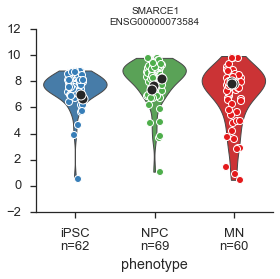

In [154]:
study.plot_gene('SMARCE1', sample_subset='~outlier')

In [ ]:
for i, row in bimodal_tfs.iterrows():
    study.plot_event(row.event_name, sample_subset='~outlier')
    fig = plt.gcf()
    fig.savefig('{}/bimodal_tfs_{}_{}.pdf'.format(folder, row.gene_name.lower(), row.event_name))

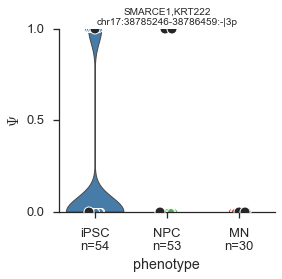

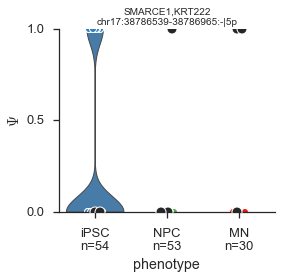

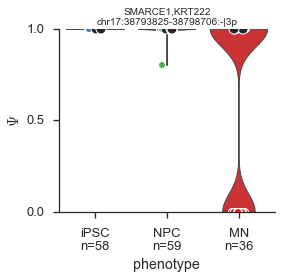

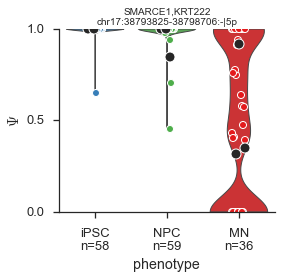

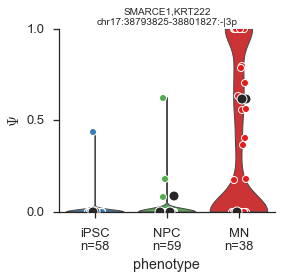

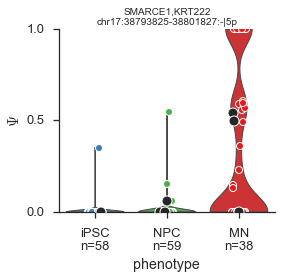

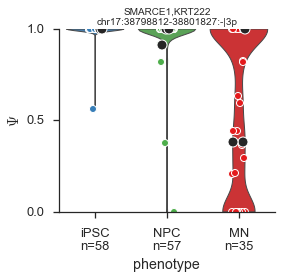

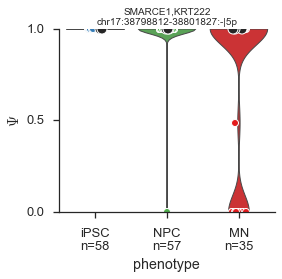

In [152]:


for event in bimodal_tfs.loc[bimodal_tfs.gene_name == gene_name].event_name:
    study.plot_event(event, sample_subset='~outlier')
    fig = plt.gcf()
    fig.savefig('{}/bimodal_tfs_{}_{}.pdf'.format(folder, gene_name.lower(), event))

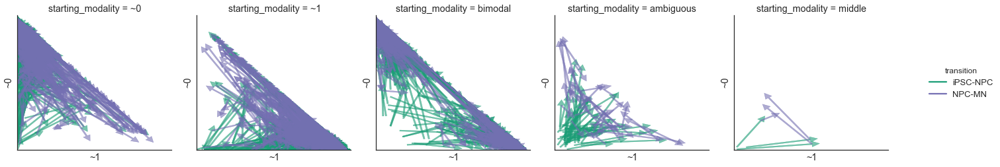

In [115]:
g = sns.FacetGrid(voyages_change_modality, col='starting_modality', hue='transition', 
                  size=4, margin_titles=True, palette=palette)
g.map_dataframe(plot_nmf_positions, 'event_name')
xmax = nmf_space_postions.pc_1.max() * 1.05
ymax = nmf_space_postions.pc_2.max() * 1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.add_legend()
g.savefig('{}/transition_arrows_voyages_starting_modality.pdf'.format(folder))

In [125]:
print study.supplemental.voyages.shape
voyages_different_modalities = study.supplemental.voyages.ix[
    ~study.supplemental.voyages.event_name.isin(same_modality_all_celltypes.event_name.unique())]
print voyages_different_modalities.shape
voyages_different_modalities.head()

(133110, 6)
(71712, 6)


,event_name,slope,transition,distance,direction,arrows
0,chr10:101163392-101163480:-|5p,-1.223407,iPSC-NPC,0.002925,~0,$\nwarrow$
1,chr10:101163392-101165512:-|3p,-0.000972,iPSC-NPC,0.001794,~1,$\searrow$
2,chr10:101163392-101165512:-|5p,-1.216189,iPSC-NPC,0.002827,~1,$\searrow$
3,chr10:101163632-101165512:-|3p,-586.276873,iPSC-NPC,0.002262,~0,$\nwarrow$
4,chr10:101166007-101166482:-|3p,-1.223501,iPSC-NPC,0.002748,~0,$\nwarrow$


In [101]:
from modish.visualize import MODALITY_COLORS, MODALITY_ORDER
modality_order = MODALITY_ORDER
modality_colors = MODALITY_COLORS

g = sns.factorplot(x='transition', hue='direction', data=voyages_different_modalities, kind='count', 
                   hue_order=modality_order[:-1],
              palette=modality_colors, linewidth=1, edgecolor='white', x_order=['iPSC-NPC', 'NPC-MN'])
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
g.savefig('{}/voyage_directions_count_barplot_different_modalities.pdf'.format(folder))

NameError: name 'voyages_different_modalities' is not defined

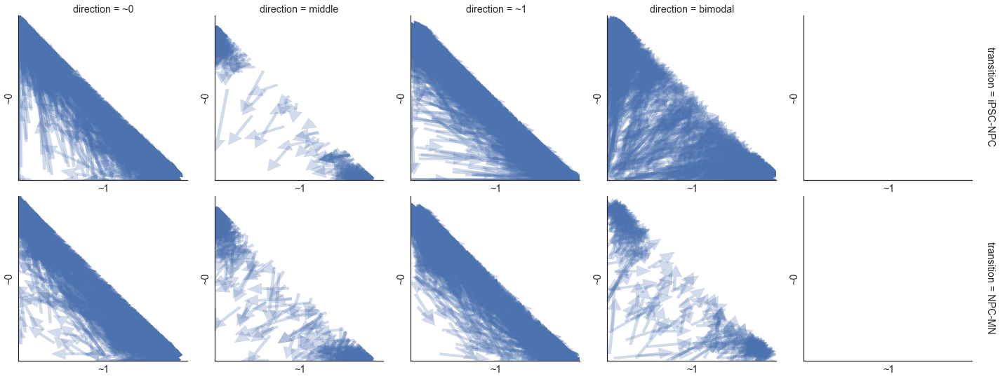

In [127]:
g = sns.FacetGrid(voyages_different_modalities, col='direction', row='transition', size=4, margin_titles=True,
                 col_order=modality_order[:-1])
g.map_dataframe(plot_nmf_positions, 'event_name')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.savefig('{}/transition_arrows_different_modalities.pdf'.format(folder))

In [128]:
print voyage_data.shape
voyage_data = voyage_data.dropna()
print voyage_data.shape

(133110, 6)
(74528, 6)


In [129]:
from flotilla.visualize.gene_ontology import plot_go_enrichment

In [130]:
study.supplemental.voyages = voyage_data

Wrote datapackage to /home/obotvinnik/flotilla_projects/singlecell_pnm_figure5/datapackage.json


## Restart here

In [24]:
import modish
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

sns.set(style='ticks', context='talk', rc={'font.sans-serif':'Arial', 'pdf.fonttype': 42})

%matplotlib inline

%load_ext autoreload
%autoreload 2

folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages'

import flotilla
# study = flotilla.embark('singlecell_pnm_figure2_modalities')
study = flotilla.embark('singlecell_pnm_figure5')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
2015-08-17 12:17:52	Reading datapackage from /home/obotvinnik/flotilla_projects/singlecell_pnm_figure5/datapackage.json
2015-08-17 12:17:52	Parsing datapackage to create a Study object
2015-08-17 12:20:27	Initializing Study
2015-08-17 12:20:27	Initializing Predictor configuration manager for Study
2015-08-17 12:20:27	Predictor ExtraTreesClassifier is of type <class 'sklearn.ensemble.forest.ExtraTreesClassifier'>
2015-08-17 12:20:27	Added ExtraTreesClassifier to default predictors
2015-08-17 12:20:27	Predictor ExtraTreesRegressor is of type <class 'sklearn.ensemble.forest.ExtraTreesRegressor'>
2015-08-17 12:20:27	Added ExtraTreesRegressor to default predictors
2015-08-17 12:20:27	Predictor GradientBoostingClassifier is of type <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>
2015-08-17 12:20:27	Added GradientBoostingClassifier to default predictors
2015-08-17 12:20:27	Predictor

In [39]:
voyages_event_index = study.supplemental.voyages.set_index(['event_name', 'transition'])
voyages_event_index = voyages_event_index.sort_index()
voyages_event_index.head()

,,slope,distance,direction,arrows
event_name,transition,,,,
chr10:101163392-101163480:-|5p,iPSC-NPC,-1.223407,0.002925,~0,$\nwarrow$
chr10:101163392-101165512:-|3p,iPSC-NPC,-0.000972,0.001794,~1,$\searrow$
chr10:101163392-101165512:-|5p,iPSC-NPC,-1.216189,0.002827,~1,$\searrow$
chr10:101163632-101165512:-|3p,iPSC-NPC,-586.276873,0.002262,~0,$\nwarrow$
chr10:101166007-101166482:-|3p,iPSC-NPC,-1.223501,0.002748,~0,$\nwarrow$


In [40]:
voyages_different_direction = voyages_event_index.groupby(level=0, axis=0).filter(
    lambda x: (len(x.direction.unique()) == 2) and x.shape[0] == 2)
print voyages_different_direction.shape
voyages_different_direction.head()

(29588, 4)


slope  distance direction  \
event_name                     transition                                 
chr10:101474476-101476104:-|3p NPC-MN     -4.852680  0.012999        ~0   
                               iPSC-NPC    2.113689  0.005099    middle   
chr10:101476219-101478102:-|3p NPC-MN     -1.221955  0.009485        ~0   
                               iPSC-NPC   -1.222267  0.013608        ~1   
chr10:101476219-101478102:-|5p NPC-MN     -1.221955  0.009485        ~0   

                                               arrows  
event_name                     transition              
chr10:101474476-101476104:-|3p NPC-MN      $\nwarrow$  
                               iPSC-NPC    $\swarrow$  
chr10:101476219-101478102:-|3p NPC-MN      $\nwarrow$  
                               iPSC-NPC    $\searrow$  
chr10:101476219-101478102:-|5p NPC-MN      $\nwarrow$

In [41]:
voyages_different_direction_tidy = voyages_different_direction.reset_index()
print voyages_different_direction_tidy.event_name.unique().shape
voyages_different_direction_tidy.head()

(14794,)


,event_name,transition,slope,distance,direction,arrows
0,chr10:101474476-101476104:-|3p,NPC-MN,-4.852680,0.012999,~0,$\nwarrow$
1,chr10:101474476-101476104:-|3p,iPSC-NPC,2.113689,0.005099,middle,$\swarrow$
2,chr10:101476219-101478102:-|3p,NPC-MN,-1.221955,0.009485,~0,$\nwarrow$
3,chr10:101476219-101478102:-|3p,iPSC-NPC,-1.222267,0.013608,~1,$\searrow$
4,chr10:101476219-101478102:-|5p,NPC-MN,-1.221955,0.009485,~0,$\nwarrow$


In [99]:
from modish.visualize import MODALITY_COLORS, MODALITY_ORDER
modality_order = MODALITY_ORDER
modality_colors = MODALITY_COLORS

In [100]:
g = sns.factorplot(x='transition', hue='direction', data=voyages_different_direction_tidy, kind='count', 
                   hue_order=modality_order[:-1],
              palette=modality_colors, linewidth=1, edgecolor='white', x_order=['iPSC-NPC', 'NPC-MN'])
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
g.savefig('{}/voyage_directions_count_barplot_different_modalities_different_direction.pdf'.format(folder))

NameError: name 'voyages_different_direction_tidy' is not defined

In [97]:
dark2 = sns.color_palette('Dark2')
transition_palette = [dark2[0], dark2[2]]
transition_order = ['iPSC-NPC', 'NPC-MN']

g = sns.FacetGrid(voyages_different_direction_tidy, col='direction', hue='transition', size=4, margin_titles=True,
                 col_order=modality_order[:-1], palette=transition_palette, hue_order=transition_order)
g.map_dataframe(plot_nmf_positions, 'event_name')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.add_legend()
g.savefig('{}/transition_arrows_different_modalities_different_direction.pdf'.format(folder))

NameError: name 'voyages_different_direction_tidy' is not defined

In [ ]:
# voyages_different_direction_tidy_big = voyages_different_direction_tidy.ix[
#     voyages_different_direction_tidy.distance > voyages_different_direction_tidy.distance.mean()]
# print voyages_different_direction_tidy_big.event_name.unique().shape
# # non-outlier single cells and pooled
# sample_ids = psi_filtered.index.tolist() + study.splicing.pooled.index.tolist()

# for (event,  df) in voyages_different_direction_tidy_big.groupby(['event_name']):
#     gene_name = study.splicing.feature_data.gene_name[event]
#     print gene_name, event

#     fig, axes = plt.subplots(figsize=(8, 4), ncols=2)    
#     study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
#                                sample_ids=sample_ids,
#                               phenotype_order=study.phenotype_order, ax=axes[0], color=study.phenotype_color_ordered,
#                               bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
#     flotilla.visualize.splicing.nmf_space_transitions(nmf_space_postions, event, study.phenotype_to_color,
#                                                      study.phenotype_to_marker, study.phenotype_order, ax=axes[1],
#                                                      xlabel='~1', ylabel='~0')
#     sns.despine()
#     fig.tight_layout()
#     fig.savefig('{}/voyages_different_direction_{}_{}.pdf'.format(folder, gene_name, event))


(10814, 4)


slope  distance direction  \
event_name                     transition                                 
chr10:101473237-101476104:-|3p NPC-MN     -0.004835  0.002609        ~1   
                               iPSC-NPC   -1.449634  0.007119        ~1   
chr10:101473237-101476104:-|5p NPC-MN     -1.221955  0.004124        ~1   
                               iPSC-NPC   -1.221955  0.009312        ~1   
chr10:101474476-101476104:-|5p NPC-MN     -1.221955  0.004124        ~0   

                                               arrows  
event_name                     transition              
chr10:101473237-101476104:-|3p NPC-MN      $\searrow$  
                               iPSC-NPC    $\searrow$  
chr10:101473237-101476104:-|5p NPC-MN      $\searrow$  
                               iPSC-NPC    $\searrow$  
chr10:101474476-101476104:-|5p NPC-MN      $\nwarrow$

In [ ]:
voyages_same_direction_tidy = voyages_same_direction.reset_index()
voyages_same_direction_tidy.head()

In [ ]:
voyages_same_direction_tidy.event_name.unique().shape

In [ ]:
range(3)

In [ ]:
voyages_big = study.supplemental.voyages.ix[study.supplemental.voyages.distance > study.supplemental.voyages.distance.mean()]
print voyages_big.event_name.unique().shape

In [ ]:
psi_subset = psi_filtered.ix[:, voyages_big.event_name.unique()]
mask = psi_subset.isnull()
psi_subset = psi_subset.fillna(0.5)
row_colors = study.sample_id_to_color[psi_subset.index]

g = sns.clustermap(psi_subset, mask=mask, metric='euclidean', cmap='RdYlBu_r', center=0.5, 
                   cbar_kws=dict(label='$\Psi$'), method='ward', row_colors=row_colors)
g.ax_heatmap.set(xticks=[], yticks=[], xlabel='Voyaging splicing events', ylabel='Single cells')

In [ ]:
voyages_same_direction_tidy.groupby(['direction']).apply(lambda x: len(x.event_name.unique()))

In [ ]:
modality_order = ['~0', 'middle', '~1', 'bimodal', 'ambiguous']
modality_colors = dict(zip(modality_order, sns.color_palette('deep')))

g = sns.factorplot(x='transition', hue='direction', data=voyages_same_direction_tidy, kind='count', 
                   hue_order=modality_order[:-1],
              palette=modality_colors, linewidth=1, edgecolor='white', x_order=['iPSC-NPC', 'NPC-MN'])
for ax in g.axes.flat:
    ax.locator_params('y', nbins=5)
g.savefig('{}/voyage_directions_count_barplot_different_modalities_same_direction.pdf'.format(folder))

In [ ]:
dark2 = sns.color_palette('Dark2')
transition_palette = [dark2[0], dark2[2]]
transition_order = ['iPSC-NPC', 'NPC-MN']

g = sns.FacetGrid(voyages_same_direction_tidy, col='direction', hue='transition', size=4, margin_titles=True,
                 col_order=modality_order[:-1], palette=transition_palette, hue_order=transition_order)
g.map_dataframe(plot_nmf_positions, 'event_name')
xmax = nmf_space_postions.pc_1.max()*1.05
ymax = nmf_space_postions.pc_2.max()*1.05
g.set(xlim=(0, xmax), ylim=(0, ymax), xlabel='~1', ylabel='~0', xticks=[], yticks=[])
g.add_legend()
g.savefig('{}/transition_arrows_different_modalities_same_direction.pdf'.format(folder))

In [ ]:
# events = voyages_same_direction_tidy.ix[voyages_same_direction_tidy.direction == 'bimodal'].event_name.unique()
# psi_grouped = psi_filtered.groupby(study.sample_id_to_phenotype)

In [ ]:
plot_go_enrichment??

In [ ]:
import itertools

def event_names_to_gene_ids(event_names):
    return list(itertools.chain(*study.splicing.feature_data.ensembl_gene[event_names].str.split(',').values))

background = event_names_to_gene_ids(voyages_same_direction_tidy.event_name.unique())

for group1, df1 in voyages_same_direction_tidy.groupby(['direction']):
    print group1, df1.event_name.unique().shape
    foreground = event_names_to_gene_ids(df1.event_name.unique())
#     for group2, df2 in df1.groupby('direction'):
    go = study.go_enrichment(foreground, background, p_value_cutoff=1)
    if go.empty:
        print '... empty GO enrichment!'
        continue
    ax = plot_go_enrichment(go)
    ax.set_title('{} {}'.format(group1, group1))
    ax.set_xlabel('Bonferonni corrected $-\log_{10}\,p\mathrm{-value}$')
    fig = plt.gcf()
    fig.tight_layout()
    fig.savefig('{}/transition_direction_go_enrichment_{}_both_transitions.pdf'.format(folder, group2))

In [20]:
flotilla.visualize.splicing.nmf_space_transitions?

In [21]:
voyages_same_direction_tidy_big = voyages_same_direction_tidy.ix[voyages_same_direction_tidy.distance > voyages_same_direction_tidy.distance.mean()]
svoyages_same_direction_tidy_big.event_name.unique().shape

NameError: name 'voyages_same_direction_tidy' is not defined

In [ ]:
psi_subset = psi_filtered.ix[:, voyages_same_direction_tidy_big.event_name.unique()]
mask = psi_subset.isnull()
psi_subset = psi_subset.fillna(0.5)
row_colors = study.sample_id_to_color[psi_subset.index]

g = sns.clustermap(psi_subset, mask=mask, metric='euclidean', cmap='RdYlBu_r', center=0.5, 
                   cbar_kws=dict(label='$\Psi$'), method='ward', row_colors=row_colors)
g.ax_heatmap.set(xticks=[], yticks=[], xlabel='Voyaging splicing events', ylabel='Single cells')

In [ ]:

hnrnpc_event = study.splicing.maybe_renamed_to_feature_id('HNRNPC')[-6]
voyage_data.ix[voyage_data.event_name == hnrnpc_event]

In [ ]:

event = hnrnpc_event
gene_name = 'HNRNPC'
fig, axes = plt.subplots(figsize=(8, 4), ncols=2)    
study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
                           sample_ids=sample_ids,
                          phenotype_order=study.phenotype_order, ax=axes[0], color=study.phenotype_color_ordered,
                          bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
flotilla.visualize.splicing.nmf_space_transitions(nmf_space_postions, event, study.phenotype_to_color,
                                                 study.phenotype_to_marker, study.phenotype_order, ax=axes[1],
                                                 xlabel='~1', ylabel='~0')
sns.despine()
fig.tight_layout()
fig.savefig('{}/voyages_different_direction_{}_{}_{}.pdf'.format(folder, direction, gene_name, event))

In [ ]:

# non-outlier single cells and pooled
sample_ids = psi_filtered.index.tolist() + study.splicing.pooled.index.tolist()

for ((event, direction), df) in voyages_same_direction_tidy_big.groupby(['event_name', 'direction']):
    gene_name = study.splicing.feature_data.gene_name[event]
    print gene_name, event

    fig, axes = plt.subplots(figsize=(8, 4), ncols=2)    
    study.splicing._violinplot(event, phenotype_groupby=study.sample_id_to_phenotype,
                               sample_ids=sample_ids,
                              phenotype_order=study.phenotype_order, ax=axes[0], color=study.phenotype_color_ordered,
                              bw=0.2, ylim=(0, 1), yticks=(0, 0.5, 1), ylabel='$\Psi$')
    flotilla.visualize.splicing.nmf_space_transitions(nmf_space_postions, event, study.phenotype_to_color,
                                                     study.phenotype_to_marker, study.phenotype_order, ax=axes[1],
                                                     xlabel='~1', ylabel='~0')
    sns.despine()
    fig.tight_layout()
    fig.savefig('{}/voyages_same_direction_{}_{}_{}.pdf'.format(folder, direction, gene_name, event))


### Make bed files for each transition and direction
#### Exon bodies

In [69]:
%%time 
import pybedtools

DIR = '/projects/ps-yeolab/obotvinnik/miso_helpers/hg19'
alt_exons = pybedtools.BedTool('{}/se_mxe_alt_exon.bed'.format(DIR))

for (transition, direction), df in study.supplemental.voyages.groupby(['transition', 'direction']):
    event_names = set(df.event_name.values)
    bed = alt_exons.filter(lambda x: x.name in event_names)
    filename = '{}/se_mxe_alt_exon_body_{}_{}.bed'.format(folder, transition, direction)
    bed.saveas(filename)

CPU times: user 1.99 s, sys: 29 ms, total: 2.02 s
Wall time: 2.53 s


#### Upstream/downstream

In [70]:
%%time
import os

nt = 400

upstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_upstream400.bed'.format(DIR))
downstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_downstream400.bed'.format(DIR))

flanking_regions = {'upstream400': upstream400,
                   'downstream400': downstream400}

for (transition, direction), df in study.supplemental.voyages.groupby(['transition', 'direction']):
    event_names = set(df.event_name)
    for region, bed in flanking_regions.iteritems():
        bed = bed.filter(lambda x: x.name in event_names)
        filename = '{}/se_mxe_alt_exon_{}_{}_{}.bed'.format(folder, region, transition, direction)
        bed.saveas(filename)
        ! wc -l $filename

427 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_bimodal.bed
427 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal.bed
316 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_middle.bed
316 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_middle.bed
1533 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_~0.bed
1533 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_~0.bed
1224 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_~1.bed
1224 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_~1.bed
816 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_bimodal.bed


### Make background bed files for vs alternative events

#### Exon bodies

In [71]:
%%time 
import pybedtools

DIR = '/projects/ps-yeolab/obotvinnik/miso_helpers/hg19'
alt_exons = pybedtools.BedTool('{}/se_mxe_alt_exon.bed'.format(DIR))

for (transition, direction), df in study.supplemental.voyages.groupby(['transition', 'direction']):
    event_names = set(df.event_name.values)
    bed = alt_exons.filter(lambda x: x.name not in event_names)
    filename = '{}/se_mxe_alt_exon_body_{}_{}_background.bed'.format(folder, transition, direction)
    bed.saveas(filename)

CPU times: user 8.31 s, sys: 71 ms, total: 8.39 s
Wall time: 9.22 s


#### Upstream/Downstream

In [72]:

%%time
import os

nt = 400

upstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_upstream400.bed'.format(DIR))
downstream400 = pybedtools.BedTool('{}/se_mxe_alt_exon_downstream400.bed'.format(DIR))

flanking_regions = {'upstream400': upstream400,
                   'downstream400': downstream400}

for (transition, direction), df in study.supplemental.voyages.groupby(['transition', 'direction']):
    event_names = set(df.event_name)
    for region, bed in flanking_regions.iteritems():
        bed = bed.filter(lambda x: x.name in event_names)
        filename = '{}/se_mxe_alt_exon_{}_{}_{}.bed'.format(folder, region, transition, direction)
        bed.saveas(filename)
        ! wc -l $filename

427 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_bimodal.bed
427 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal.bed
316 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_middle.bed
316 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_middle.bed
1533 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_~0.bed
1533 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_~0.bed
1224 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_~1.bed
1224 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_~1.bed
816 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_bimodal.bed


### Get primate/placental mammal conserved regions of the exons and upstream/downstream

In [73]:
import os
from glob import iglob

clades = ('Placental', 'Primates')
conserved_template = r'/projects/ps-yeolab/genomes/hg19/database/phastConsElements46way{}.bed'

commands = []

directions = ('upstream', 'downstream')

for bedfile in iglob('{}/se_mxe_alt_exon_*.bed'.format(folder)):
    if 'placental' in bedfile or 'primates' in bedfile:
        continue
    for clade in clades:
        conserved_bed = conserved_template.format(clade)
        outbed = bedfile.replace('.bed', '_{}.bed'.format(clade.lower()))
        print outbed
        if not os.path.exists(outbed):
            ! bedtools intersect -a $bedfile -b $conserved_bed > $outbed

/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_body_NPC-MN_middle_background_placental.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_body_NPC-MN_middle_background_primates.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_bimodal_placental.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_bimodal_primates.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_middle_placental.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_NPC-MN_middle_primates.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_body_iPSC-NPC_~1_background_placental.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_body_iPSC-NPC_~1_background_primates.bed
/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figur

## HOMER enrichment 

### vs constitutive exons

In [277]:
from gscripts.qtools import Submitter


constitutive_prefix = r'/projects/ps-yeolab/genomes/hg19/gencode/v19/gencode.v19.annotation.constitutive.exons.not.in.miso'
constitutive_bed = constitutive_prefix + '.bed'

constitutive_bed_template = constitutive_prefix + r'.{}.bed'

n_processors = 4
# Search for short motifs, lenghts 4,5,6,7,8,9,10 with up to 1 mismatch
homer_flags = '-rna -len 4,5,6,7 -mset vertebrates -mis 1 -p {}'.format(n_processors)
findMotifsGenome = '/home/yeo-lab/software/homer/bin/findMotifsGenome.pl'

commands = []
for bedfile in iglob('{}/*.bed'.format(folder)):
    out_dir = bedfile.replace('.bed', '_vs_constitutive_motifs')
    if 'primates' in bedfile or 'placental' in bedfile:
        clade = 'primates' if 'primates' in bedfile else 'placental'
        background = constitutive_bed_template.format(clade)
    else:
        background = constitutive_bed
    command = '{} {} hg19 {} -bg {} {}'.format(
        findMotifsGenome, bedfile, out_dir, background, homer_flags)
    print '\n', command
    commands.append(command)
sub = Submitter(commands, 'homer_voyages', walltime='1:00:00', queue='home-scrm',
               ppn=n_processors, write_and_submit=True, array=True)

running 72 tasks as an array-job.
job ID: 3055432



/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal_placental.bed hg19 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal_placental_vs_constitutive_motifs -bg /projects/ps-yeolab/genomes/hg19/gencode/v19/gencode.v19.annotation.constitutive.exons.not.in.miso.placental.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_middle_primates.bed hg19 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_middle_primates_vs_constitutive_motifs -bg /projects/ps-yeolab/genomes/hg19/gencode/v19/gencode.v19.annotation.constitutive.exons.not.in.miso.primates.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bin/findM

### vs other alternative exons

In [74]:
from gscripts.qtools import Submitter
from glob import iglob
import os


findMotifsGenome = '/home/yeo-lab/software/homer/bin/findMotifsGenome.pl'
n_processors = 4
homer_flags = '-rna -len 4,5,6,7 -mset vertebrates -mis 1 -p {}'.format(n_processors)

commands = []

clades = ('Placental', 'Primates')

clades_lower = [x.lower() for x in clades]

# for clade in clades:
for bedfile in iglob('{}/se_mxe_alt_exon_*.bed'.format(folder)):
    if 'background' in bedfile:
        continue
    upstream = 'upstream' in bedfile
    region = 'upstream' if upstream else 'downstream'
    
    # Check if this filename has a clade in it
    if any(bedfile.find(x) >= 0 for x in clades_lower):
        basename = os.path.basename(bedfile)
        basename_split = basename.split('.bed')[0].split('_')
        background_basename = '_'.join(['_'.join(basename_split[:-1]), 'background', basename_split[-1]]) + '.bed'
        background = os.path.join(os.path.dirname(bedfile), background_basename)
    else:
        background = bedfile.replace('.bed', '_background.bed')
    out_dir = bedfile.replace('.bed', '_vs_alternative_motifs')
    command = '{} {} hg19 {} -bg {} {}'.format(
        findMotifsGenome, bedfile, out_dir, background, homer_flags)
    print '\n', command
    commands.append(command)
#     ! $command
sub = Submitter(commands, 'homer_voyages_vs_alternative', walltime='0:30:00', queue='home-scrm',
               ppn=n_processors, write_and_submit=True, array=True)

running 72 tasks as an array-job.
job ID: 3060298



/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal_placental.bed hg19 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal_placental_vs_alternative_motifs -bg /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_downstream400_NPC-MN_bimodal_background_placental.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home/yeo-lab/software/homer/bin/findMotifsGenome.pl /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_middle_primates.bed hg19 /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_middle_primates_vs_alternative_motifs -bg /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure5_nmf/se_mxe_alt_exon_upstream400_iPSC-NPC_middle_background_primates.bed -rna -len 4,5,6,7 -mset vertebrates -mis 1 -p 4

/home

## Add stressed data

In [99]:
csv_folder = '/home/obotvinnik/projects/singlecell_pnms/analysis/csvs_for_paper'


In [102]:
!ls -lha $csv_folder

total 3.5G
drwxr-xr-x  2 obotvinnik yeo-group 4.0K Aug 17 16:56 .
drwxr-xr-x 20 obotvinnik yeo-group  12K Aug 17 11:43 ..
-rw-r--r--  1 obotvinnik yeo-group  41M Aug 19 17:13 expression.csv
-rw-r--r--  1 obotvinnik yeo-group 7.2M Aug 19 17:12 expression_stressed.csv
-rw-r--r--  1 obotvinnik yeo-group  63K Aug 19 17:13 mapping_stats.csv
-rw-r--r--  1 obotvinnik yeo-group  12K Aug 19 17:12 mapping_stats_stressed.csv
-rw-r--r--  1 obotvinnik yeo-group  11K Aug 19 17:13 metadata.csv
-rw-r--r--  1 obotvinnik yeo-group 1.9K Aug 19 17:12 metadata_stressed.csv
-rw-r--r--  1 obotvinnik yeo-group  74M Aug 19 17:20 psi3.csv
-rw-r--r--  1 obotvinnik yeo-group  23M Aug 13 14:38 psi3_stressed.csv
-rw-r--r--  1 obotvinnik yeo-group  74M Aug 19 17:19 psi5.csv
-rw-r--r--  1 obotvinnik yeo-group 147M Aug 19 17:23 psi5_psi3_combined.csv
-rw-r--r--  1 obotvinnik yeo-group 1.9G Aug 14 09:10 psi5_psi3_combined.hdf
-rw-r--r--  1 obotvinnik yeo-group 187M Aug 14 10:10 psi5_psi3_combined_metadata.csv
-rw-r--r-

In [3]:

metadata_stressed = pd.read_csv('{}/metadata_stressed.csv'.format(folder), index_col=0)
expression_stressed = pd.read_csv('{}/expression_stressed.csv'.format(folder), index_col=0)
splicing_stressed = pd.read_csv('{}/splicing_stressed.csv'.format(folder), index_col=0)
mapping_stats_stressed = pd.read_csv('{}/mapping_stats_stressed.csv'.format(folder), index_col=0)

In [4]:
study.expression.data_original = study.expression.data_original.append(expression_stressed)
study.expression.data_original.tail()

,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSGR0000214717,ENSGR0000223511,ENSGR0000223571,ENSGR0000226179,ENSGR0000230542,ENSGR0000234622,ENSGR0000236017,ENSGR0000236871,ENSGR0000237531,ENSGR0000270726
MSA_33,0.000000,0,0.00000,2.596920,0.000000,0,0,0.000000,0.0000,0.000000,...,0.470380,2.901160,0.000000,5.83425,0.810006,0,0.198004,1.716120,0,0.000000
MSA_34,0.957754,0,35.84043,64.226000,1.383395,0,0,0.362916,557.5345,0.000000,...,0.000000,0.502323,0.563255,1.07633,0.299708,0,0.102838,1.233540,0,0.000000
MSA_35,0.320094,0,0.00000,0.000000,4.347147,0,0,0.066756,0.0000,732.651930,...,0.000000,1.623860,0.000000,0.00000,0.319702,0,0.000000,1.715460,0,0.129496
MSA_36,51.927200,0,166.21465,0.473831,0.000000,0,0,0.058456,0.0000,0.110422,...,0.823414,0.398732,0.000000,1.21571,0.488904,0,0.000000,0.000000,0,0.000000
MSA_37,0.776949,0,14.90850,90.265100,33.773600,0,0,108.816520,0.0000,0.000000,...,14.736100,0.247443,0.141180,2.51428,0.058312,0,0.297233,0.128582,0,0.000000


In [5]:
study.metadata.data_original = study.metadata.data_original.append(metadata_stressed)
study.metadata.data_original.tail()

,Notes,craig_venter,differentiation_batch,neuron,outlier,phenotype,pooled,progenitor,single,split,stressed
MSA_33,NaN,True,batch2,True,NaN,sMN,False,False,True,NaN,True
MSA_34,NaN,True,batch2,True,NaN,sMN,False,False,True,NaN,True
MSA_35,NaN,True,batch2,True,NaN,sMN,False,False,True,NaN,True
MSA_36,NaN,True,batch2,True,NaN,sMN,False,False,True,NaN,True
MSA_37,NaN,True,batch2,True,NaN,sMN,False,False,True,NaN,True


In [6]:
study.metadata.data_original.ix[study.metadata.data_original.stressed, 'outlier'] = False

In [7]:
study.splicing.data_original = study.splicing.data_original.append(splicing_stressed)
study.splicing.data_original.tail()

,chr10:100186972:100187021:-@chr10:100185575:100185742:-@chr10:100185298:100185477:-,chr10:100190328:100190427:-@chr10:100189548:100189646:-@chr10:100189330:100189399:-,chr10:100193697:100193848:-@chr10:100190888:100191048:-@chr10:100190328:100190427:-,chr10:100193740:100193848:-@chr10:100190888:100191048:-@chr10:100190328:100190427:-,chr10:100195392:100195529:-@chr10:100195029:100195171:-@chr10:100193740:100193848:-,chr10:101373453:101373681:-@chr10:101372300:101372356:-@chr10:101370642:101371215:-,chr10:101379802:101380221:-@chr10:101373453:101373681:-@chr10:101372300:101372356:-@chr10:101370642:101371215:-,chr10:101419619:101419721:+@chr10:101420057:101420239:+@chr10:101421203:101421385:+,chr10:101507014:101507147:+@chr10:101510126:101510153:+@chr10:101514286:101514391:+,chr10:101657843:101658042:-@chr10:101656024:101656154:-@chr10:101654703:101654807:-,...,chrY:2803518:2803810:+@chrY:2821950:2822038:+@chrY:2829115:2829687:+@chrY:2843136:2843285:+,chrY:2803518:2803810:+@chrY:2821950:2822038:+@chrY:2843136:2843285:+,chrY:2803518:2803810:+@chrY:2829115:2829687:+@chrY:2843136:2843285:+,chrY:2821950:2822038:+@chrY:2829115:2829687:+@chrY:2843136:2843285:+,chrY:2843552:2843695:+@chrY:2844711:2844863:+@chrY:2845981:2846121:+,chrY:4868267:4868646:+@chrY:4870729:4870799:+@chrY:4899947:4900052:+@chrY:4900711:4900769:+,chrY:4868267:4868646:+@chrY:4898940:4899108:+@chrY:4899947:4900052:+,chrY:59222127:59222216:+@chrY:59228292:59228349:+@chrY:59230782:59230919:+,chrY:59222127:59222281:+@chrY:59228292:59228349:+@chrY:59230782:59230919:+,chrY:59233167:59233257:+@chrY:59252483:59252550:+@chrY:59272371:59272463:+
MSA_33,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSA_34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSA_35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0.02,1,1,1,NaN,NaN,NaN,NaN,NaN
MSA_36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.96,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSA_37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.84,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
study.mapping_stats.data_original = study.mapping_stats.data_original.append(mapping_stats_stressed)
study.mapping_stats.data_original.tail()

,Started job on,Started mapping on,Finished on,"Mapping speed, Million of reads per hour",Number of input reads,Average input read length,UNIQUE READS,Uniquely mapped reads number,Uniquely mapped reads %,Average mapped length,...,% of reads mapped to too many loci,UNMAPPED READS,% of reads unmapped: too many mismatches,% of reads unmapped: too short,% of reads unmapped: other,% splices: Annotated (sjdb),% splices: GT/AG,% splices: GC/AG,% splices: AT/AC,% splices: Non-canonical
MSA_33,Feb 15 02:44:38,Feb 15 02:46:24,Feb 15 02:49:38,180.87,9746984,197,NaN,9052550,92.88,195.97,...,0.00,NaN,0,5.21,0.01,96.256609,98.803657,0.969490,0.101583,0.125270
MSA_34,Feb 15 03:07:22,Feb 15 03:08:49,Feb 15 03:11:41,176.43,8429238,197,NaN,7931056,94.09,195.83,...,0.06,NaN,0,3.70,0.02,97.394038,98.831345,0.900620,0.109529,0.158506
MSA_35,Feb 15 03:02:35,Feb 15 03:03:58,Feb 15 03:06:33,161.50,6953564,197,NaN,6058398,87.13,195.67,...,0.05,NaN,0,10.18,0.06,97.423253,99.161569,0.655678,0.079663,0.103090
MSA_36,Feb 19 00:51:27,Feb 19 00:53:12,Feb 19 00:54:59,160.45,4769002,197,NaN,4321714,90.62,195.72,...,0.03,NaN,0,7.38,0.01,97.944082,99.087936,0.731392,0.082789,0.097883
MSA_37,Feb 15 02:52:31,Feb 15 02:53:56,Feb 15 02:56:13,169.88,6464998,197,NaN,6079458,94.04,195.83,...,0.01,NaN,0,3.98,0.01,97.598432,99.109943,0.647602,0.101113,0.141341


In [9]:
study.metadata.phenotype_order = [u'iPSC', u'NPC', u'MN', 'sMN']


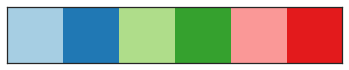

In [172]:
import matplotlib as mpl
%matplotlib inline
sns.palplot(sns.color_palette('Paired'))

In [173]:
paired = map(mpl.colors.rgb2hex, sns.color_palette("Paired"))
pink = paired[4]

In [174]:
study.metadata.phenotype_to_marker 

{u'MN': u's', u'NPC': u'^', u'iPSC': u'o'}

In [13]:
study.metadata.phenotype_to_color = {u'MN': u'#e41a1c', u'NPC': u'#4daf4a', u'iPSC': u'#377eb8',
                                    'sMN': pink}
study.metadata.phenotype_to_marker = {u'MN': u's', u'NPC': u'^', u'iPSC': u'o', 'sMN': '*'}
study.metadata.phenotype_order = ('iPSC', 'NPC', 'MN', 'sMN')

In [ ]:
study.save??

In [15]:
study.save('singlecell_pnms_post_kmeans_outliers')

Wrote datapackage to /home/obotvinnik/flotilla_projects/singlecell_pnms_post_kmeans_outliers/datapackage.json


In [65]:
stressed = flotilla.embark('singlecell_pnms_post_kmeans_outliers')
print stressed.phenotype_to_color
print stressed.phenotype_to_marker
print stressed.phenotype_color_ordered
print stressed.phenotype_order
print stressed.phenotype_transitions

2015-07-16 09:16:44	Reading datapackage from /home/obotvinnik/flotilla_projects/singlecell_pnms_post_kmeans_outliers/datapackage.json
2015-07-16 09:16:44	Parsing datapackage to create a Study object
2015-07-16 09:17:59	Initializing Study
2015-07-16 09:17:59	Initializing Predictor configuration manager for Study
2015-07-16 09:17:59	Predictor ExtraTreesClassifier is of type <class 'sklearn.ensemble.forest.ExtraTreesClassifier'>
2015-07-16 09:17:59	Added ExtraTreesClassifier to default predictors
2015-07-16 09:17:59	Predictor ExtraTreesRegressor is of type <class 'sklearn.ensemble.forest.ExtraTreesRegressor'>
2015-07-16 09:17:59	Added ExtraTreesRegressor to default predictors
2015-07-16 09:17:59	Predictor GradientBoostingClassifier is of type <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>
2015-07-16 09:17:59	Added GradientBoostingClassifier to default predictors
2015-07-16 09:17:59	Predictor GradientBoostingRegressor is of type <class 'sklearn.ensemble.gradient_bo

In [66]:
stressed.metadata.phenotype_order = ('iPSC', 'NPC', 'MN', 'sMN')
print stressed.phenotype_to_color
print stressed.phenotype_to_marker
print stressed.phenotype_color_ordered
print stressed.phenotype_order
print stressed.phenotype_transitions

{u'iPSC': u'#377eb8', u'MN': u'#e41a1c', u'NPC': u'#4daf4a', u'sMN': u'#994fa1'}
{u'iPSC': u'o', u'MN': u's', u'NPC': u'^', u'sMN': u'*'}
[u'#377eb8', u'#4daf4a', u'#e41a1c', u'#994fa1']
['iPSC', 'NPC', 'MN', 'sMN']
[('iPSC', 'NPC'), ('NPC', 'MN'), ('MN', 'sMN')]


In [ ]:
stressed.

/home/obotvinnik/anaconda/lib/python2.7/site-packages/pandas/core/index.py:687: FutureWarning: slice indexers when using iloc should be integers and not floating point
  "and not floating point",FutureWarning)


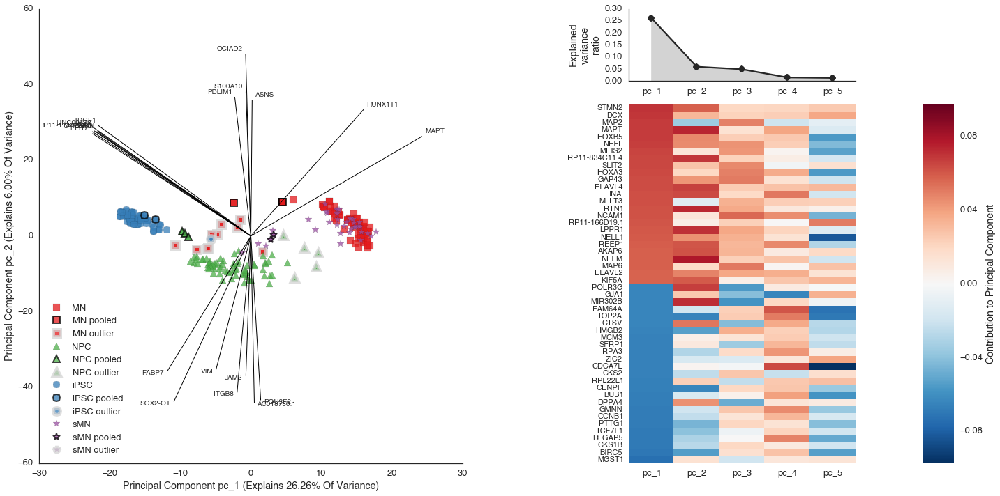

In [4]:
study.plot_pca(scale_by_variance=False)

In [5]:
print study.metadata.data.shape
print study.expression.data.shape
print study.splicing.data.shape
print study.mapping_stats.data.shape

(250, 11)
(250, 16691)
(250, 17150)
(250, 35)


In [6]:
# %time modalities_assignments = study.modality_assignments(min_samples=20)

In [7]:
# modalities_assignments.head()

NameError: name 'modalities_assignments' is not defined

In [ ]:

# modalities_tidy = modalities_assignments.stack().reset_index().rename(columns={'level_1': 'event_name', 0:'modality'})
# modalities_tidy.shape

In [ ]:
# modalities_tidy.head()

In [176]:
# modalities_tidy.to_csv('/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure2_splicing/modalities_tidy_stressed.csv', 
#                        index=False)

In [52]:
%time nmf_space_positions = study.nmf_space_positions()
nmf_space_positions_tidy = nmf_space_positions.reset_index().rename(columns={'level_0':'event_name'})
study.supplemental.nmf_space_positions_tidy = nmf_space_positions_tidy
%time nmf_space_transitions = study.nmf_space_transitions(n=20)
nmf_space_transitions_tidy = nmf_space_transitions.stack()
nmf_space_transitions_tidy = nmf_space_transitions_tidy.reset_index().rename(columns={'level_0': 'event_name', 
                                                                        'level_1':'transition', 0:'distance'})
nmf_space_transitions_tidy.head()
study.supplemental.nmf_space_transitions_tidy = nmf_space_transitions_tidy

CPU times: user 2.8 s, sys: 15 ms, total: 2.82 s
Wall time: 2.82 s


In [58]:
nmf_space_transitions_tidy.groupby('transition').mean()

,distance
transition,
"(MN, sMN)",0.010180
"(NPC, MN)",0.011728
"(iPSC, NPC)",0.011763


In [63]:

merge_on = ['event_name', 'phenotype']
nmf_positions_tidy_modalities = nmf_space_positions_tidy.merge(modalities_tidy, left_on=merge_on, right_on=merge_on)
nmf_positions_tidy_modalities.head()

,event_name,phenotype,pc_1,pc_2,modality
0,chr10:101507014:101507147:+@chr10:101510126:10...,iPSC,0.066682,0.010392,Psi~1
1,chr10:101945271:101945394:-@chr10:101943513:10...,iPSC,0.095559,0.000000,Psi~1
2,chr10:101997779:101997988:-@chr10:101996607:10...,iPSC,0.095136,0.000000,Psi~1
3,chr10:102013178:102013296:-@chr10:102010005:10...,iPSC,0.094887,0.000221,Psi~1
4,chr10:102019975:102020076:-@chr10:102016019:10...,iPSC,0.070241,0.000056,Psi~1


In [64]:
nmf_positions_tidy_modalities_shuffled = nmf_positions_tidy_modalities.copy()
    
nmf_positions_tidy_modalities_shuffled.pc_1 = nmf_positions_tidy_modalities.groupby(
    ['phenotype', 'modality'])['pc_1'].apply(lambda x: pd.Series(np.random.permutation(x), index=x.index))
nmf_positions_tidy_modalities_shuffled.pc_2 = nmf_positions_tidy_modalities_shuffled.groupby(
    ['phenotype', 'modality'])['pc_2'].apply(lambda x: pd.Series(np.random.permutation(x), index=x.index))

In [177]:
from scipy.spatial import distance
within_modality = nmf_positions_tidy_modalities_shuffled.groupby(['phenotype', 'modality'])[['pc_1', 'pc_2']].apply(
    lambda x: distance.pdist(x))
within_modality

phenotype  modality 
MN         Psi~0        [0.0188571242046, 0.0160931226609, 0.008444436...
           Psi~1        [0.00419108086789, 0.00810924422167, 0.0053191...
           ambiguous    [0.0322027955126, 0.00587102503357, 0.01617454...
           bimodal      [0.0299646503928, 0.0118740258104, 0.047491036...
           middle       [0.000513053946215, 0.000693965321993, 0.00062...
NPC        Psi~0        [0.0116777299514, 0.00262749807994, 0.02108773...
           Psi~1        [0.00239606701777, 0.0140829649323, 0.00453399...
           ambiguous    [0.0356855807395, 0.0181539382549, 0.038902423...
           bimodal      [0.0042602729704, 0.0488602462429, 0.049214283...
           middle       [0.00202637307167, 0.000187197079448, 0.000246...
iPSC       Psi~0        [0.00242003617958, 0.0143237369191, 0.00868030...
           Psi~1        [0.00902213243571, 0.0124975302831, 0.00759895...
           ambiguous    [0.0577318859517, 0.0377849416756, 0.020934344...
           bimoda

In [185]:
within_modality.apply(len)

phenotype  modality 
MN         Psi~0         1439056
           Psi~1         1585090
           ambiguous       33411
           bimodal        373680
           middle            276
NPC        Psi~0         2819125
           Psi~1         3611328
           ambiguous       73536
           bimodal        392055
           middle           1326
iPSC       Psi~0         6438666
           Psi~1        10226503
           ambiguous      296065
           bimodal        785631
           middle           3081
sMN        Psi~0          135981
           Psi~1          168490
           ambiguous        2211
           bimodal         14028
           middle            171
dtype: int64

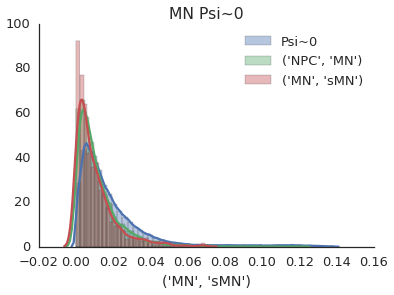

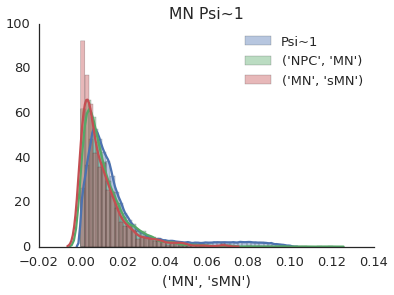

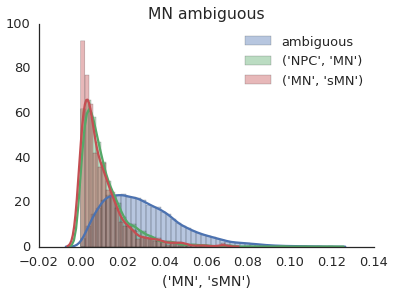

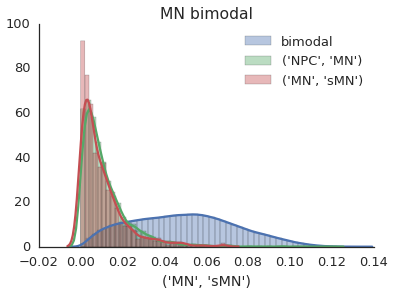

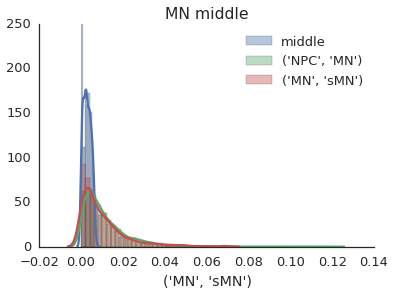

...

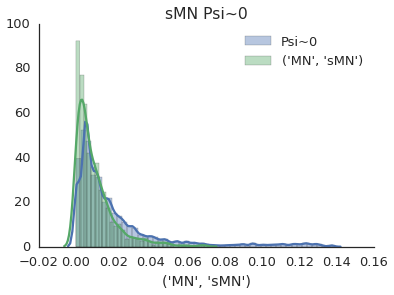

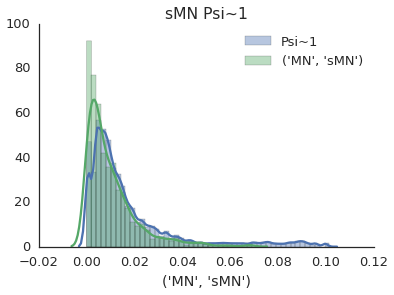

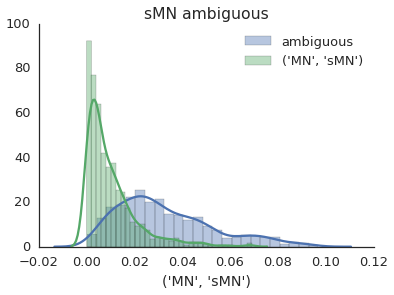

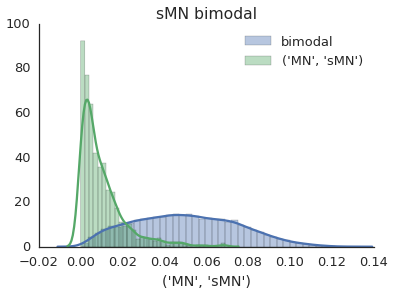

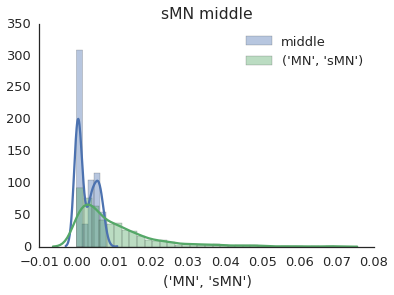

In [187]:
for (phenotype, modality), s in within_modality.groupby(level=[0,1]):
    fig, ax = plt.subplots()
    sns.distplot(s.values[0], kde=True, label=modality)
    cols = [x for x in nmf_space_transitions.columns if phenotype in x]
    for col in cols:
        sns.distplot(nmf_space_transitions[col].dropna(), label=str(col), kde=True)
    ax.set_title('{} {}'.format(phenotype, modality))
    ax.legend(loc='best')
    sns.despine()

In [190]:
within_modality_df = within_modality.reset_index()
within_modality_df = within_modality_df.rename(columns={0:'distances'})
within_modality_df.head()

,phenotype,modality,distances
0,MN,Psi~0,"[0.0188571242046, 0.0160931226609, 0.008444436..."
1,MN,Psi~1,"[0.00419108086789, 0.00810924422167, 0.0053191..."
2,MN,ambiguous,"[0.0322027955126, 0.00587102503357, 0.01617454..."
3,MN,bimodal,"[0.0299646503928, 0.0118740258104, 0.047491036..."
4,MN,middle,"[0.000513053946215, 0.000693965321993, 0.00062..."


In [194]:
study.splicing.modality_visualizer.modality_order

['Psi~0', 'middle', 'Psi~1', 'bimodal', 'ambiguous']

In [196]:
g.facet_data?

ValueError: need more than 2 values to unpack

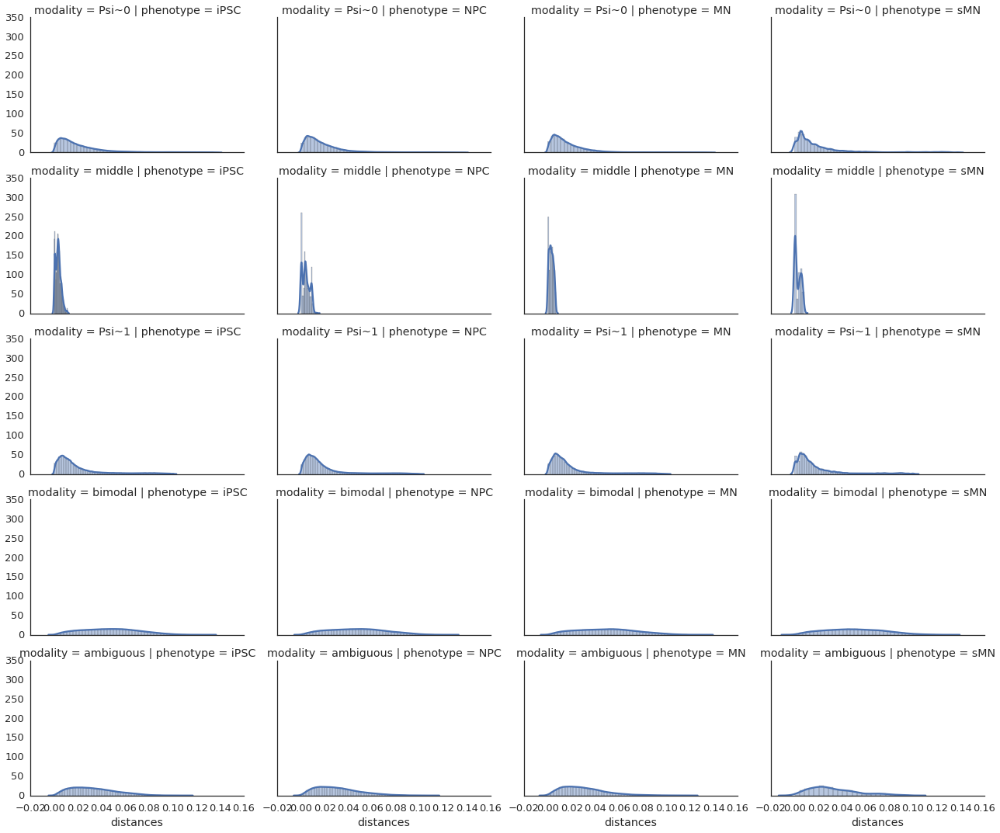

In [198]:
def distplot(s, **kwargs):
    sns.distplot(s.values[0], kde=True, label=modality, **kwargs)


g = sns.FacetGrid(within_modality_df, col='phenotype', col_order=study.phenotype_order,
                 row='modality', size=3, aspect=1.5, row_order=study.splicing.modality_visualizer.modality_order)
g.map(distplot, 'distances')

for row_i, col_j, hue_k in g.facet_data():
    cols = [x for x in nmf_space_transitions.columns if phenotype in g.col_names[col_j]]
    
    ax = g.axes[row_i, col_j]
    for col in cols:
        sns.distplot(nmf_space_transitions[col].dropna(), label=str(col), kde=True, ax=ax)


In [65]:
from scipy.spatial import distance
mean_within_modality = nmf_positions_tidy_modalities_shuffled.groupby(['phenotype', 'modality'])[['pc_1', 'pc_2']].apply(
    lambda x: np.mean(distance.pdist(x)))
mean_within_modality

phenotype  modality 
MN         Psi~0        0.019060
           Psi~1        0.018200
           ambiguous    0.030234
           bimodal      0.049157
           middle       0.002936
NPC        Psi~0        0.019757
           Psi~1        0.017985
           ambiguous    0.030678
           bimodal      0.047444
           middle       0.004148
iPSC       Psi~0        0.023136
           Psi~1        0.019591
           ambiguous    0.032694
           bimodal      0.047094
           middle       0.003432
sMN        Psi~0        0.020841
           Psi~1        0.017606
           ambiguous    0.032874
           bimodal      0.050054
           middle       0.002708
dtype: float64

In [73]:
from scipy.spatial import distance
nmf_positions_tidy_modalities_shuffled.groupby(['phenotype', 'modality'])[['pc_1', 'pc_2']].apply(lambda x: np.mean(distance.pdist(x)))


phenotype  modality 
MN         Psi~0        0.019060
           Psi~1        0.018200
           ambiguous    0.030234
           bimodal      0.049157
           middle       0.002936
NPC        Psi~0        0.019757
           Psi~1        0.017985
           ambiguous    0.030678
           bimodal      0.047444
           middle       0.004148
iPSC       Psi~0        0.023136
           Psi~1        0.019591
           ambiguous    0.032694
           bimodal      0.047094
           middle       0.003432
sMN        Psi~0        0.020841
           Psi~1        0.017606
           ambiguous    0.032874
           bimodal      0.050054
           middle       0.002708
dtype: float64

In [78]:
mean_within_modality.mean()

0.024481379271633161

In [199]:
big_nmf_distances = nmf_space_transitions_tidy.ix[nmf_space_transitions_tidy.distance > (
        mean_within_modality.mean() + mean_within_modality.std())]
print(big_nmf_distances.event_name.unique().shape)
big_nmf_distances.head()

(308,)


,event_name,transition,distance
17,chr10:103360960:103361093:+@chr10:103364897:10...,"(NPC, MN)",0.041639
63,chr10:105156166:105156270:-@chr10:105155503:10...,"(iPSC, NPC)",0.082118
66,chr10:105156166:105156270:-@chr10:105155503:10...,"(iPSC, NPC)",0.059283
68,chr10:105156166:105156270:-@chr10:105155503:10...,"(iPSC, NPC)",0.040292
163,chr10:13370351:13370450:-@chr10:13364835:13365...,"(iPSC, NPC)",0.054436


In [200]:
big_nmf_distances.to_csv('/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure2_splicing/nmf_distances_tidy_big_stressed.csv',
                        index=False)

In [80]:
big_nmf_distances.pivot(index='event_name', columns='transition', values='distance')

transition,"(MN, sMN)","(NPC, MN)","(iPSC, NPC)"
event_name,,,
chr10:102746506:102746732:-@chr10:102743705:102743831:-@chr10:102743512:102743574:-,NaN,NaN,0.031273
chr10:103360960:103361093:+@chr10:103364897:103364969:+@chr10:103368624:103368801:+,NaN,0.041639,NaN
chr10:105155503:105155789:-@chr10:105153956:105154151:-@chr10:105152128:105152223:-,NaN,0.026731,0.026794
chr10:105156166:105156270:-@chr10:105155503:105155789:-@chr10:105152128:105152223:-,NaN,NaN,0.082118
chr10:105156166:105156270:-@chr10:105155503:105155789:-@chr10:105153956:105154151:-,NaN,NaN,0.059283
chr10:105156166:105156270:-@chr10:105155503:105155789:-@chr10:105153956:105154151:-@chr10:105152128:105152223:-,NaN,NaN,0.040292
chr10:111890121:111890244:+@chr10:111892063:111892158:+@chr10:111893084:111895323:+,NaN,NaN,0.028947
chr10:112723883:112724819:+@chr10:112745386:112745523:+@chr10:112760173:112760303:+,NaN,0.026360,NaN
chr10:120101782:120101839:-@chr10:120101239:120101439:-@chr10:120095694:120095935:-,NaN,0.024631,NaN


In [82]:
big_nmf_distances = big_nmf_distances.join(study.splicing.feature_data, on='event_name')

In [85]:
background = study.splicing.feature_data.one_ensembl_id[nmf_space_transitions.index]

for name, df in big_nmf_distances.groupby('transition'):
    feature_ids = df['one_ensembl_id']
    go = study.go_enrichment(feature_ids, background)
    print name 
    print go.head()

('MN', 'sMN')
                              features_of_interest_in_go_term  \
GO:0005515  ENSG00000115524,ENSG00000196776,ENSG0000012356...   
GO:0005634  ENSG00000115524,ENSG00000123562,ENSG0000009674...   
GO:0005654  ENSG00000140988,ENSG00000115524,ENSG0000013311...   
GO:0003723  ENSG00000140988,ENSG00000131051,ENSG0000009674...   
GO:0010467  ENSG00000140988,ENSG00000115524,ENSG0000010013...   

                 features_of_interest_in_go_term_gene_symbols  \
GO:0005515  SF3B1,CD47,MORF4L2,TRA2A,XRN2,SRSF7,VDAC2,RSF1...   
GO:0005634  SF3B1,MORF4L2,HNRNPH3,TRA2A,XRN2,SRSF7,RSF1,CO...   
GO:0005654  RPS2,SF3B1,TPT1,ZNF638,TDG,POLR2G,SRSF7,RSF1,S...   
GO:0003723  RPS2,RBM39,HNRNPH3,TRA2A,POLR2G,EIF4E,SRSF7,ZN...   
GO:0010467  RPS2,SF3B1,NHP2L1,POLR2G,EIF4E,SRSF7,SRRM1,EIF...   

                     go_domain          go_name  n_background_in_go_term  \
GO:0005515  molecular_function  protein binding                     1084   
GO:0005634  cellular_component          nucleus     

In [5]:
changing_modalities = modalities_tidy.groupby('event_name').filter(lambda x: len(x.modality.unique()) > 1)

In [6]:
range(3)

[0, 1, 2]

In [8]:
for i, (name, df) in zip(range(10), changing_modalities.set_index('phenotype').groupby('event_name')):
    phenotypes = [list(transition) for transition in phenotype_transitions if df.index.isin(transition).sum() == 2]
    modalities = [df.modality[p] for p in phenotypes]
    df2 = pd.DataFrame(phenotypes, columns=['phenotype1', 'phenotype2'])
    df2['modality1'], df2['modality2'] = zip(*modalities)
    df2['event_name']= df['event_name'].values[0]
    print df2

  phenotype1 phenotype2 modality1 modality2                      event_name
0       iPSC        NPC   bimodal        ~0  chr10:101473237-101476104:-|3p
  phenotype1 phenotype2 modality1 modality2                      event_name
0       iPSC        NPC        ~0   bimodal  chr10:101476219-101480743:-|3p
1        NPC         MN   bimodal        ~0  chr10:101476219-101480743:-|3p
  phenotype1 phenotype2 modality1 modality2                      event_name
0       iPSC        NPC        ~0   bimodal  chr10:101476219-101480743:-|5p
1        NPC         MN   bimodal        ~0  chr10:101476219-101480743:-|5p
  phenotype1 phenotype2 modality1 modality2                      event_name
0       iPSC        NPC        ~1   bimodal  chr10:101478258-101480743:-|3p
1        NPC         MN   bimodal        ~1  chr10:101478258-101480743:-|3p
  phenotype1 phenotype2 modality1 modality2                      event_name
0       iPSC        NPC        ~1   bimodal  chr10:101478258-101480743:-|5p
1        NPC

In [9]:
changing_modalities_2d = changing_modalities.pivot(values='modality', index='event_name', columns='phenotype')
changing_modalities_2d.head()

phenotype,MN,NPC,iPSC
event_name,,,
chr10:101473237-101476104:-|3p,NaN,~0,bimodal
chr10:101476219-101480743:-|3p,~0,bimodal,~0
chr10:101476219-101480743:-|5p,~0,bimodal,~0
chr10:101478258-101480743:-|3p,~1,bimodal,~1
chr10:101478258-101480743:-|5p,~1,bimodal,~1


In [10]:
changing_modalities_2d = changing_modalities_2d.reindex(columns=study.phenotype_order)
changing_modalities_2d.head()

phenotype,iPSC,NPC,MN
event_name,,,
chr10:101473237-101476104:-|3p,bimodal,~0,NaN
chr10:101476219-101480743:-|3p,~0,bimodal,~0
chr10:101476219-101480743:-|5p,~0,bimodal,~0
chr10:101478258-101480743:-|3p,~1,bimodal,~1
chr10:101478258-101480743:-|5p,~1,bimodal,~1


In [11]:
background = study.splicing.feature_data.one_ensembl_id[modalities_tidy.event_name.unique()]

In [162]:
modalities_assignments_2d = modalities_assignments.T

In [170]:
!mkdir /home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure3_modalities

In [230]:
range(3)

[0, 1, 2]

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
figure_folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure4_voyages'

for phenotypes in phenotype_transitions:
    grouped = modalities_assignments_2d.groupby(list(phenotypes))
    df = grouped.filter(lambda x: x.count().sum() == 2)
    go_results = grouped.apply(lambda x: study.go_enrichment(study.splicing.feature_data.one_ensembl_id[x.index], 
                                                                      background=background))
    for modality, go_result in go_results.groupby(level=[0, 1], axis=0):
        fig, ax = plt.subplots(figsize=(12, 6))
        go_result = go_result.ix[go_result.p_value < 0.01]
        s = -np.log10(go_result.set_index('go_name').p_value)[:20]
        s.plot(kind='barh', ax=ax)
        ax.set_title('{}\n{}'.format('$\\rightarrow$'.join(phenotypes), '$\\rightarrow$'.join(modality)))
        ax.set_xlabel('$-\log_{10}$ $p$-value')
        sns.despine()
        filename = 'modality_transitions_go_{}_{}.pdf'.format('_'.join(phenotypes), '_'.join(modality))
        fig.tight_layout()
        fig.savefig('{}/{}'.format(figure_folder, filename))

NameError: name 'modalities_assignments_2d' is not defined

### hmmscan with alignments for big NMF changing events

In [201]:
changing_events = big_nmf_distances.event_name.unique()

In [222]:
range(3)

[0, 1, 2]

In [227]:
from gscripts.qtools import Submitter
from Bio import SeqIO
from glob import glob 

changing_event_seqrecords = []

for fasta in glob('/projects/ps-yeolab/obotvinnik/miso_helpers/hg19/*isoform*translated.fa'):
    for record in SeqIO.parse(fasta, 'fasta'):
        record_id = str(record.id)
        if record_id.split('_')[0] in changing_events:
#             print record.id
#             print record.name
            changing_event_seqrecords.append(record)
print(len(changing_event_seqrecords))

119


In [228]:
from Bio import SeqIO

folder = '/home/obotvinnik/Dropbox/figures2/singlecell_pnm/figure2_splicing/'
fasta_file = '{}/nmf_distances_tidy_big_stressed_translations.fasta'.format(folder)

with open(fasta_file, 'w') as f:
    SeqIO.write(changing_event_seqrecords, f, 'fasta')

In [229]:
commands = []

n_processors = 8
pfam_a = '/projects/ps-yeolab/genomes/pfam/release_27/ftp.sanger.ac.uk/pub/databases/Pfam/releases/Pfam27.0/Pfam-A.hmm'

# for isoform_number in (1, 2):
#     fasta = '/projects/ps-yeolab/obotvinnik/miso_helpers/hg19/mxe_isoform{}_translated.fa'.format(isoform_number)
#     hmmscan_out = '/projects/ps-yeolab/obotvinnik/miso_helpers/hg19/mxe_isoform{}_hmmscan_pfamA.txt'.format(isoform_number)
fasta = fasta_file
hmmscan_out = '{}.hmmscan_pfamA.txt'.format(fasta_file)
command = 'hmmscan -o {} --cpu {} --notextw {} {}'.format(hmmscan_out, n_processors, pfam_a, fasta)
commands.append(command)
sub = Submitter(commands, 'hmmscan_changing_events', walltime='1:00:00', 
                ppn=n_processors, write_and_submit=True, array=False, queue='home-yeo',
                err_filename=hmmscan_out+'.err', out_filename=hmmscan_out+'.out')

job ID: 2884690


In [208]:
rab7a_event = 'chr3:128516786:128516912:+@chr3:128526386:128526514:+@chr3:128532170:128533641:+'

In [210]:
snap25_event = 'chr20:10265372:10265420:+@chr20:10273530:10273647:+@chr20:10273809:10273926:+@chr20:10277573:10277698:+'

In [213]:
study.splicing.data[[rab7a_event, snap25_event]].corr()

,chr3:128516786:128516912:+@chr3:128526386:128526514:+@chr3:128532170:128533641:+,chr20:10265372:10265420:+@chr20:10273530:10273647:+@chr20:10273809:10273926:+@chr20:10277573:10277698:+
chr3:128516786:128516912:+@chr3:128526386:128526514:+@chr3:128532170:128533641:+,1.000000,0.364829
chr20:10265372:10265420:+@chr20:10273530:10273647:+@chr20:10273809:10273926:+@chr20:10277573:10277698:+,0.364829,1.000000


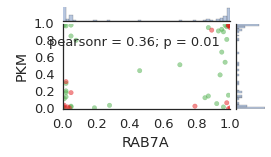

In [221]:

study.plot_two_features(rab7a_event, snap25_event, data_type='splicing')
fig = plt.gcf()
ax = fig.axes[0]
ax.set(xlabel='RAB7A', ylabel='PKM')

In [218]:
fig.axes

In [ ]:
rab7a_psi = study.splicing.data[rab7a_event]
snap25_psi = sut